In [1]:
%reload_ext autoreload
%autoreload 2

In [2]:
from PDESolver import *

# 1D Tests

## 1D stationnary equation with psiOp()


*********************************
* Partial differential equation *
*********************************

     ⎛ 2          ⎞         
psiOp⎝ξ  + 1, u(x)⎠ = sin(x)

********************
* Equation parsing *
********************


Equation rewritten in standard form: -sin(x) + psiOp(xi**2 + 1, u(x))
⚠️ psiOp detected: skipping expansion for safety

Expanded equation: -sin(x) + psiOp(xi**2 + 1, u(x))
Analyzing term: -sin(x)
  --> Classified as source term
Analyzing term: psiOp(xi**2 + 1, u(x))
  --> Classified as pseudo linear term (psiOp)
Final linear terms: {}
Final nonlinear terms: []
Symbol terms: []
Pseudo terms: [(1, xi**2 + 1)]
Source terms: [-sin(x)]
⚠️  Pseudo‑differential operator detected: all other linear terms have been rejected.

symbol = 
 2    
ξ  + 1
⚠️ For psiOp, use interactive_symbol_analysis.

symbol = 
 2    
ξ  + 1
✅ Elliptic pseudo-differential symbol: inversion allowed.
Right inverse asymptotic symbol:
  1   
──────
 2    
ξ  + 1
⚡ Optimization: symbol independent 

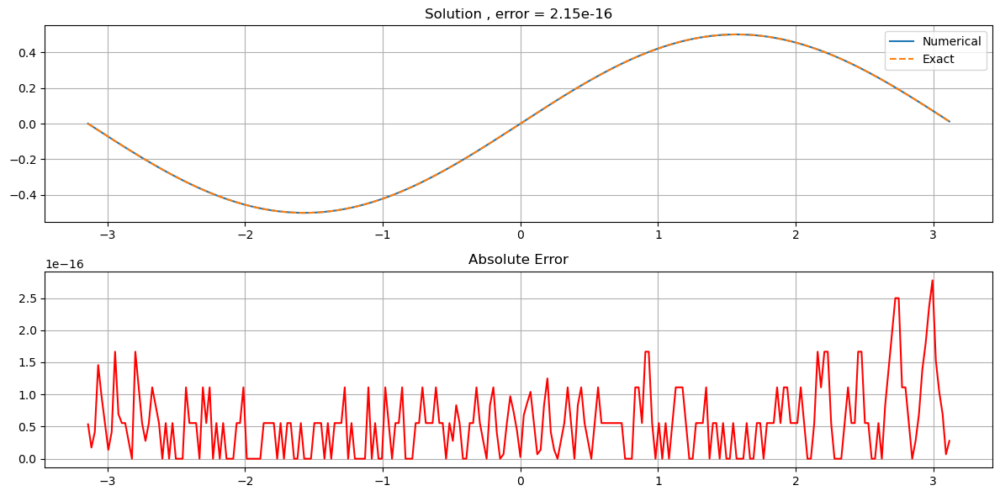

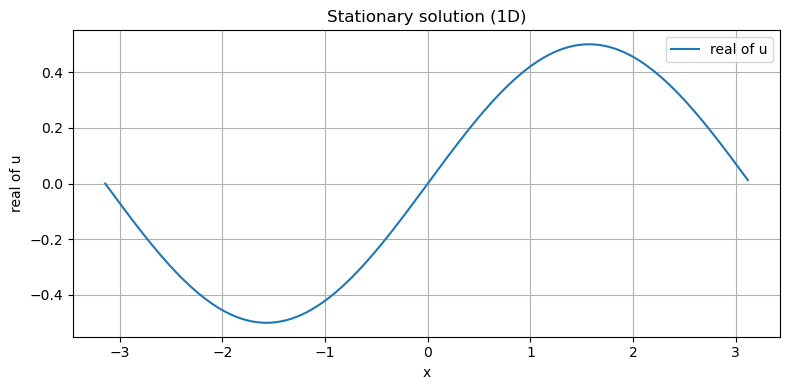

In [3]:
# Define symbolic variables
x, xi = symbols('x xi')
u = Function('u')(x)

# Define the PDE: psiOp[xi^2 + 1, u](x) = 0
equation = Eq(psiOp(xi**2 + 1, u), sin(x))  # rhs will be overwritten

# Define exact solution

def u_exact(x):
    return np.sin(x)/2

# Create the solver
solver = PDESolver(equation)

# Setup parameters
Lx = 2 * np.pi
Nx = 256
solver.setup(Lx=Lx, Nx=Nx, initial_condition=None)

# Solve the stationary problem
u_num = solver.solve_stationary_psiOp(order=1)

# Exact solution on grid
u_ref = u_exact(solver.X)

# Compute relative L2 error
error = np.linalg.norm(np.real(u_num) - u_ref) / np.linalg.norm(u_ref)

solver.test(u_exact=u_exact, threshold=5e-3, component='abs')

solver.show_stationary_solution(u=u_num, component='real')

## 1D stationnary equation with psiOp() depending on $x$


*********************************
* Partial differential equation *
*********************************

                                         2
     ⎛ 2    2          ⎞   ⎛       2⎞  -x 
psiOp⎝x  + ξ  + 1, u(x)⎠ = ⎝3 - 3⋅x ⎠⋅ℯ   

********************
* Equation parsing *
********************


Equation rewritten in standard form: -(3 - 3*x**2)*exp(-x**2) + psiOp(x**2 + xi**2 + 1, u(x))
⚠️ psiOp detected: skipping expansion for safety

Expanded equation: -(3 - 3*x**2)*exp(-x**2) + psiOp(x**2 + xi**2 + 1, u(x))
Analyzing term: -(3 - 3*x**2)*exp(-x**2)
  --> Classified as source term
Analyzing term: psiOp(x**2 + xi**2 + 1, u(x))
  --> Classified as pseudo linear term (psiOp)
Final linear terms: {}
Final nonlinear terms: []
Symbol terms: []
Pseudo terms: [(1, x**2 + xi**2 + 1)]
Source terms: [-(3 - 3*x**2)*exp(-x**2)]
⚠️  Pseudo‑differential operator detected: all other linear terms have been rejected.

symbol = 
 2    2    
x  + ξ  + 1
⚠️ For psiOp, use interactive_symbol_analysis.

s

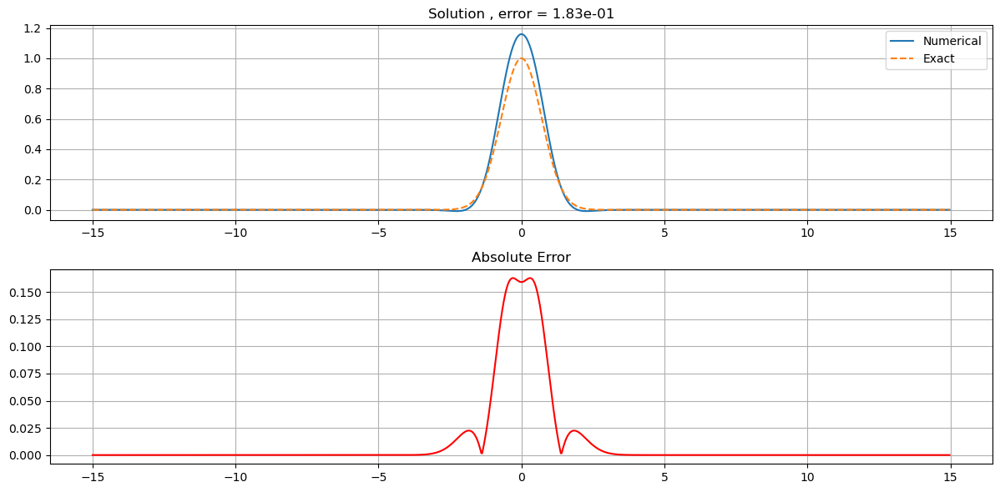

In [4]:
# Define symbolic variables
x, xi = symbols('x xi', real=True)
u = Function('u')(x)

# Define the symbol
p_symbol = xi**2 + x**2 + 1

# Define the right-hand side f(x) = P[u_exact]
f_expr = 3 * (1 - x**2) * exp(-x**2)

# Define the full equation: P[u] = f
equation = Eq(psiOp(p_symbol, u), f_expr)

# Exact and initial
def u_exact(x): return np.exp(-x**2)


solver = PDESolver(equation)
solver.setup(Lx=30, Nx=1024, initial_condition=None)

u_num = solver.solve_stationary_psiOp(order=1)
solver.test(u_exact=u_exact, threshold=2, component='real')


## 1D integro-differential equation


*********************************
* Partial differential equation *
*********************************

∂                          ⎛   -ⅈ              ⎞   ∂          
──(u(t, x)) = -u(t, x) + Op⎜──────────, u(t, x)⎟ + ──(u(t, x))
∂t                         ⎝kx + 0.001         ⎠   ∂x         

********************
* Equation parsing *
********************


Equation rewritten in standard form: u(t, x) - Op(-I/(kx + 0.001), u(t, x)) + Derivative(u(t, x), t) - Derivative(u(t, x), x)

Expanded equation: u(t, x) - Op(-I/(kx + 0.001), u(t, x)) + Derivative(u(t, x), t) - Derivative(u(t, x), x)
Analyzing term: u(t, x)
  --> Classified as linear
Analyzing term: -Op(-I/(kx + 0.001), u(t, x))
  --> Classified as symbolic linear term (Op)
Analyzing term: Derivative(u(t, x), t)
  Derivative found: Derivative(u(t, x), t)
  --> Classified as linear
Analyzing term: -Derivative(u(t, x), x)
  Derivative found: Derivative(u(t, x), x)
  --> Classified as linear
Final linear terms: {u(t, x): 1, Derivative(

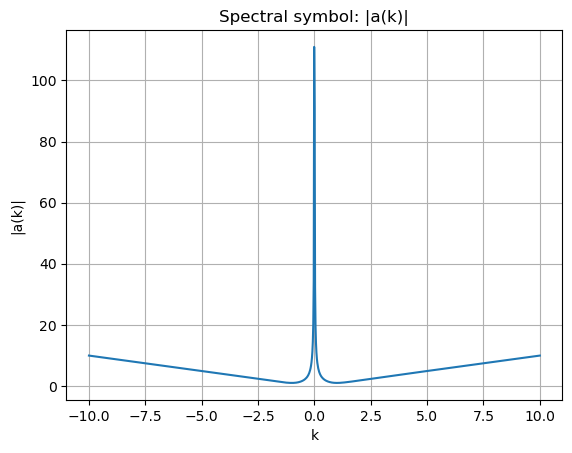


*******************
* Solving the PDE *
*******************

Closest available time to t_eval=0.0: 0.0
Test error t = 0.0: 6.749e-02


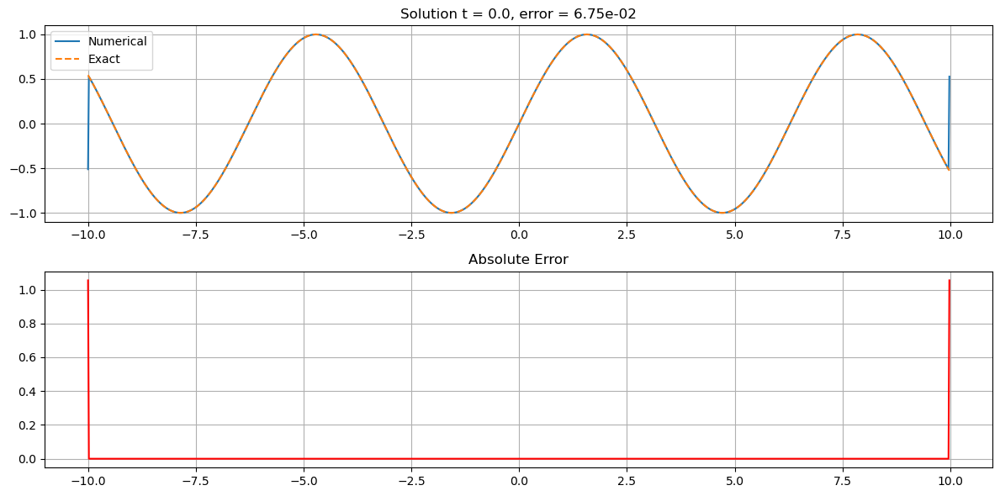

Closest available time to t_eval=0.5: 0.5
Test error t = 0.5: 2.484e-01


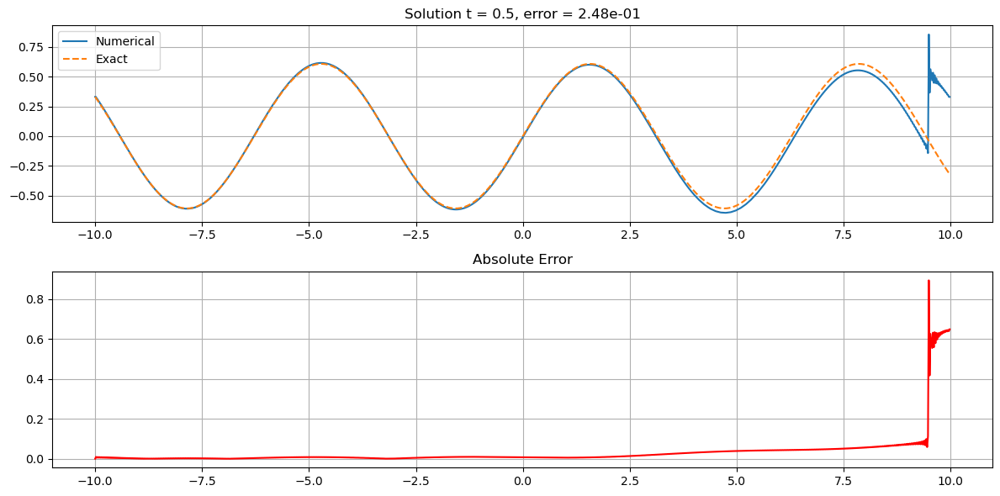

Closest available time to t_eval=1.0: 1.0
Test error t = 1.0: 3.472e-01


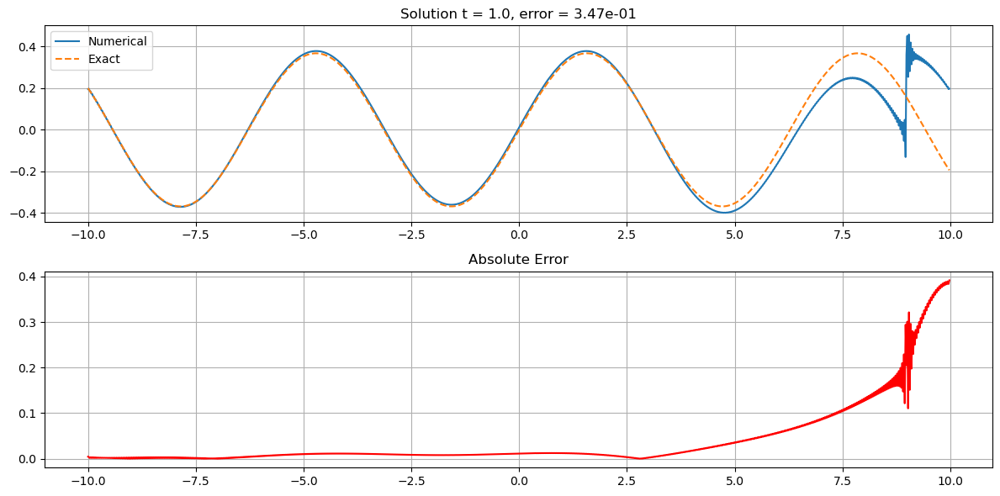

Closest available time to t_eval=1.5: 1.5
Test error t = 1.5: 4.210e-01


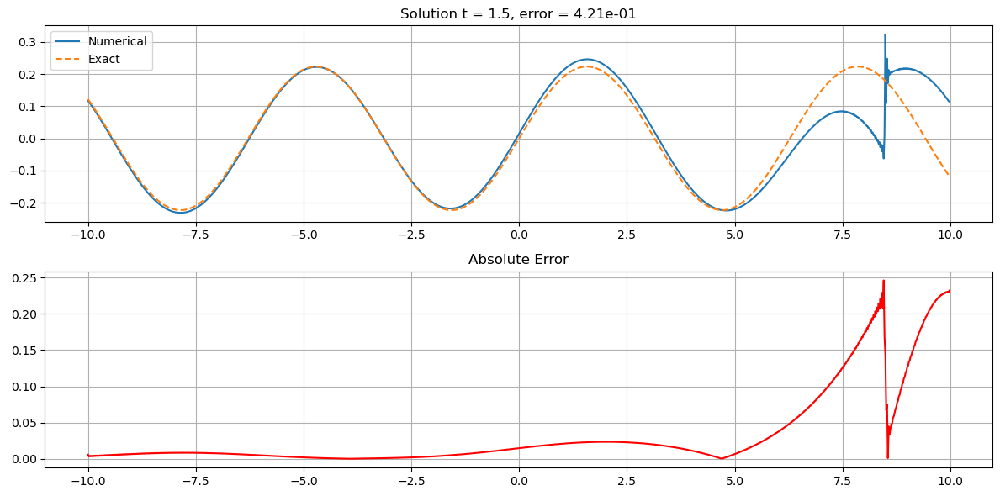

Closest available time to t_eval=2.0: 2.0
Test error t = 2.0: 4.840e-01


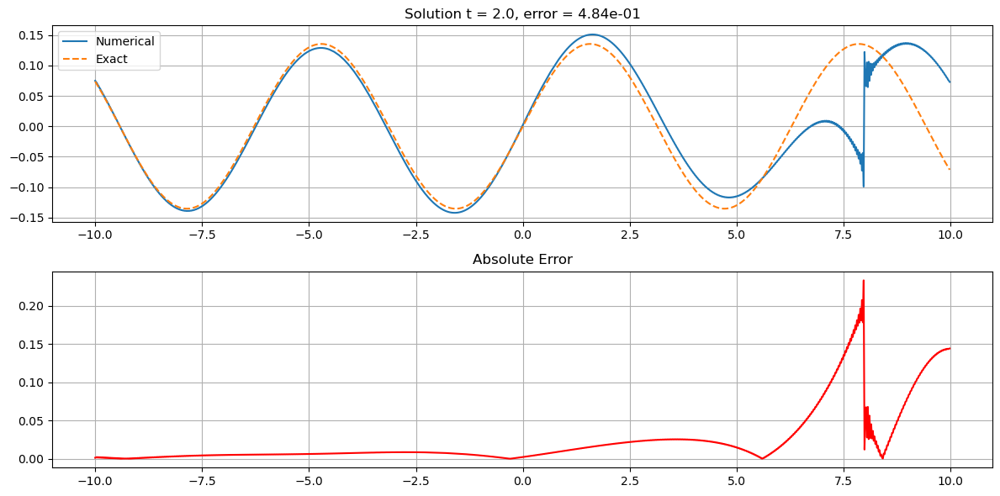

In [5]:
# Define the symbols and the integro-differential equation
t, x, kx, xi, omega = symbols('t x kx xi omega')
u_func = Function('u')
u = u_func(t, x)
eps = 0.001
# Define the equation with an integral term using Op
integral_term = Op(1 / (I * (kx + eps)), u)

eq = Eq(diff(u, t), diff(u, x) + integral_term - u)

# Create the solver
# solver = PDESolver(eq, time_scheme='ETD-RK4', dealiasing_ratio=2/3)
solver = PDESolver(eq, time_scheme='ETD-RK4')

# Simulation parameters
Lt = 2.0  # Total simulation time
Lx = 20   # Spatial domain size
Nx = 1024 # Number of grid points
Nt = 200  # Number of time steps

# Initial condition
initial_condition = lambda x: np.sin(x)

# Setup the solver
solver.setup(
    Lx=Lx, Nx=Nx, Lt=Lt, Nt=Nt,
    initial_condition=initial_condition
)

# Solve the equation
solver.solve()

# Exact solution at any time t
def u_exact(x, t):
    return np.exp(-t) * np.sin(x)

# Automatic testing at multiple times
n_test = 4
test_set = [
    solver.test(
        u_exact=u_exact,
        t_eval=i * Lt / n_test,
        threshold=0.5,  # Adjust threshold if necessary
        component='real'
    )
    for i in range(n_test + 1)
]


## 1D convolution equation


*********************************
* Partial differential equation *
*********************************

∂                ⎛  2.0           ⎞
──(u(t, x)) = -Op⎜───────, u(t, x)⎟
∂t               ⎜  2             ⎟
                 ⎝kx  + 1         ⎠

********************
* Equation parsing *
********************


Equation rewritten in standard form: Op(2.0/(kx**2 + 1), u(t, x)) + Derivative(u(t, x), t)

Expanded equation: Op(2.0/(kx**2 + 1), u(t, x)) + Derivative(u(t, x), t)
Analyzing term: Op(2.0/(kx**2 + 1), u(t, x))
  --> Classified as symbolic linear term (Op)
Analyzing term: Derivative(u(t, x), t)
  Derivative found: Derivative(u(t, x), t)
  --> Classified as linear
Final linear terms: {Derivative(u(t, x), t): 1}
Final nonlinear terms: []
Symbol terms: [(1, 2.0/(kx**2 + 1))]
Pseudo terms: []
Source terms: []

*******************************
* Linear operator computation *
*******************************


Characteristic equation before symbol treatment:
-ⅈ⋅ω

--- Symbolic symbol an

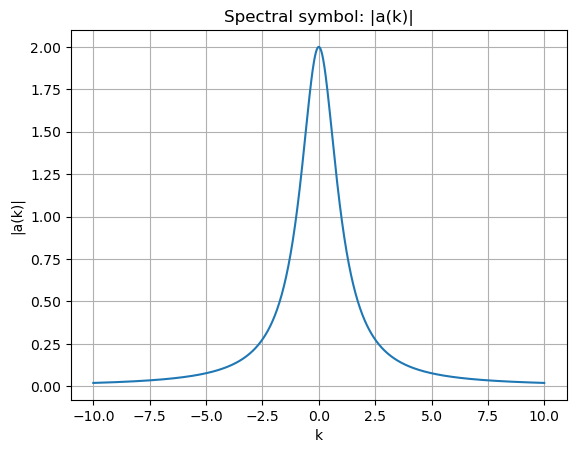


*******************
* Solving the PDE *
*******************

Closest available time to t_eval=0.0: 0.0
Test error t = 0.0: 1.065e-04


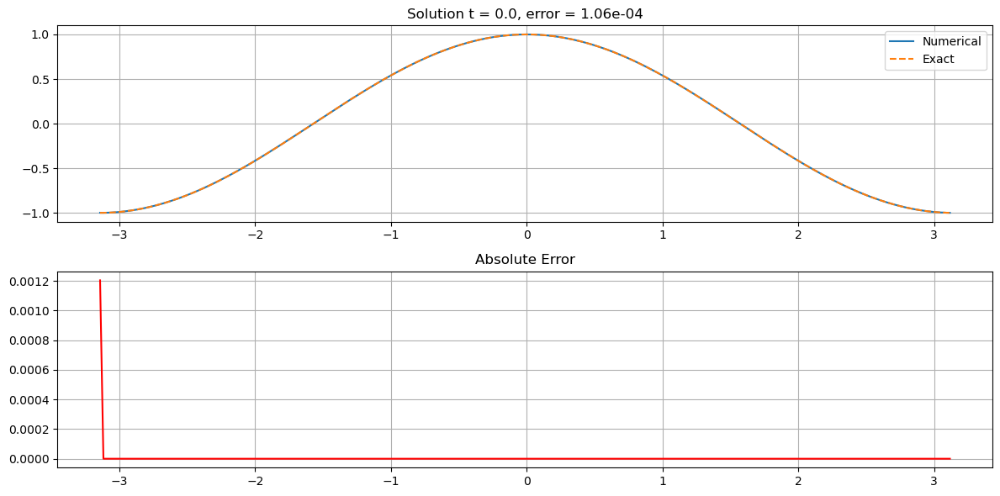

Closest available time to t_eval=0.5: 0.5
Test error t = 0.5: 1.055e-04


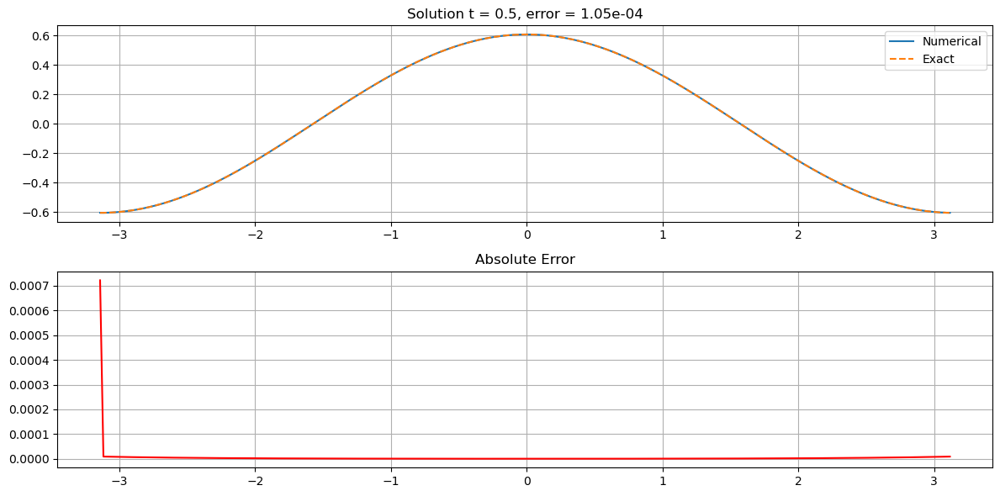

Closest available time to t_eval=1.0: 1.0
Test error t = 1.0: 1.048e-04


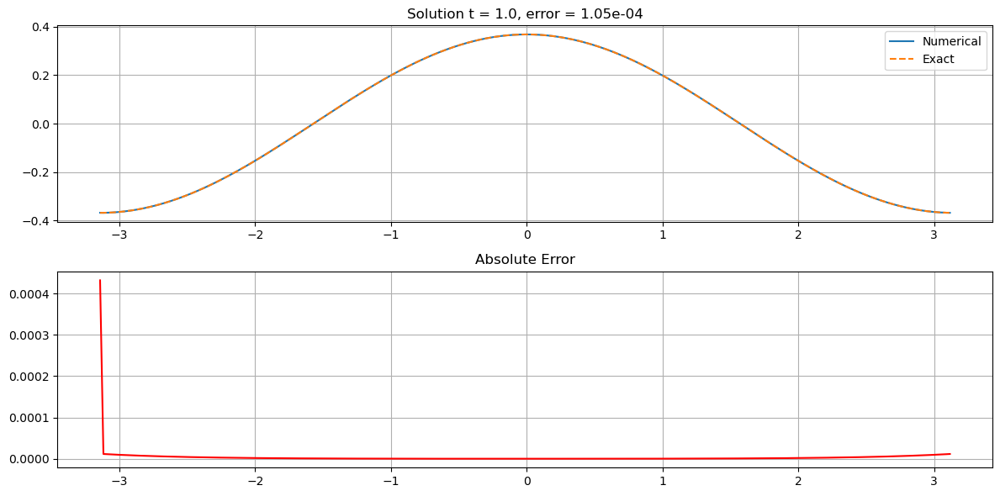

Closest available time to t_eval=1.5: 1.5
Test error t = 1.5: 1.042e-04


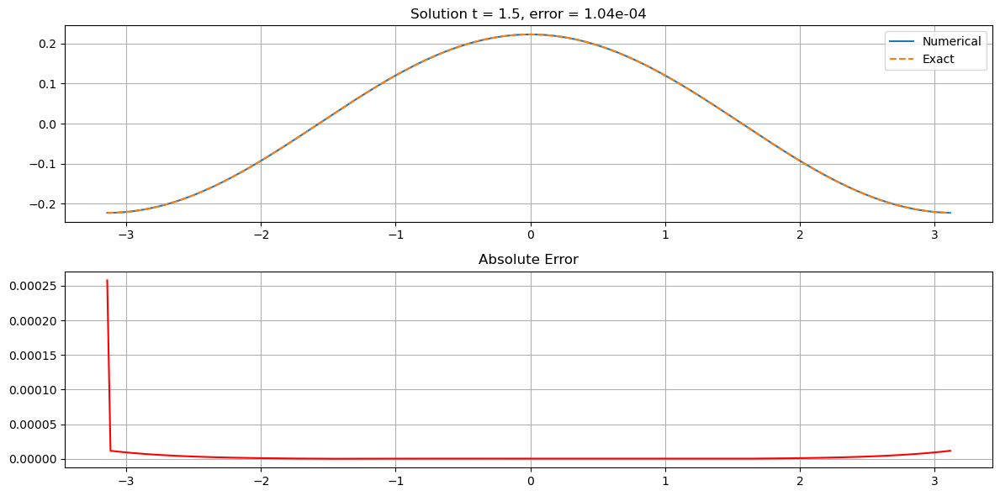

Closest available time to t_eval=2.0: 2.0
Test error t = 2.0: 1.040e-04


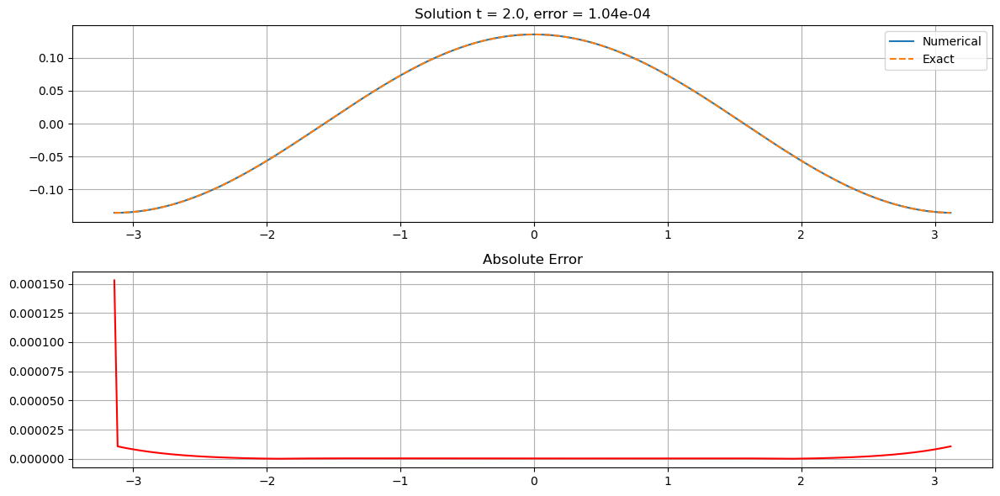

In [6]:
# Define symbols
t, x, kx, xi, omega, lam = symbols('t x kx xi omega lambda')
u_func = Function('u')
u = u_func(t, x)
lam = 1.0
# Define the kernel f(x) = exp(-lambda * |x|)
f_kernel = exp(-lam * Abs(x))

# Convolution equation: ∂t u = - OpConv(f_kernel, u)
eq = Eq(diff(u, t), -Op(fourier_transform(f_kernel, x, kx/(2*pi)), u))

# Create solver with lambda=1
solver = PDESolver(eq.subs(lam, 1), time_scheme='ETD-RK4')

# Simulation parameters
Lt = 2.0
solver.setup(
    Lx=2 * np.pi, Nx=256, Lt=Lt, Nt=100,
    initial_condition=lambda x: np.cos(x)
)

# Solve
solver.solve()

# Exact solution: u(x, t) = cos(x) * exp(- (2*lambda / (lambda^2 + k^2)) * t )
def u_exact(x, t):
    lam_val = 1.0
    k_val = 1.0  # mode k=1 (cos(x))
    decay = 2 * lam_val / (lam_val**2 + k_val**2)
    return np.cos(x) * np.exp(-decay * t)

# Automatic testing at multiple times
n_test = 4
test_set = [solver.test(u_exact=u_exact, t_eval=i * Lt / n_test, threshold=5e-3, component='abs')
            for i in range(n_test + 1)]


## 1D transport equation


*********************************
* Partial differential equation *
*********************************

∂              ∂          
──(u(t, x)) = -──(u(t, x))
∂t             ∂x         

********************
* Equation parsing *
********************


Equation rewritten in standard form: Derivative(u(t, x), t) + Derivative(u(t, x), x)

Expanded equation: Derivative(u(t, x), t) + Derivative(u(t, x), x)
Analyzing term: Derivative(u(t, x), t)
  Derivative found: Derivative(u(t, x), t)
  --> Classified as linear
Analyzing term: Derivative(u(t, x), x)
  Derivative found: Derivative(u(t, x), x)
  --> Classified as linear
Final linear terms: {Derivative(u(t, x), t): 1, Derivative(u(t, x), x): 1}
Final nonlinear terms: []
Symbol terms: []
Pseudo terms: []
Source terms: []

*******************************
* Linear operator computation *
*******************************


Characteristic equation before symbol treatment:
ⅈ⋅(kx - ω)

--- Symbolic symbol analysis ---
symb_omega: 0
symb_k: 0

Raw char

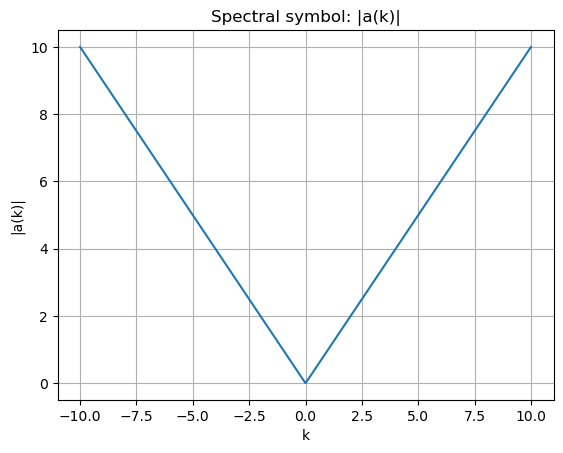


*******************
* Solving the PDE *
*******************



/home/fifi/pdesolver_prod/PDESolver.py:3443: RuntimeWarning: invalid value encountered in divide
  return np.where(np.abs(z) > 1e-12, (np.exp(z) - 1) / z, 1.0)
/home/fifi/pdesolver_prod/PDESolver.py:3446: RuntimeWarning: invalid value encountered in divide
  return np.where(np.abs(z) > 1e-12, (np.exp(z) - 1 - z) / z**2, 0.5)


Closest available time to t_eval=0.0: 0.0
Test error t = 0.0: 2.871e-12


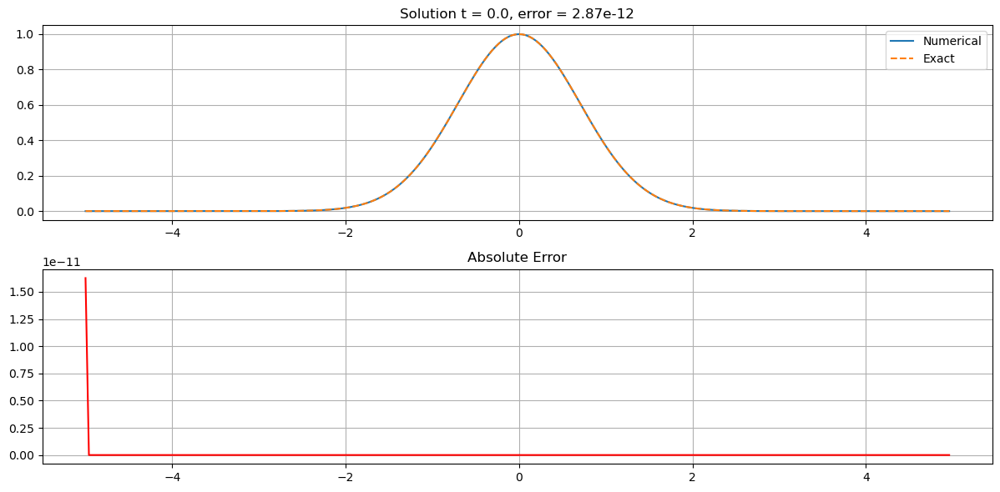

Closest available time to t_eval=1.0: 1.0
Test error t = 1.0: 4.749e-02


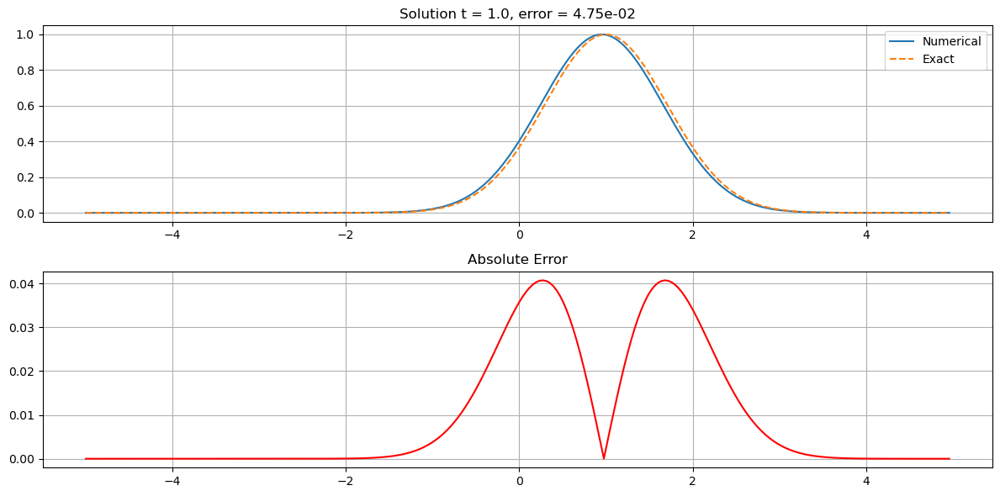

Closest available time to t_eval=2.0: 2.0
Test error t = 2.0: 4.749e-02


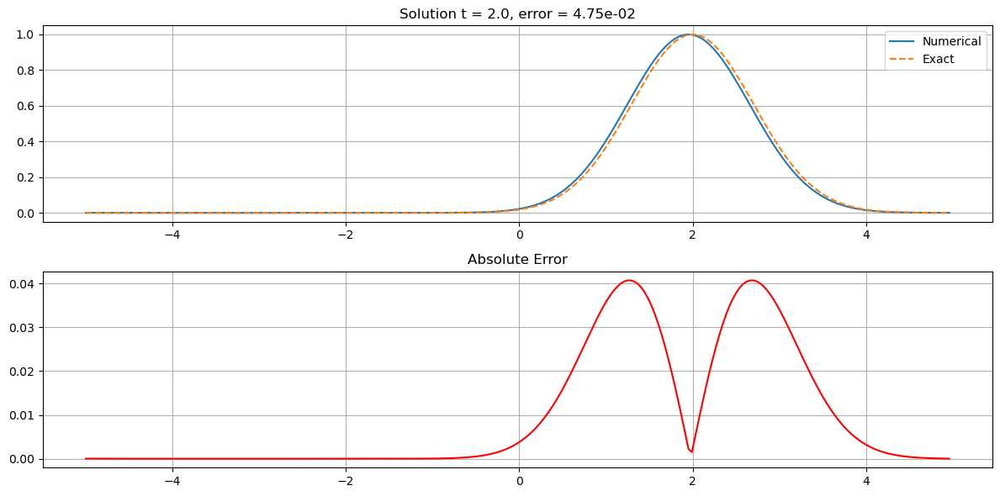

Closest available time to t_eval=3.0: 3.0
Test error t = 3.0: 4.749e-02


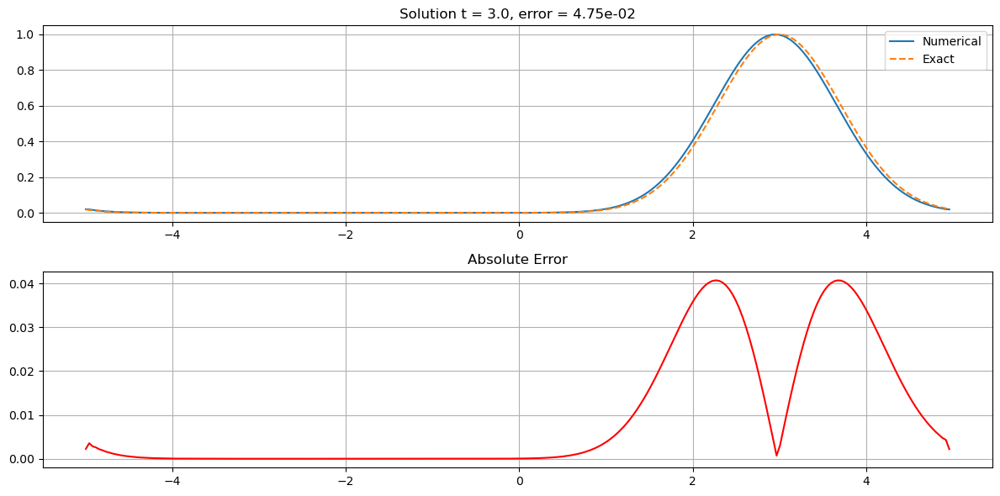

Closest available time to t_eval=4.0: 4.0
Test error t = 4.0: 4.761e-02


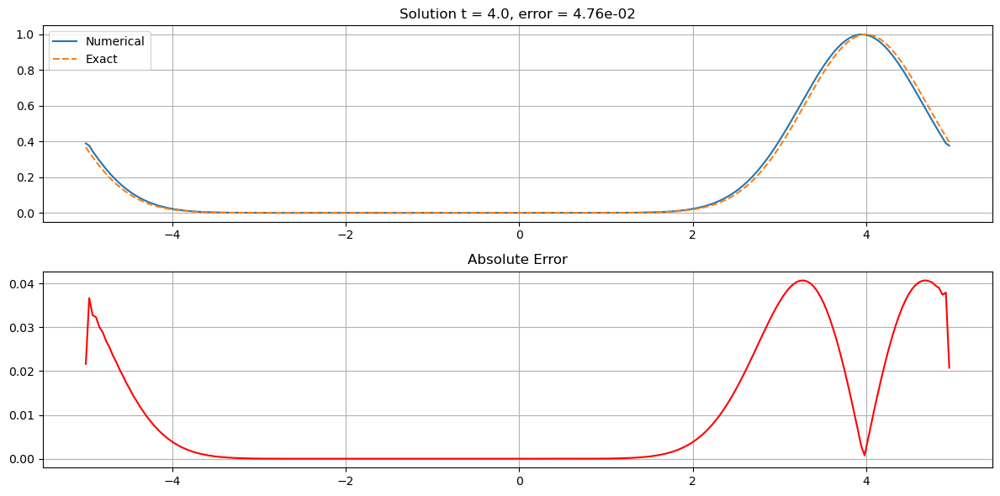

Closest available time to t_eval=5.0: 5.0
Test error t = 5.0: 4.788e-02


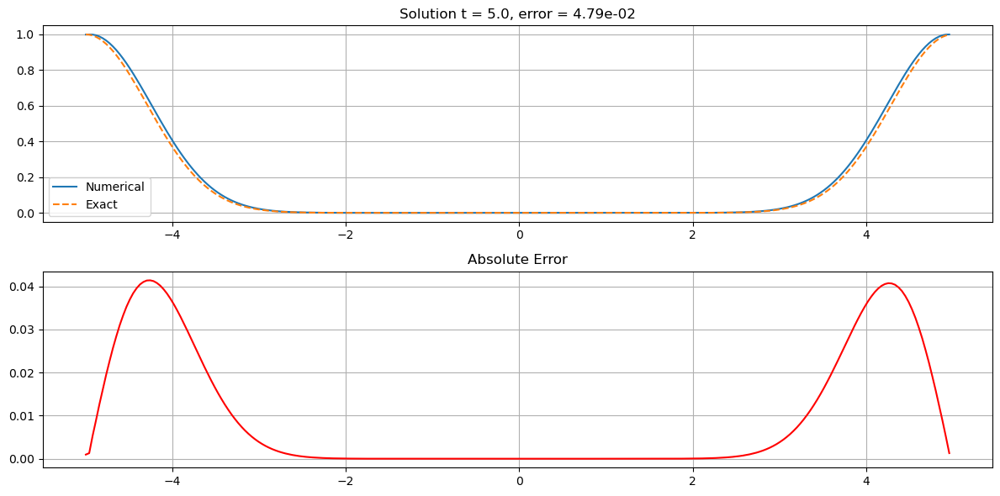

In [7]:
# Define the symbols and the 1D transport equation
t, x, kx, xi, omega = symbols('t x kx xi omega')
u_func = Function('u') 
u = u_func(t, x)

eq = Eq(diff(u, t), -diff(u, x))  # Rightward transport at speed +1

# Create the solver
solver = PDESolver(eq, time_scheme='ETD-RK4')
Lt=5.0
# Domain setup and initial condition
solver.setup(
    Lx=10, Nx=256, Lt=Lt, Nt=2000,
    initial_condition=lambda x: np.exp(-x**2)
)

# Solving
solver.solve()

# Exact solution at t = 2.0 (with periodic wrapping)
def u_exact(x, t):
    L = 10  # Domain length
    return np.exp(-((x - t + L/2) % L - L/2)**2)

# Automatic testing
n_test = 5
test_set = [solver.test(u_exact=u_exact, t_eval=i * Lt / n_test, threshold=5e-2, component='real') for i in range(n_test + 1)]

## 1D Fractional diffusion equation


*********************************
* Partial differential equation *
*********************************

∂                ⎛    1.5         ⎞
──(u(t, x)) = -Op⎝│kx│   , u(t, x)⎠
∂t                                 

********************
* Equation parsing *
********************


Equation rewritten in standard form: Op(Abs(kx)**1.5, u(t, x)) + Derivative(u(t, x), t)

Expanded equation: Op(Abs(kx)**1.5, u(t, x)) + Derivative(u(t, x), t)
Analyzing term: Op(Abs(kx)**1.5, u(t, x))
  --> Classified as symbolic linear term (Op)
Analyzing term: Derivative(u(t, x), t)
  Derivative found: Derivative(u(t, x), t)
  --> Classified as linear
Final linear terms: {Derivative(u(t, x), t): 1}
Final nonlinear terms: []
Symbol terms: [(1, Abs(kx)**1.5)]
Pseudo terms: []
Source terms: []

*******************************
* Linear operator computation *
*******************************


Characteristic equation before symbol treatment:
-ⅈ⋅ω

--- Symbolic symbol analysis ---
symb_omega: 0
symb_k: Abs(kx)**1.5

R

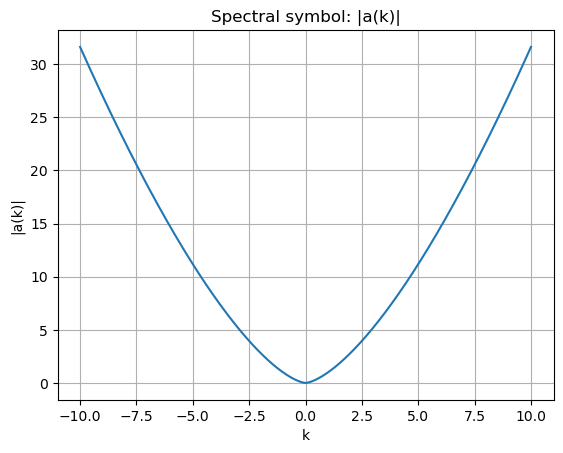


*******************
* Solving the PDE *
*******************

Closest available time to t_eval=0.0: 0.0
Test error t = 0.0: 6.134e-03


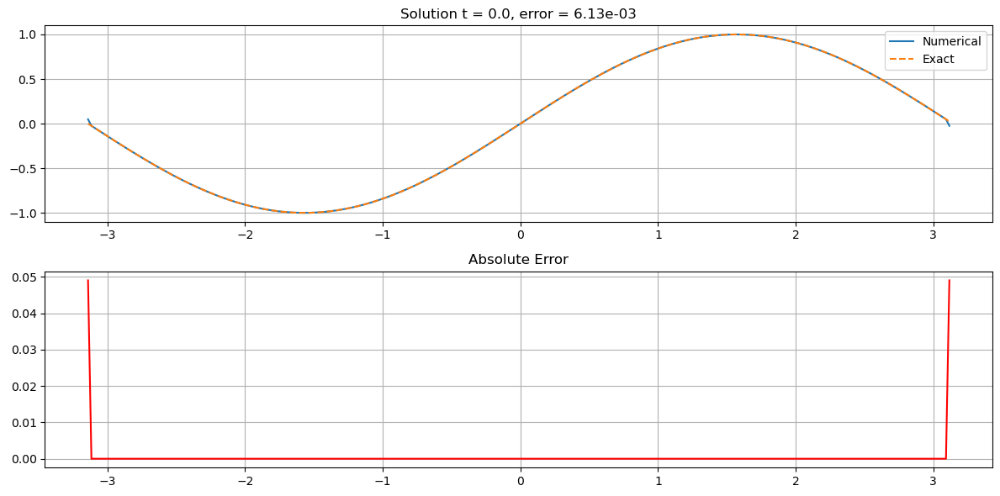

Closest available time to t_eval=0.5: 0.5
Test error t = 0.5: 1.888e-02


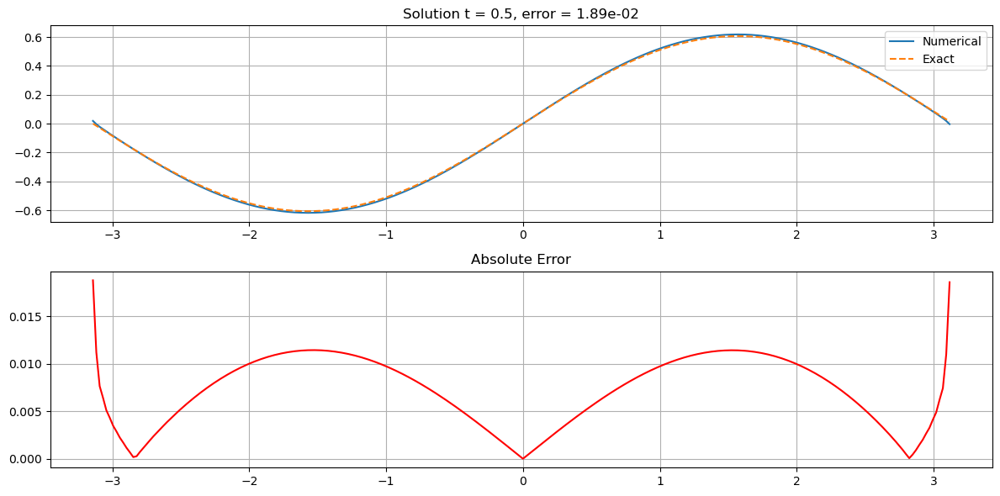

Closest available time to t_eval=1.0: 1.0
Test error t = 1.0: 1.771e-02


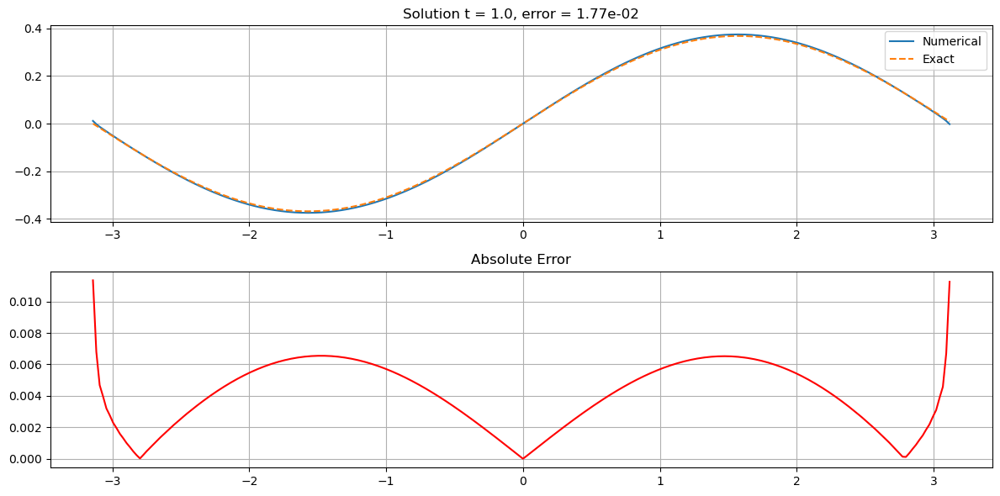

Closest available time to t_eval=1.5: 1.5
Test error t = 1.5: 1.651e-02


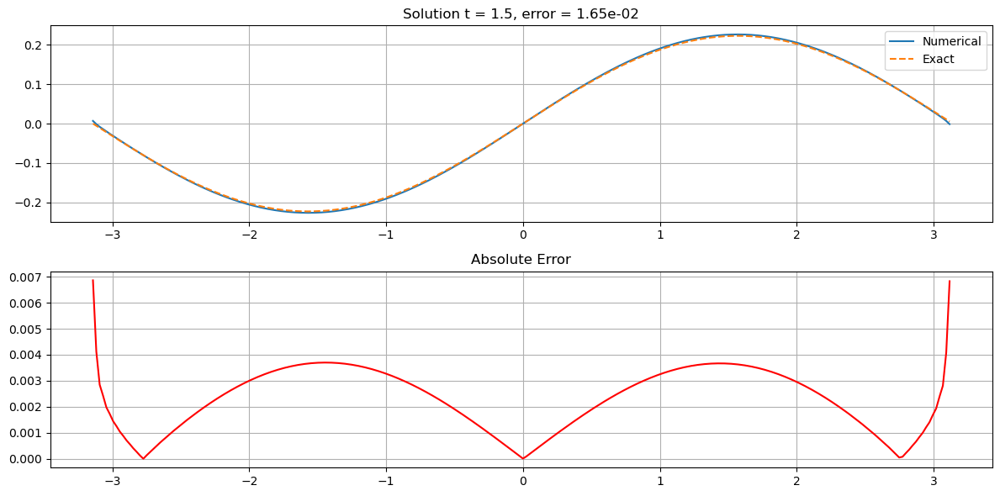

Closest available time to t_eval=2.0: 2.0
Test error t = 2.0: 1.530e-02


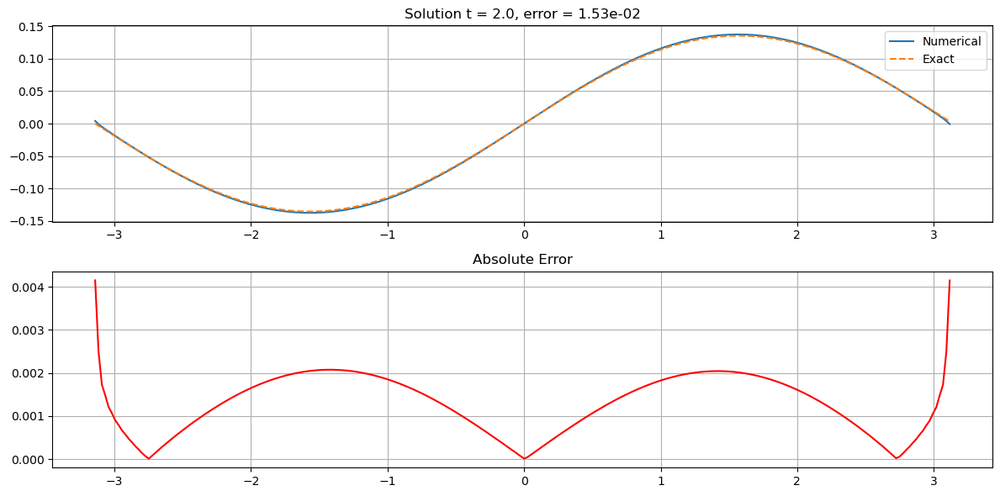

In [8]:
# Define the symbols and the equation
t, x, kx, xi, omega = symbols('t x kx xi omega')
u_func = Function('u') 
u = u_func(t, x)

# Fractional diffusion equation with alpha = 1.5 and added dissipation
alpha = 1.5
nu = 0.01  # Diffusion coefficient
# eq = Eq(diff(u, t), Op(abs(kx)**alpha, u) + nu * diff(u, x, 2))
eq = Eq(diff(u, t), -Op(abs(kx)**alpha, u))

# Create the solver
solver = PDESolver(eq, dealiasing_ratio=0.5, time_scheme='ETD-RK4')
Lt=2.0
# Domain and initial condition setup
solver.setup(
    Lx=2 * np.pi, Nx=256, Lt=Lt, Nt=2000,  # Reduced dt by increasing Nt
    initial_condition=lambda x: np.sin(x)
)

# Solve the equation
solver.solve()

# Exact solution function at t = 1
def u_exact(x, t):
    return np.sin(x) * np.exp(-t * abs(1)**alpha)

# Automatic testing
n_test = 4
test_set = [solver.test(u_exact=u_exact, t_eval=i * Lt / n_test, threshold=5e-2, component='real') for i in range(n_test + 1)]

## 1D transport equation with Op


*********************************
* Partial differential equation *
*********************************

∂                 ∂                ⎛    1.3         ⎞
──(u(t, x)) + 1.0⋅──(u(t, x)) = -Op⎝│kx│   , u(t, x)⎠
∂t                ∂x                                 

********************
* Equation parsing *
********************


Equation rewritten in standard form: Op(Abs(kx)**1.3, u(t, x)) + Derivative(u(t, x), t) + 1.0*Derivative(u(t, x), x)

Expanded equation: Op(Abs(kx)**1.3, u(t, x)) + Derivative(u(t, x), t) + 1.0*Derivative(u(t, x), x)
Analyzing term: Op(Abs(kx)**1.3, u(t, x))
  --> Classified as symbolic linear term (Op)
Analyzing term: Derivative(u(t, x), t)
  Derivative found: Derivative(u(t, x), t)
  --> Classified as linear
Analyzing term: 1.0*Derivative(u(t, x), x)
  Derivative found: Derivative(u(t, x), x)
  --> Classified as linear
Final linear terms: {Derivative(u(t, x), t): 1, Derivative(u(t, x), x): 1.00000000000000}
Final nonlinear terms: []
Symbol terms: [(1, Abs(kx

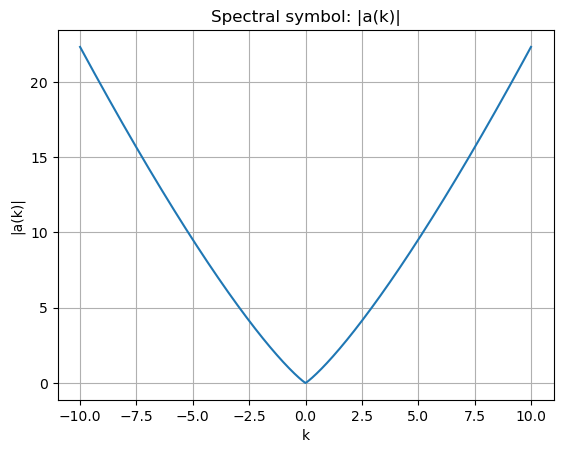


*******************
* Solving the PDE *
*******************

Closest available time to t_eval=0.0: 0.0
Test error t = 0.0: 1.065e-04


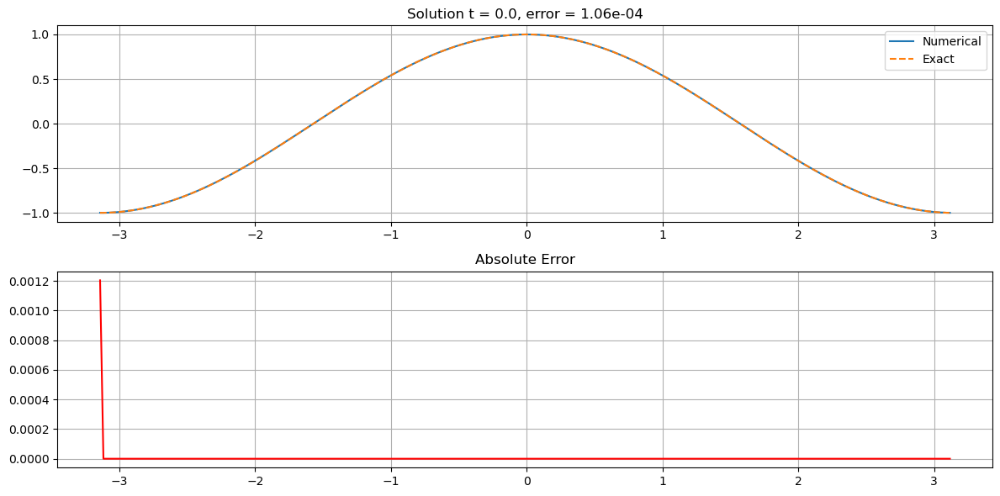

Closest available time to t_eval=0.5: 0.5
Test error t = 0.5: 2.474e-02


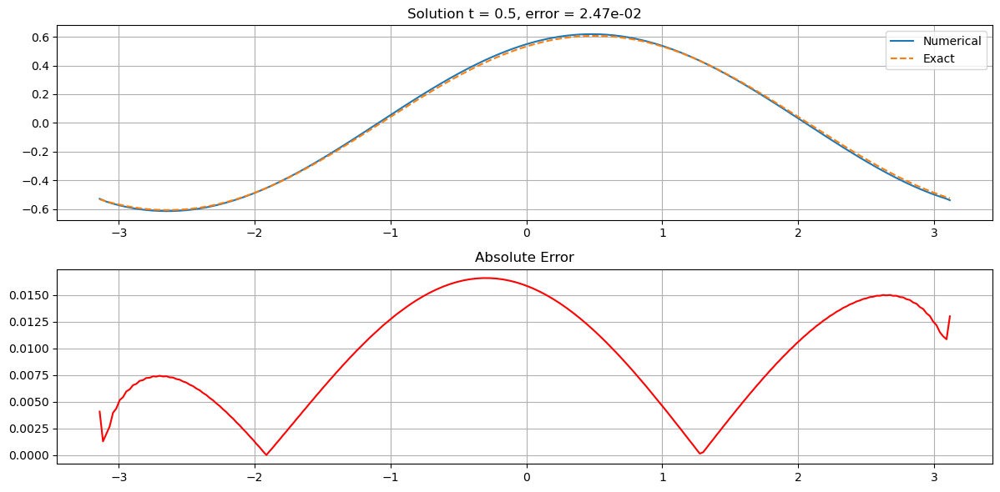

Closest available time to t_eval=1.0: 1.0
Test error t = 1.0: 2.282e-02


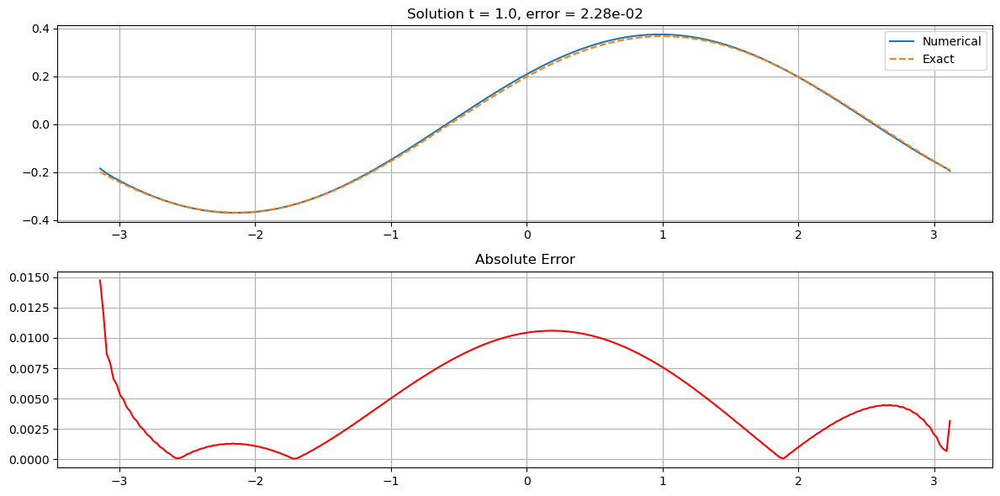

Closest available time to t_eval=1.5: 1.5
Test error t = 1.5: 3.492e-02


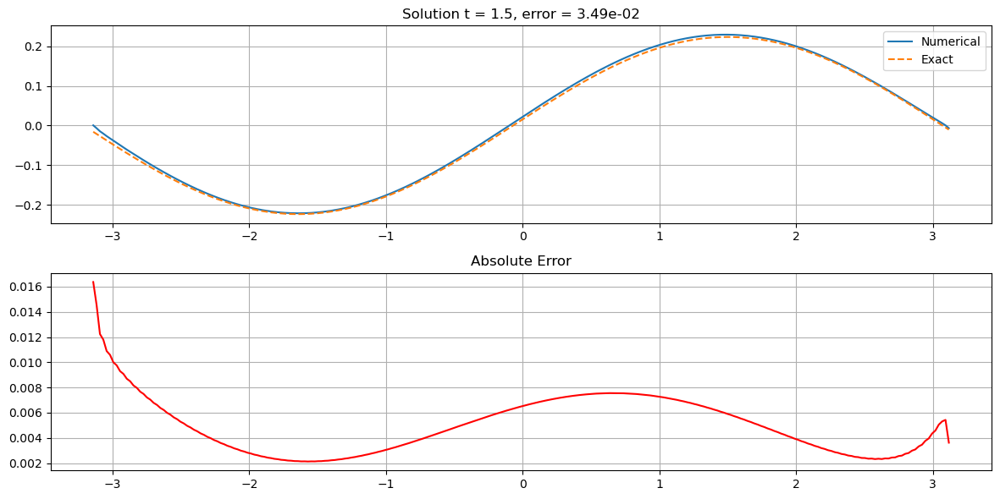

Closest available time to t_eval=2.0: 2.0
Test error t = 2.0: 6.492e-02


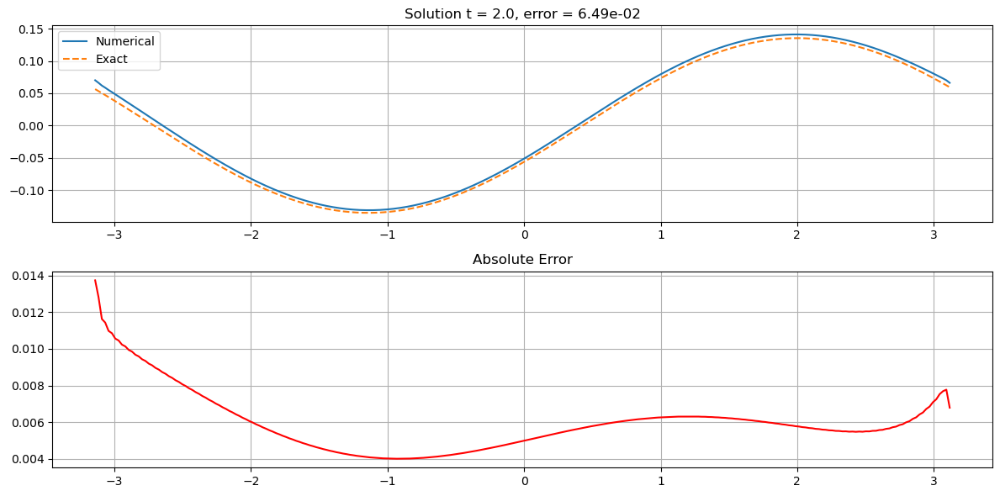

In [9]:
# Define symbols and equation
t, x, kx, xi, omega = symbols('t x kx xi omega')
u_func = Function('u')
u = u_func(t, x)

# Parameters
c = 1.0
beta = 1.3

# Equation
eq = Eq(diff(u, t) + c * diff(u, x), -Op(abs(kx)**beta, u))

# Create the solver
solver = PDESolver(eq, dealiasing_ratio=0.5, time_scheme='ETD-RK4')
Lt=2.0
# Domain and initial condition setup
solver.setup(
    Lx=2 * np.pi, Nx=256, Lt=Lt, Nt=2000,
    initial_condition=lambda x: np.cos(x)
)

# Solve the equation
solver.solve()

# Exact solution function at t = 1
def u_exact(x, t):
    return np.cos(x - c * t) * np.exp(-t * abs(1)**beta)

# Automatic testing
n_test = 4
test_set = [solver.test(u_exact=u_exact, t_eval=i * Lt / n_test, threshold=7e-2, component='real') for i in range(n_test + 1)]

## 1D heat equation with periodic initial condition


*********************************
* Partial differential equation *
*********************************

               2          
∂             ∂           
──(u(t, x)) = ───(u(t, x))
∂t              2         
              ∂x          

********************
* Equation parsing *
********************


Equation rewritten in standard form: Derivative(u(t, x), t) - Derivative(u(t, x), (x, 2))

Expanded equation: Derivative(u(t, x), t) - Derivative(u(t, x), (x, 2))
Analyzing term: Derivative(u(t, x), t)
  Derivative found: Derivative(u(t, x), t)
  --> Classified as linear
Analyzing term: -Derivative(u(t, x), (x, 2))
  Derivative found: Derivative(u(t, x), (x, 2))
  --> Classified as linear
Final linear terms: {Derivative(u(t, x), t): 1, Derivative(u(t, x), (x, 2)): -1}
Final nonlinear terms: []
Symbol terms: []
Pseudo terms: []
Source terms: []

*******************************
* Linear operator computation *
*******************************


Characteristic equation before symbol treatmen

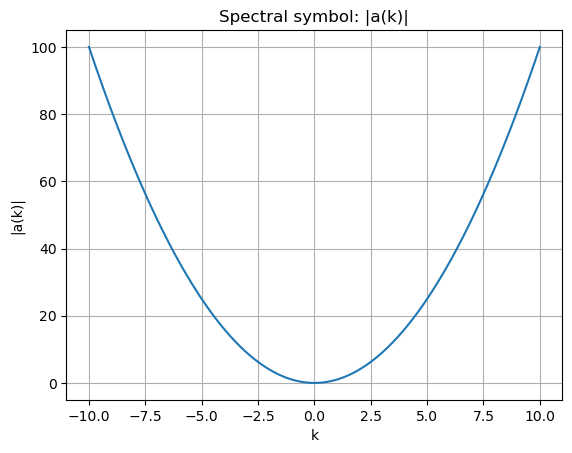


*******************
* Solving the PDE *
*******************

Closest available time to t_eval=0.0: 0.0
Test error t = 0.0: 6.134e-03


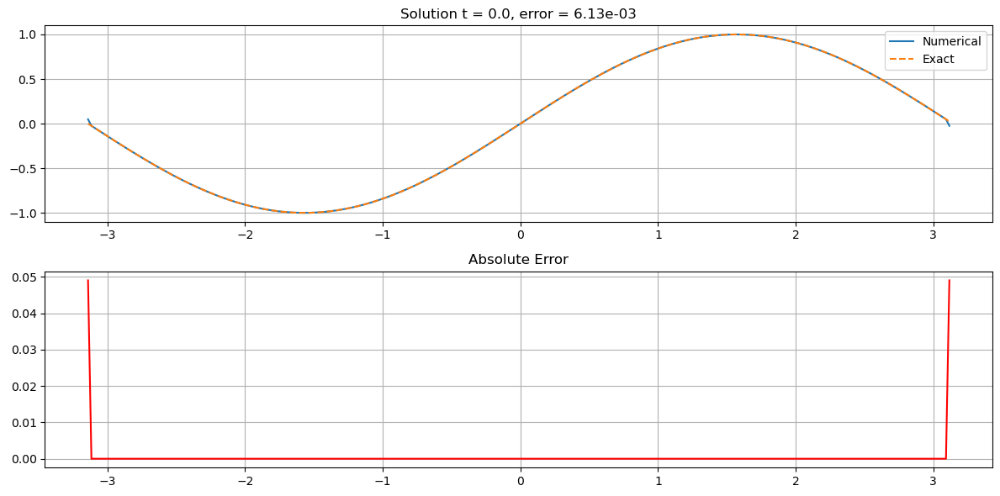

Closest available time to t_eval=0.5: 0.5
Test error t = 0.5: 6.131e-03


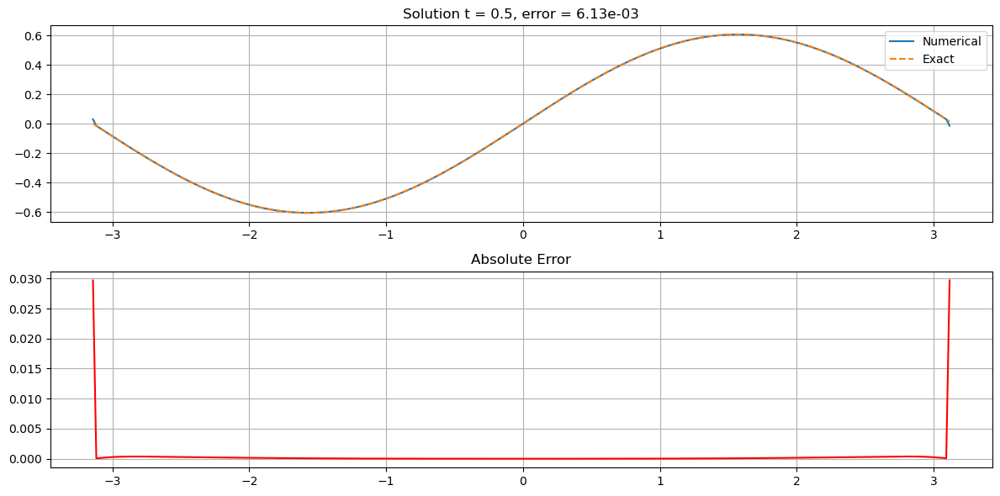

Closest available time to t_eval=1.0: 1.0
Test error t = 1.0: 6.145e-03


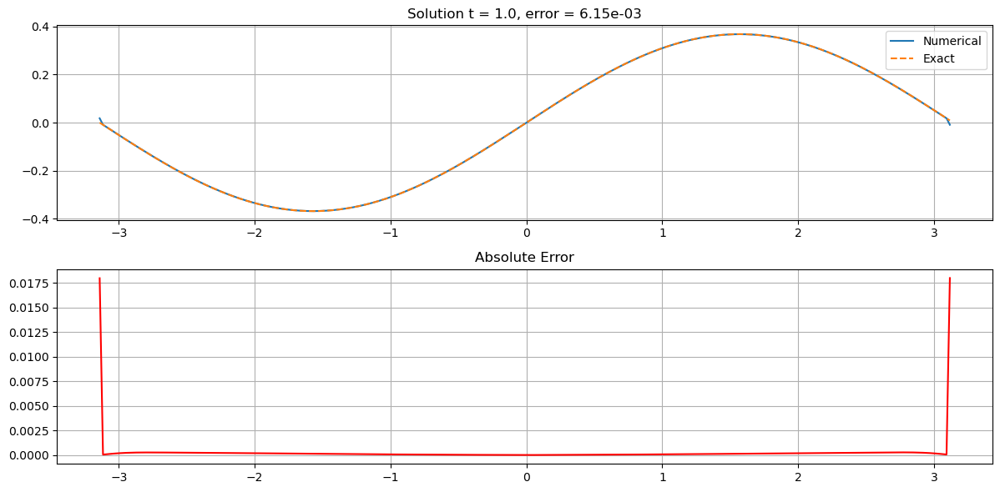

Closest available time to t_eval=1.5: 1.5
Test error t = 1.5: 6.167e-03


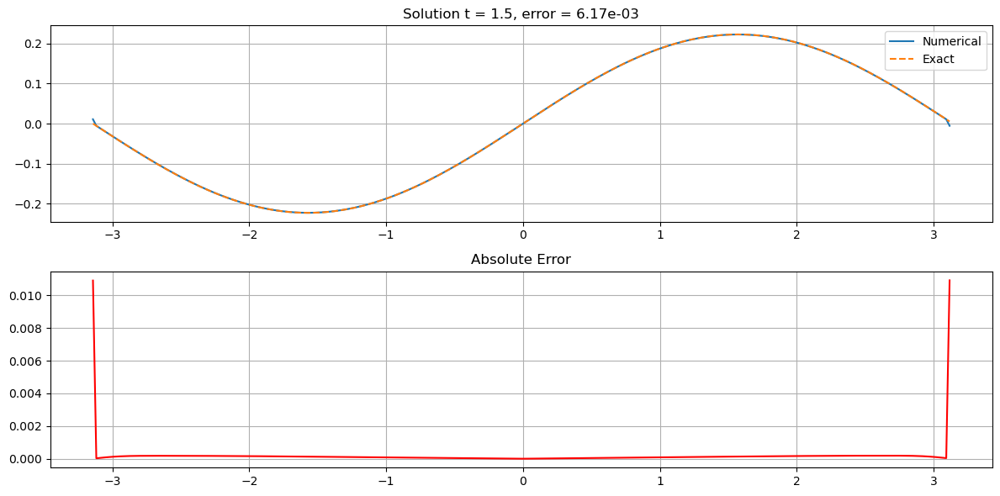

Closest available time to t_eval=2.0: 2.0
Test error t = 2.0: 6.197e-03


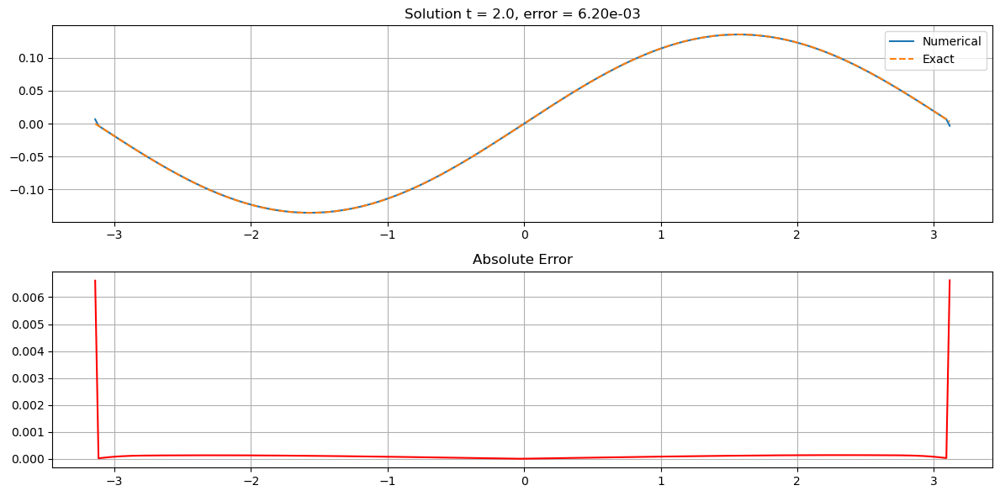

In [10]:
# Define the symbols and the equation
t, x, kx, xi, omega = symbols('t x kx xi omega')
u_func = Function('u') 
u = u_func(t, x)

# 1D heat equation
eq = Eq(diff(u, t), diff(u, x, x)) 

# Create the solver
solver = PDESolver(eq, time_scheme='ETD-RK4')
Lt=2.0
# Domain and initial condition setup
solver.setup(
    Lx=2 * np.pi, Nx=256, Lt=Lt, Nt=100,
    initial_condition=lambda x: np.sin(x)
)

# Solve the equation
solver.solve()

# Exact solution function
def u_exact(x, t):
    return np.sin(x) * np.exp(-t)

# Automatic testing
n_test = 4
test_set = [solver.test(u_exact=u_exact, t_eval=i * Lt / n_test, threshold=5e-2, component='real') for i in range(n_test + 1)]


## 1D heat equation with compact support initial condition



*********************************
* Partial differential equation *
*********************************

               2          
∂             ∂           
──(u(t, x)) = ───(u(t, x))
∂t              2         
              ∂x          

********************
* Equation parsing *
********************


Equation rewritten in standard form: Derivative(u(t, x), t) - Derivative(u(t, x), (x, 2))

Expanded equation: Derivative(u(t, x), t) - Derivative(u(t, x), (x, 2))
Analyzing term: Derivative(u(t, x), t)
  Derivative found: Derivative(u(t, x), t)
  --> Classified as linear
Analyzing term: -Derivative(u(t, x), (x, 2))
  Derivative found: Derivative(u(t, x), (x, 2))
  --> Classified as linear
Final linear terms: {Derivative(u(t, x), t): 1, Derivative(u(t, x), (x, 2)): -1}
Final nonlinear terms: []
Symbol terms: []
Pseudo terms: []
Source terms: []

*******************************
* Linear operator computation *
*******************************


Characteristic equation before symbol treatmen

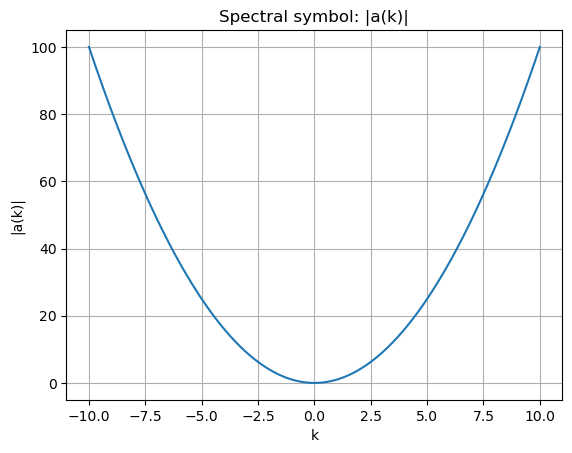


*******************
* Solving the PDE *
*******************

Closest available time to t_eval=0.0: 0.0
Test error t = 0.0: 3.111e-53


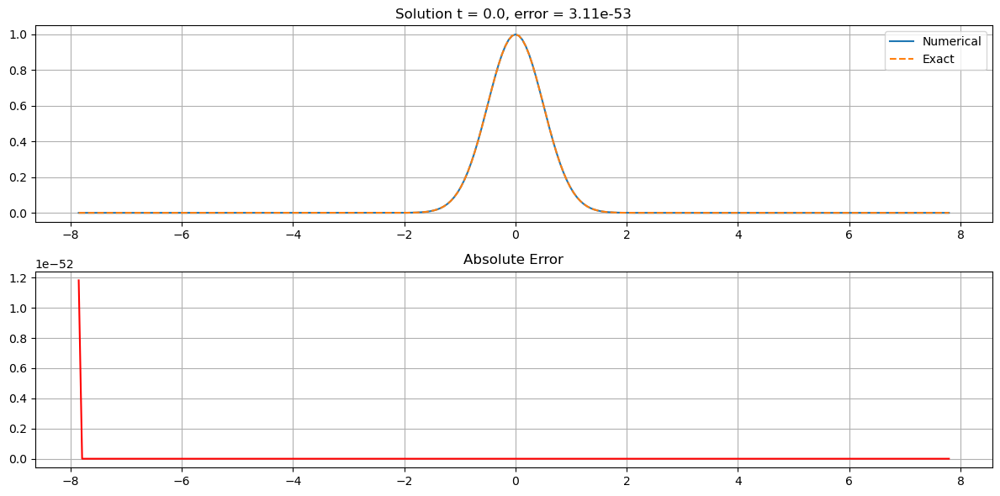

Closest available time to t_eval=0.5: 0.5
Test error t = 0.5: 7.390e-12


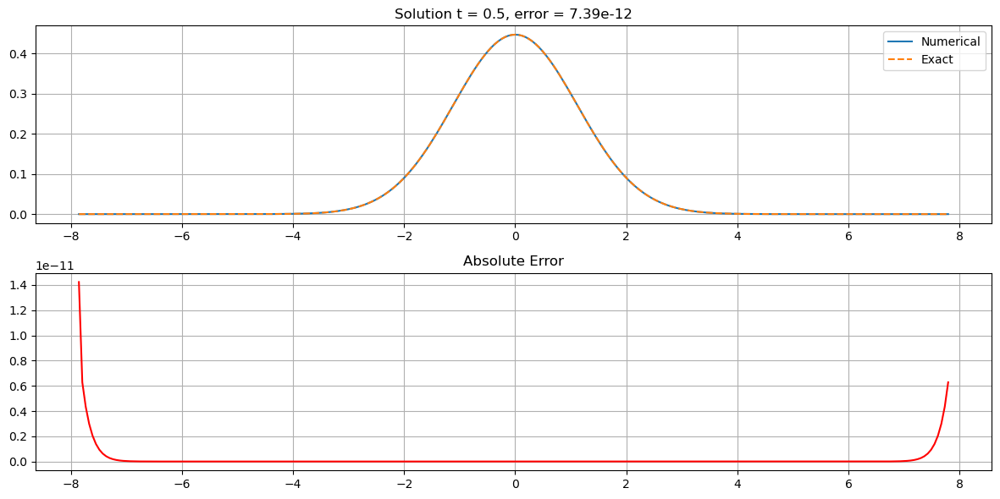

Closest available time to t_eval=1.0: 1.0
Test error t = 1.0: 4.035e-07


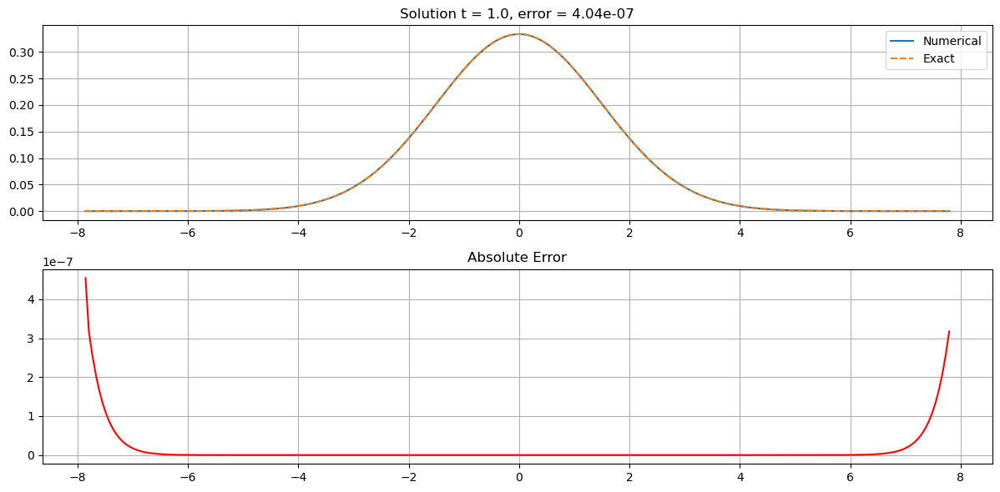

Closest available time to t_eval=1.5: 1.5
Test error t = 1.5: 2.867e-05


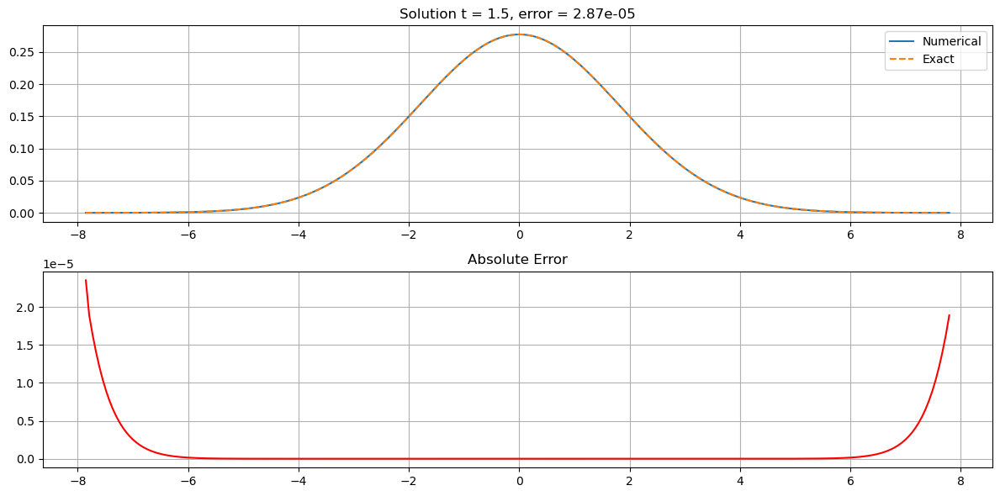

Closest available time to t_eval=2.0: 2.0
Test error t = 2.0: 2.799e-04


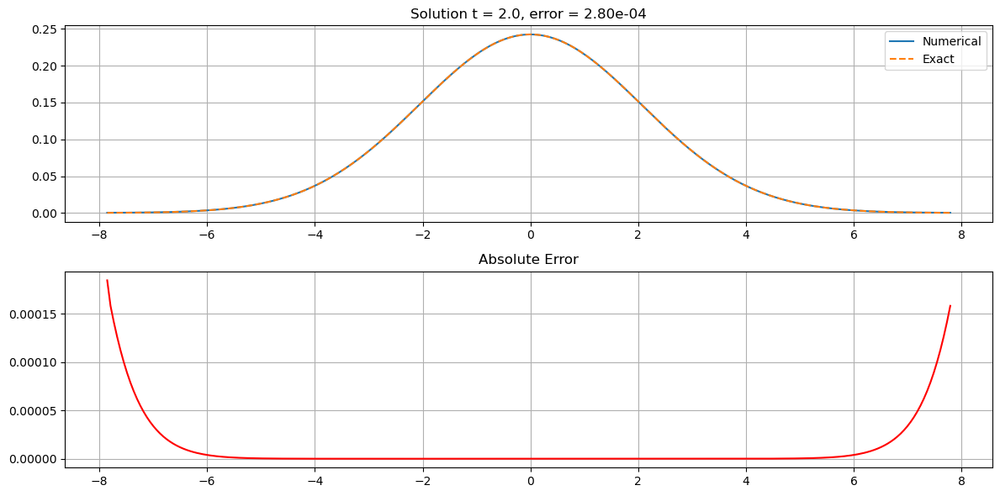


*********************
* Solution plotting *
*********************



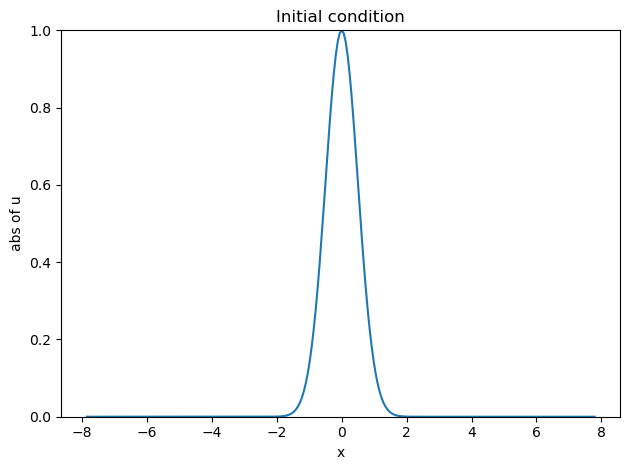

In [11]:
# Definition of symbols and equation
t, x, kx, xi, omega = symbols('t x kx xi omega')
u = Function('u')(t, x)

# 1D heat equation
eq = Eq(diff(u, t), diff(u, x, x))

# Creation of the solver with ETD-RK4 scheme
solver = PDESolver(eq, time_scheme='ETD-RK4')

# Simulation parameters
Lt = 2.0  # Total time
Lx = 5 * np.pi  # Spatial domain
Nx = 256  # Grid points
Nt = 100  # Time steps

# Solver setup with Gaussian initial condition
solver.setup(
    Lx=Lx,
    Nx=Nx,
    Lt=Lt,
    Nt=Nt,
    initial_condition=lambda x: np.exp(-2 * x**2)  # Gaussian σ=0.5
)

# Solving the equation
solver.solve()

# Exact solution for the Gaussian with diffusion
def u_exact(x, t):
    sigma = 0.5
    variance = sigma**2 + 2 * t  # Variance increases linearly
    return (np.exp(-x**2 / (2 * variance)) /
            np.sqrt(1 + 2 * t / sigma**2))

# Automated tests at different times
n_test = 4
test_set = [
    solver.test(
        u_exact=u_exact,
        t_eval=i * Lt / n_test,
        threshold=5e-3,  
        component='real'
    )
    for i in range(n_test + 1)
]

# Animate the solution
ani = solver.animate()
HTML(ani.to_jshtml())

## 1D heat equation with Op


*********************************
* Partial differential equation *
*********************************

                                   2          
                                  ∂           
                                  ───(u(t, x))
                ⎛   2         ⎞     2         
∂             Op⎝-kx , u(t, x)⎠   ∂x          
──(u(t, x)) = ───────────────── + ────────────
∂t                    2                2      

********************
* Equation parsing *
********************


Equation rewritten in standard form: -Op(-kx**2, u(t, x))/2 + Derivative(u(t, x), t) - Derivative(u(t, x), (x, 2))/2

Expanded equation: -Op(-kx**2, u(t, x))/2 + Derivative(u(t, x), t) - Derivative(u(t, x), (x, 2))/2
Analyzing term: -Op(-kx**2, u(t, x))/2
  --> Classified as symbolic linear term (Op)
Analyzing term: Derivative(u(t, x), t)
  Derivative found: Derivative(u(t, x), t)
  --> Classified as linear
Analyzing term: -Derivative(u(t, x), (x, 2))/2
  Derivative found: Derivative(u(t, x), (x,

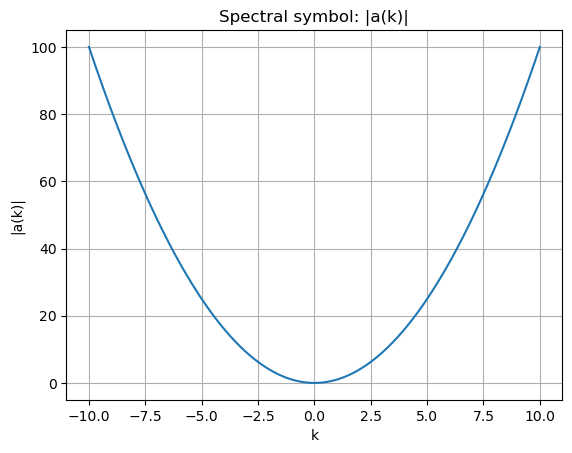


*******************
* Solving the PDE *
*******************

Closest available time to t_eval=0.0: 0.0
Test error t = 0.0: 6.134e-03


/home/fifi/pdesolver_prod/PDESolver.py:3443: RuntimeWarning: invalid value encountered in divide
  return np.where(np.abs(z) > 1e-12, (np.exp(z) - 1) / z, 1.0)
/home/fifi/pdesolver_prod/PDESolver.py:3446: RuntimeWarning: invalid value encountered in divide
  return np.where(np.abs(z) > 1e-12, (np.exp(z) - 1 - z) / z**2, 0.5)


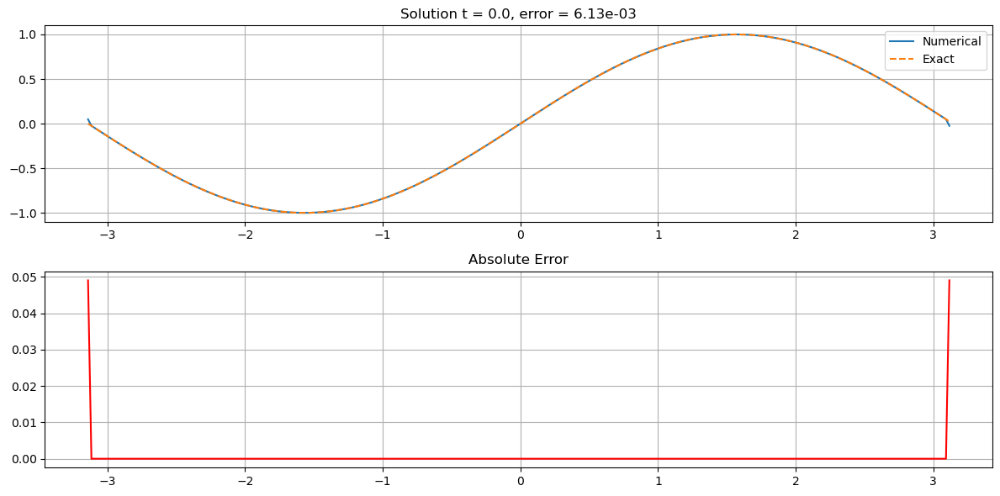

Closest available time to t_eval=0.5: 0.5
Test error t = 0.5: 6.131e-03


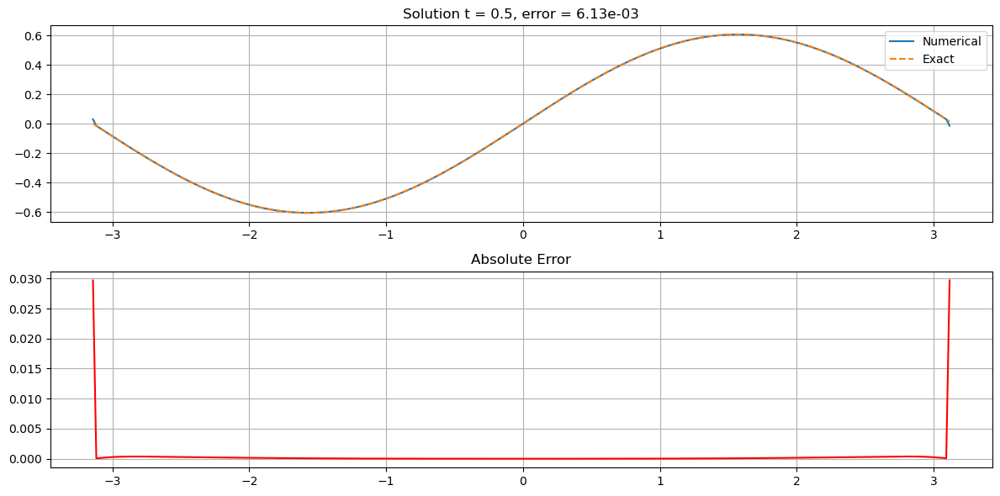

Closest available time to t_eval=1.0: 1.0
Test error t = 1.0: 6.145e-03


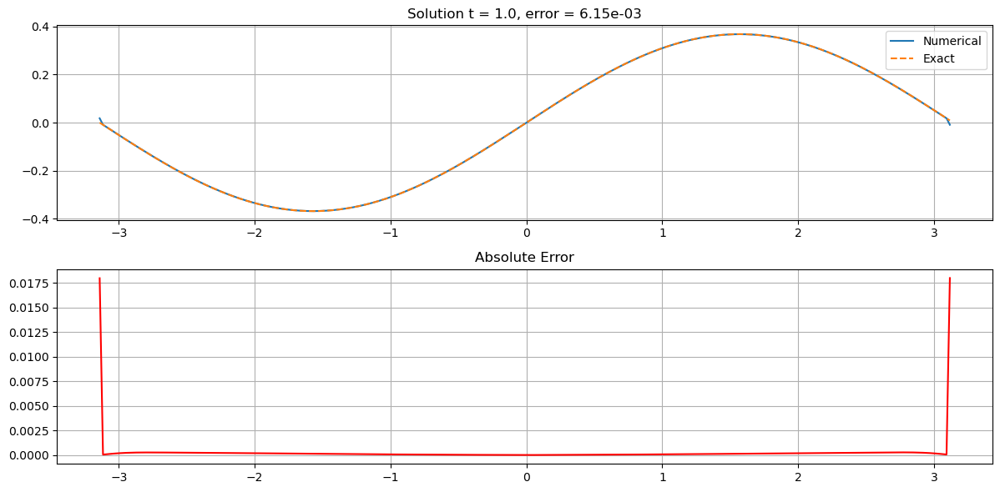

Closest available time to t_eval=1.5: 1.5
Test error t = 1.5: 6.167e-03


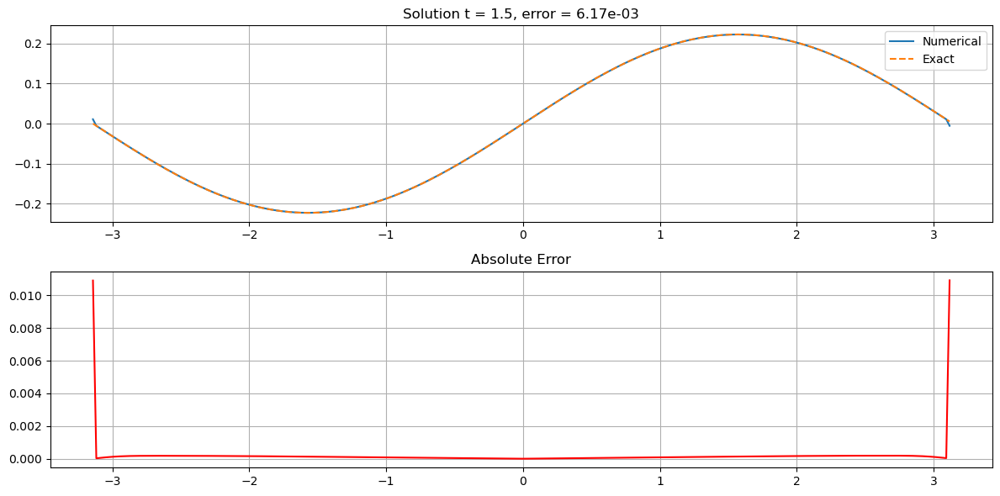

Closest available time to t_eval=2.0: 2.0
Test error t = 2.0: 6.197e-03


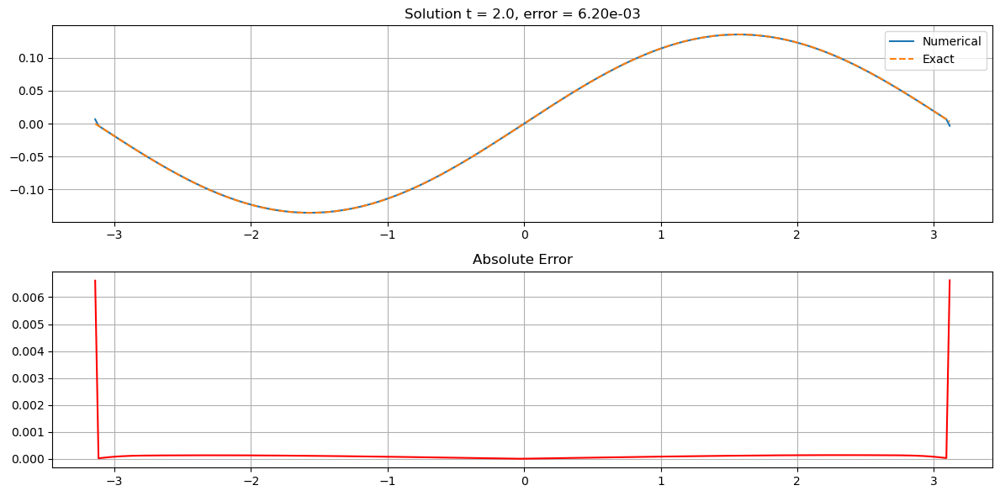

In [12]:
# Define the symbols and the equation
t, x, kx, xi, omega = symbols('t x kx xi omega')
u_func = Function('u') 
u = u_func(t, x)

# 1D heat equation
#eq = Eq(diff(u, t),  diff(u, x, 2)) 
eq = Eq(diff(u, t), Op((I*kx)**2, u)/2 + diff(u, x, 2)/2)
#eq = Eq(Op(-(I*omega),u), Op(-(I*kx)**2, u)/2 + diff(u, x, 2)/2)
# Create the solver
solver = PDESolver(eq, time_scheme='ETD-RK4')
Lt=2.0
# Domain and initial condition setup
solver.setup(
    Lx=2 * np.pi, Nx=256, Lt=2.0, Nt=100,
    initial_condition=lambda x: np.sin(x)
)

# Solve the equation
solver.solve()

# Exact solution function at t = 1
def u_exact(x, t):
    return np.sin(x) * np.exp(-t)

# Automatic testing
n_test = 4
test_set = [solver.test(u_exact=u_exact, t_eval=i * Lt / n_test, threshold=5e-2, component='real') for i in range(n_test + 1)]


## 1D heat equation in Op formulation


*********************************
* Partial differential equation *
*********************************

                      ⎛   2         ⎞
Op(-ⅈ⋅ω, u(t, x)) = Op⎝-kx , u(t, x)⎠

********************
* Equation parsing *
********************


Equation rewritten in standard form: -Op(-kx**2, u(t, x)) + Op(-I*omega, u(t, x))

Expanded equation: -Op(-kx**2, u(t, x)) + Op(-I*omega, u(t, x))
Analyzing term: -Op(-kx**2, u(t, x))
  --> Classified as symbolic linear term (Op)
Analyzing term: Op(-I*omega, u(t, x))
  --> Classified as symbolic linear term (Op)
Final linear terms: {}
Final nonlinear terms: []
Symbol terms: [(-1, -kx**2), (1, -I*omega)]
Pseudo terms: []
Source terms: []

*******************************
* Linear operator computation *
*******************************


Characteristic equation before symbol treatment:
0

--- Symbolic symbol analysis ---
symb_omega: -I*omega
symb_k: kx**2

Raw characteristic equation:
  2      
kx  - ⅈ⋅ω
Temporal order from dispersion relation: 1
s

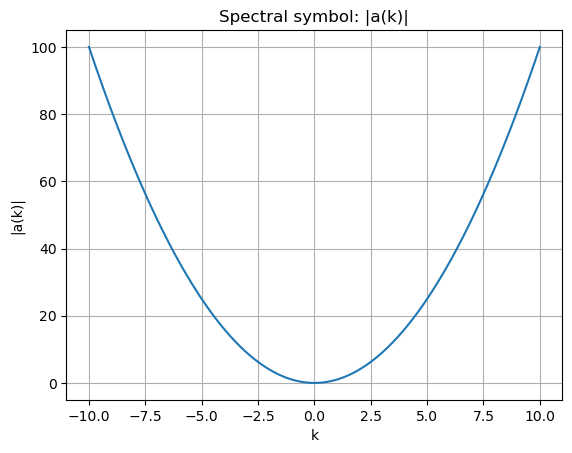


*******************
* Solving the PDE *
*******************

Closest available time to t_eval=0.0: 0.0
Test error t = 0.0: 2.169e-03


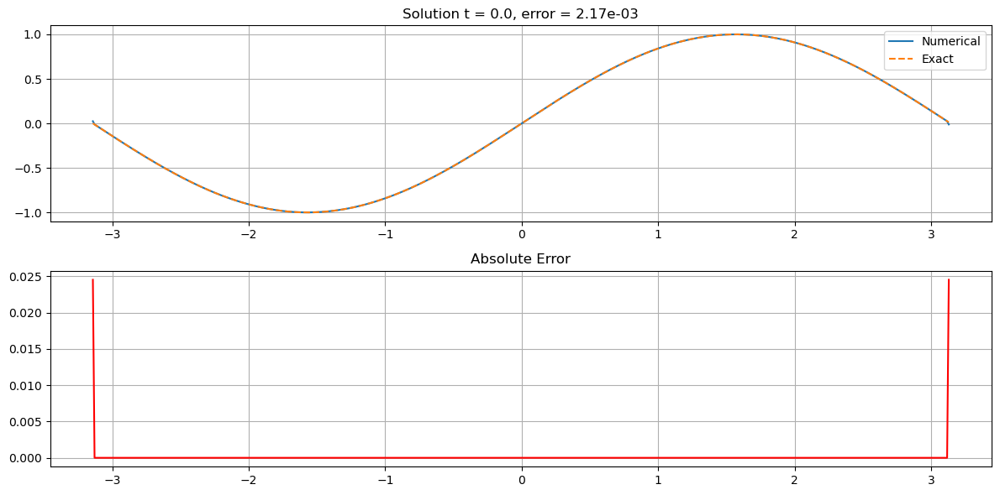

Closest available time to t_eval=0.5: 0.5
Test error t = 0.5: 1.516e-02


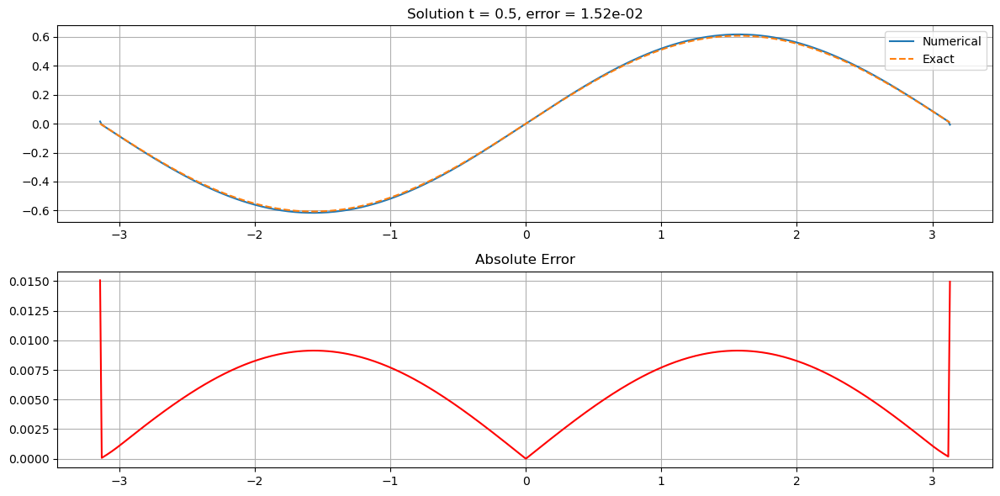

Closest available time to t_eval=1.0: 1.0
Test error t = 1.0: 1.504e-02


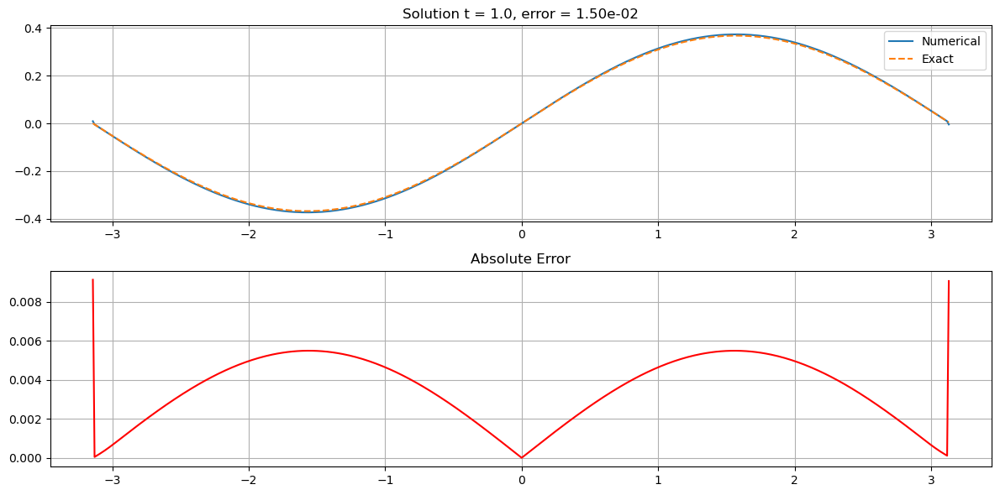

Closest available time to t_eval=1.5: 1.5
Test error t = 1.5: 1.492e-02


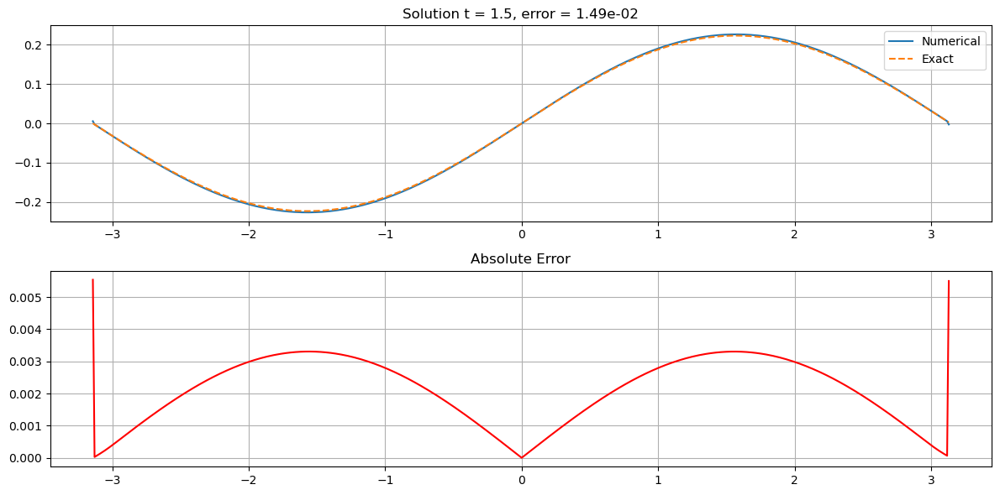

Closest available time to t_eval=2.0: 2.0
Test error t = 2.0: 1.480e-02


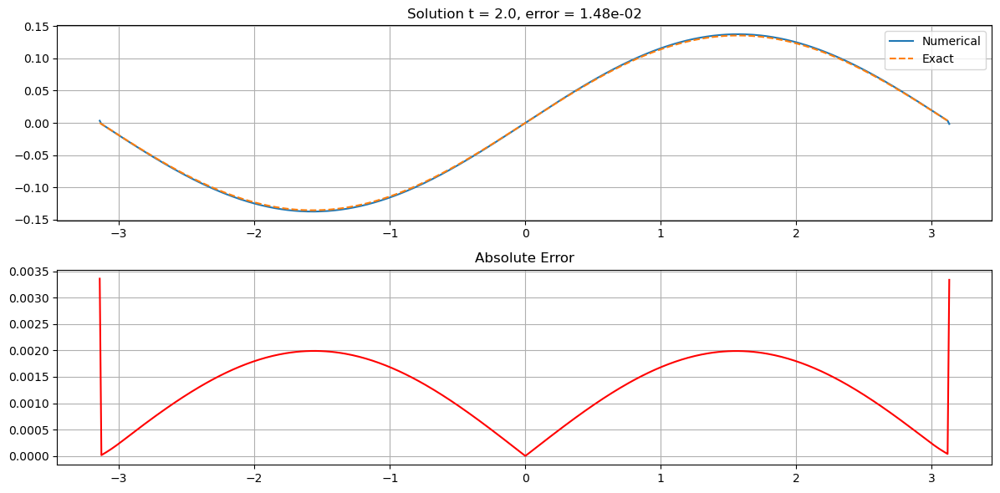

In [13]:
# Define the symbols and the equation
t, x, kx, xi, omega = symbols('t x kx xi omega')
u_func = Function('u') 
u = u_func(t, x)

# 1D heat equation in Op formulation
# eq = Eq(Op((-I*omega), u), diff(u, x, x))
eq = Eq(Op((-I*omega), u), Op((-I*kx)**2, u))

# Create the solver
solver = PDESolver(eq, time_scheme='ETD-RK4')
Lt=2.0
# Domain and initial condition setup
solver.setup(
    Lx=2 * np.pi, Nx=512, Lt=Lt, Nt=400,
    initial_condition=lambda x: np.sin(x),
    initial_velocity=lambda x: np.zeros_like(x)  # ∂u/∂t(x,0) = 0
)

# Solve the equation
solver.solve()

# Exact solution function
def u_exact(x, t):
    return np.sin(x) * np.exp(-t)

# Automatic testing
n_test = 4
test_set = [solver.test(u_exact=u_exact, t_eval=i * Lt / n_test, threshold=2e-2, component='real') for i in range(n_test + 1)]

## 1D diffusion equation with psiOp


*********************************
* Partial differential equation *
*********************************

∂                  ⎛  2         ⎞
──(u(t, x)) = psiOp⎝-ξ , u(t, x)⎠
∂t                               

********************
* Equation parsing *
********************


Equation rewritten in standard form: -psiOp(-xi**2, u(t, x)) + Derivative(u(t, x), t)
⚠️ psiOp detected: skipping expansion for safety

Expanded equation: -psiOp(-xi**2, u(t, x)) + Derivative(u(t, x), t)
Analyzing term: -psiOp(-xi**2, u(t, x))
  --> Classified as pseudo linear term (psiOp)
Analyzing term: Derivative(u(t, x), t)
  Derivative found: Derivative(u(t, x), t)
  --> Classified as linear
Final linear terms: {Derivative(u(t, x), t): 1}
Final nonlinear terms: []
Symbol terms: []
Pseudo terms: [(-1, -xi**2)]
Source terms: []
⚠️  Pseudo‑differential operator detected: all other linear terms have been rejected.

*******************************
* Linear operator computation *
*******************************


Charac

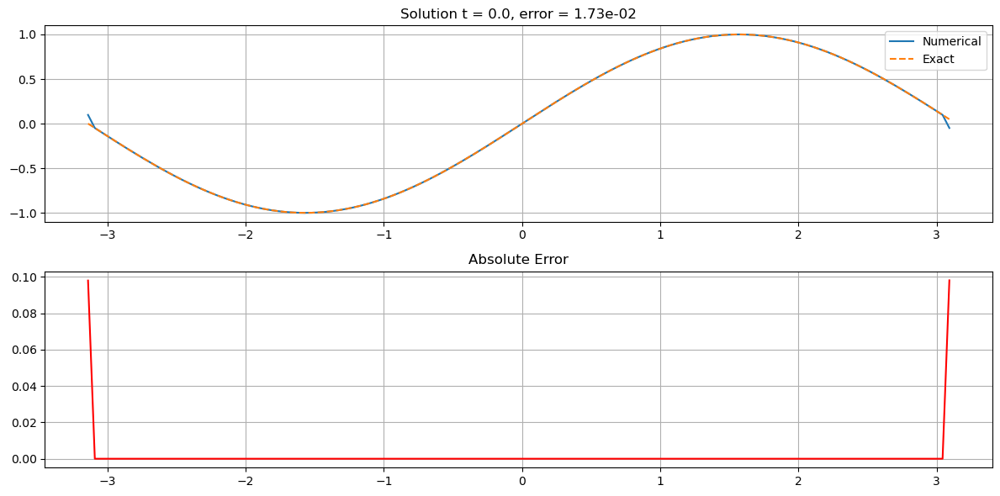

Closest available time to t_eval=0.5: 0.5
Test error t = 0.5: 1.852e-02


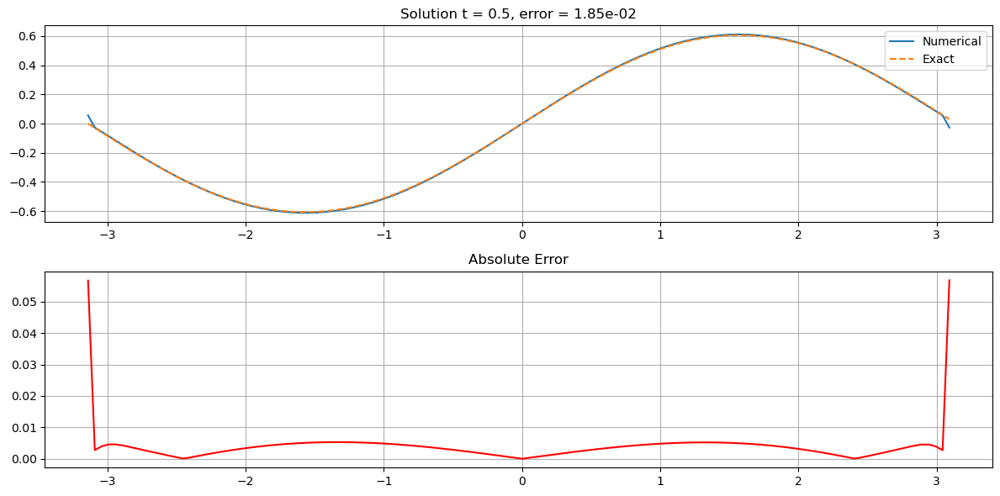

Closest available time to t_eval=1.0: 1.0
Test error t = 1.0: 1.771e-02


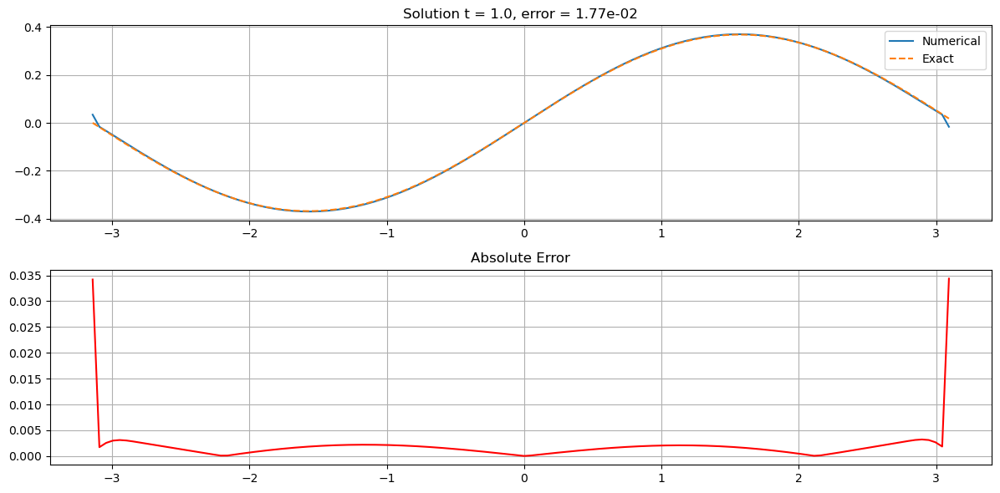

Closest available time to t_eval=1.5: 1.5
Test error t = 1.5: 1.745e-02


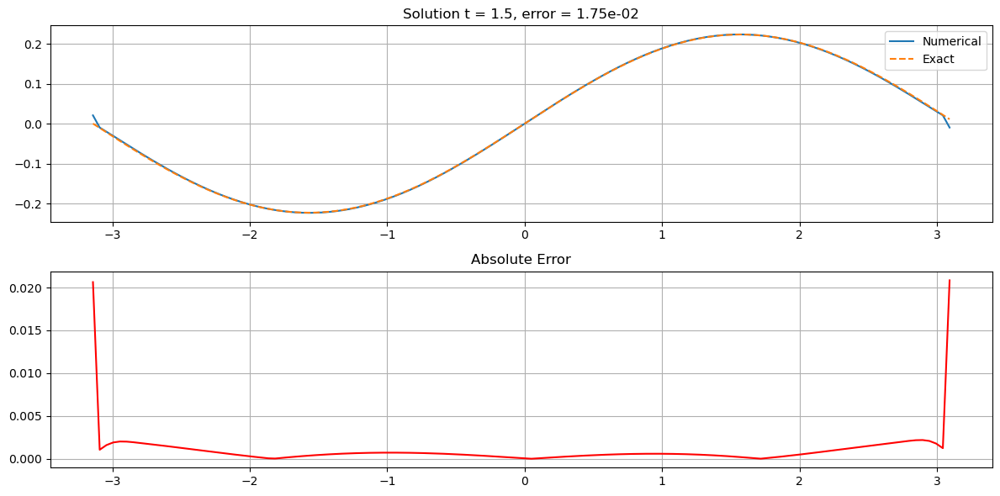

Closest available time to t_eval=2.0: 2.0
Test error t = 2.0: 1.786e-02


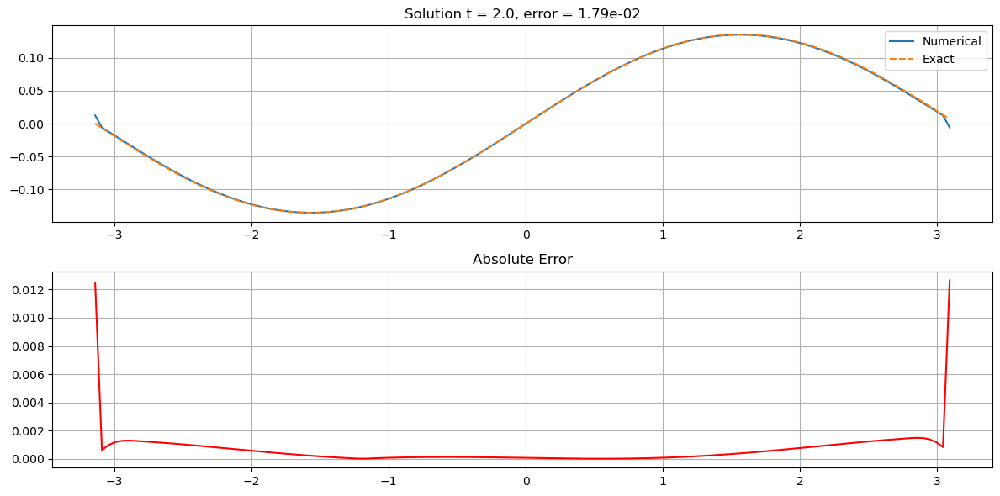

In [14]:
# Definition of the PDE: ∂u/∂t = - ∂²u/∂x² (diffusion equation)
u = Function('u')
t, x, xi = symbols('t x xi')
eq = Eq(diff(u(t,x), t), psiOp((-I*xi)**2, u(t,x)))

# Solver configuration
solver = PDESolver(eq)
Lt=2.0
solver.setup(Lx=2*np.pi, Nx=128, Lt=Lt, Nt=200,
             initial_condition=lambda x: np.sin(x))

# Solving and visualization
solver.solve()

# Exact solution function
def u_exact(x, t):
    return np.sin(x) * np.exp(-t)

# Automatic testing
n_test = 4
test_set = [solver.test(u_exact=u_exact, t_eval=i * Lt / n_test, threshold=5e-2, component='real') for i in range(n_test + 1)]


## 1D heat equation with Op


*********************************
* Partial differential equation *
*********************************

                                            2          
∂                 ⎛    1.8         ⎞       ∂           
──(u(t, x)) = - Op⎝│kx│   , u(t, x)⎠ + 0.1⋅───(u(t, x))
∂t                                           2         
                                           ∂x          

********************
* Equation parsing *
********************


Equation rewritten in standard form: Op(Abs(kx)**1.8, u(t, x)) + Derivative(u(t, x), t) - 0.1*Derivative(u(t, x), (x, 2))

Expanded equation: Op(Abs(kx)**1.8, u(t, x)) + Derivative(u(t, x), t) - 0.1*Derivative(u(t, x), (x, 2))
Analyzing term: Op(Abs(kx)**1.8, u(t, x))
  --> Classified as symbolic linear term (Op)
Analyzing term: Derivative(u(t, x), t)
  Derivative found: Derivative(u(t, x), t)
  --> Classified as linear
Analyzing term: -0.1*Derivative(u(t, x), (x, 2))
  Derivative found: Derivative(u(t, x), (x, 2))
  --> Classified as linear
Fi

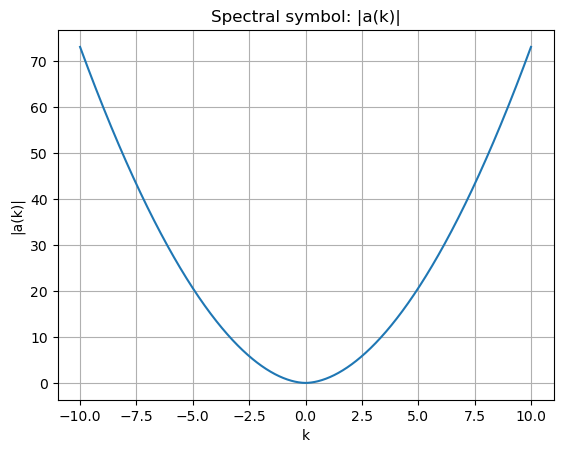


*******************
* Solving the PDE *
*******************

Closest available time to t_eval=0.0: 0.0
Test error t = 0.0: 6.134e-03


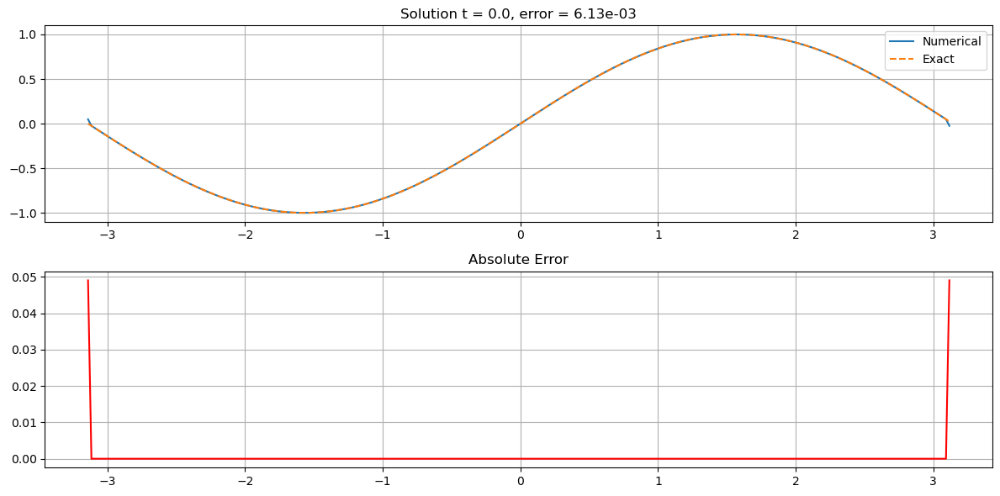

Closest available time to t_eval=0.5: 0.5
Test error t = 0.5: 1.958e-02


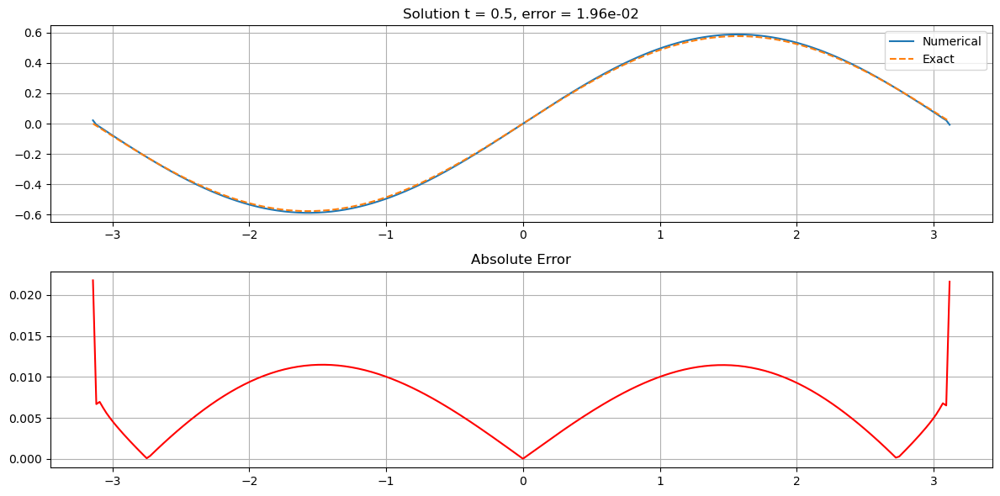

Closest available time to t_eval=1.0: 1.0
Test error t = 1.0: 1.695e-02


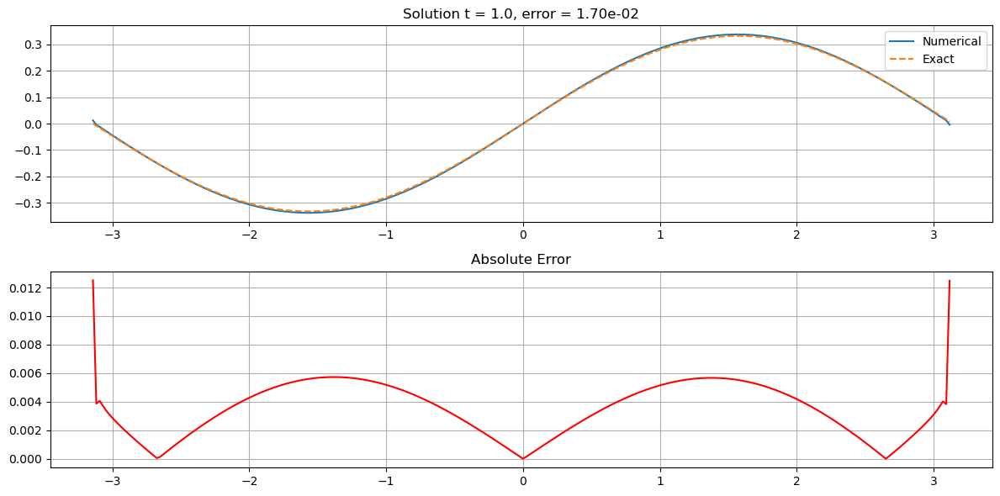

Closest available time to t_eval=1.5: 1.5
Test error t = 1.5: 1.434e-02


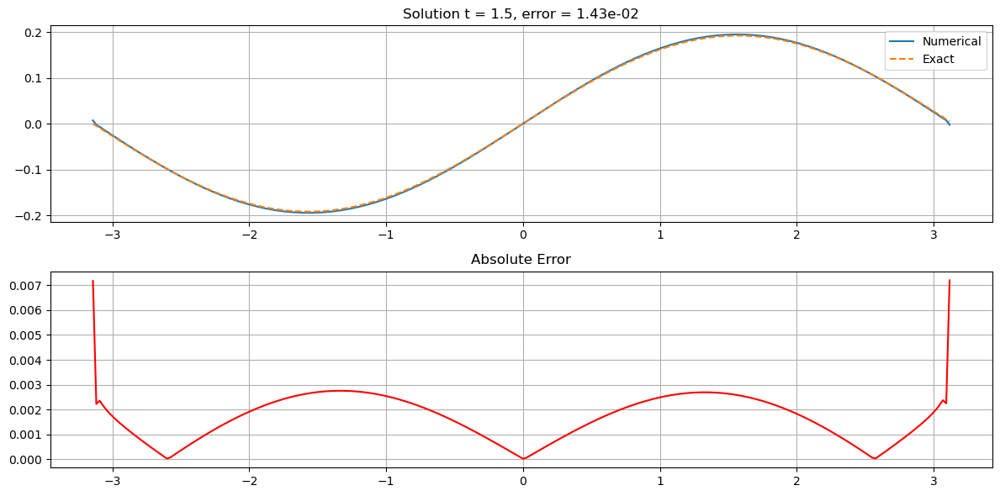

Closest available time to t_eval=2.0: 2.0
Test error t = 2.0: 1.192e-02


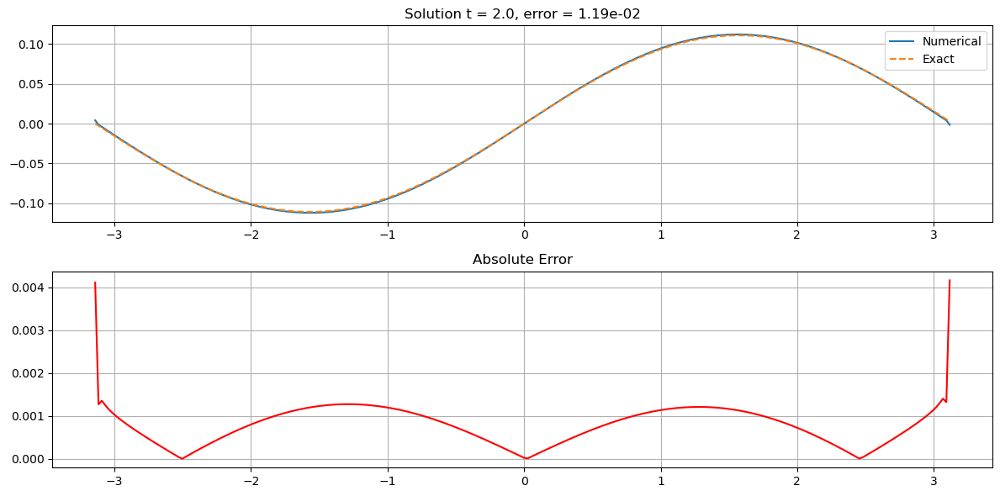

In [15]:
# Define symbols and equation
t, x, kx, xi, omega = symbols('t x kx xi omega')
u_func = Function('u')
u = u_func(t, x)

# Parameters
alpha = 1.8
nu = 0.1

# Equation
eq = Eq(diff(u, t), -Op(abs(kx)**alpha, u) + nu * diff(u, x, 2))

# Create the solver
solver = PDESolver(eq, dealiasing_ratio=0.5, time_scheme='ETD-RK4')
Lt=2.0
# Domain and initial condition setup
solver.setup(
    Lx=2 * np.pi, Nx=256, Lt=Lt, Nt=2000,
    initial_condition=lambda x: np.sin(x)
)

# Solve the equation
solver.solve()

# Exact solution function at t = 1
def u_exact(x, t):
    return np.sin(x) * np.exp(-t * (abs(1)**alpha + nu * 1**2))

# Automatic testing
n_test = 4
test_set = [solver.test(u_exact=u_exact, t_eval=i * Lt / n_test, threshold=2e-2, component='real') for i in range(n_test + 1)]

## 1D Burgers equation


*********************************
* Partial differential equation *
*********************************

                                           2          
∂                       ∂                 ∂           
──(u(t, x)) = - u(t, x)⋅──(u(t, x)) + 0.1⋅───(u(t, x))
∂t                      ∂x                  2         
                                          ∂x          

********************
* Equation parsing *
********************


Equation rewritten in standard form: u(t, x)*Derivative(u(t, x), x) + Derivative(u(t, x), t) - 0.1*Derivative(u(t, x), (x, 2))

Expanded equation: u(t, x)*Derivative(u(t, x), x) + Derivative(u(t, x), t) - 0.1*Derivative(u(t, x), (x, 2))
Analyzing term: u(t, x)*Derivative(u(t, x), x)
  --> Classified as nonlinear
Analyzing term: Derivative(u(t, x), t)
  Derivative found: Derivative(u(t, x), t)
  --> Classified as linear
Analyzing term: -0.1*Derivative(u(t, x), (x, 2))
  Derivative found: Derivative(u(t, x), (x, 2))
  --> Classified as linear
Final li

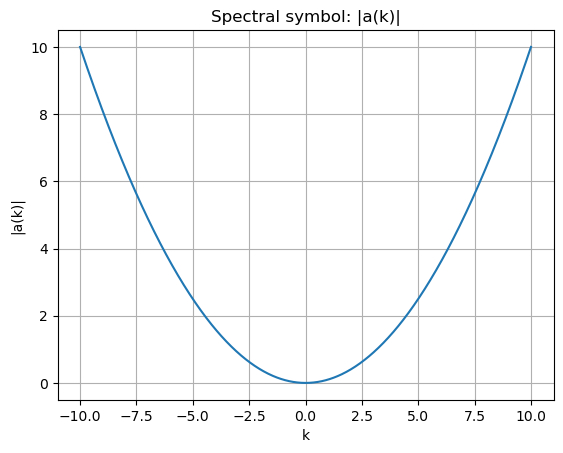


*******************
* Solving the PDE *
*******************

Closest available time to t_eval=0.0: 0.0
Test error t = 0.0: 2.790e-03


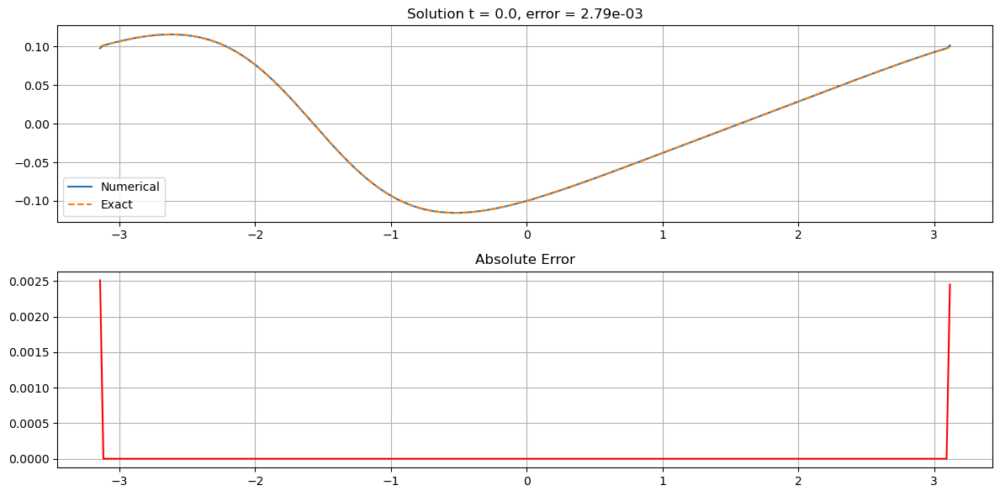

Closest available time to t_eval=0.25: 0.25
Test error t = 0.25: 1.455e-02


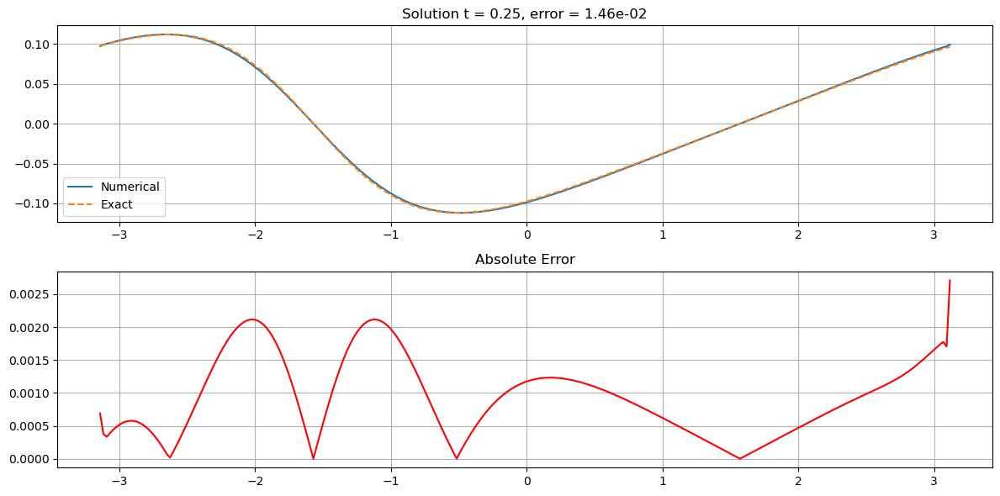

Closest available time to t_eval=0.5: 0.5
Test error t = 0.5: 2.692e-02


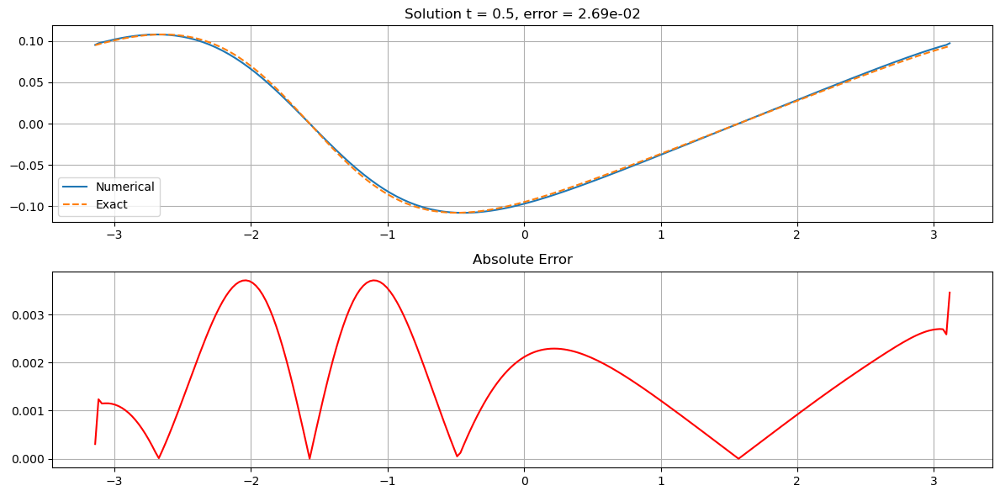

Closest available time to t_eval=0.75: 0.75
Test error t = 0.75: 3.759e-02


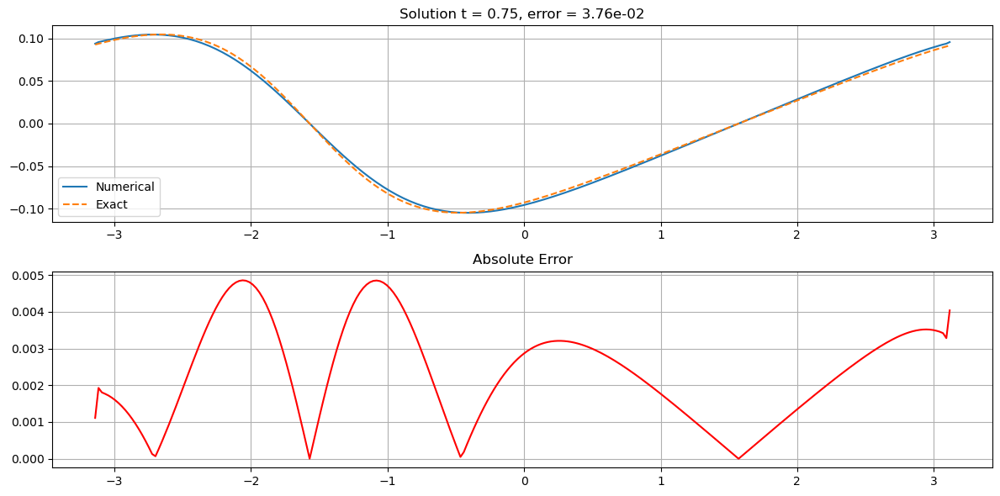

Closest available time to t_eval=1.0: 1.0
Test error t = 1.0: 4.685e-02


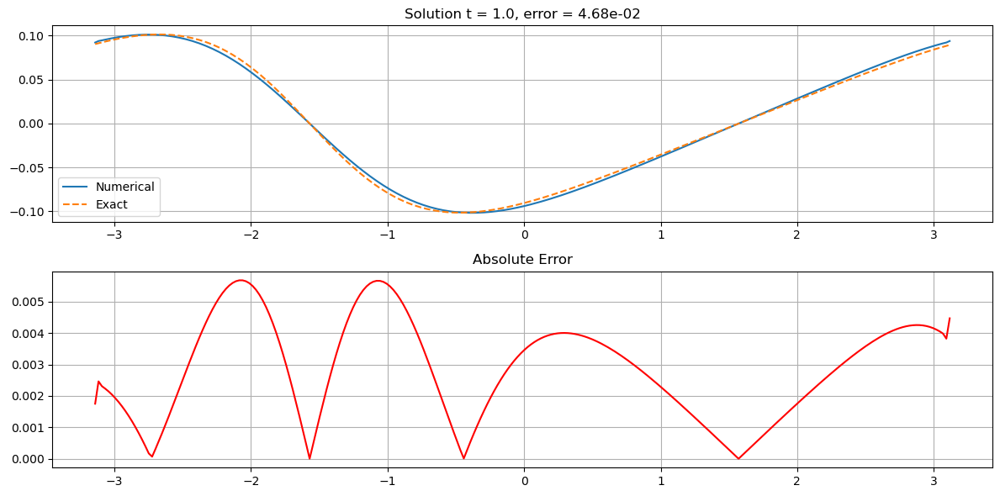

In [16]:
# Definition of symbols and equation
t, x, kx, xi, omega = symbols('t x kx xi omega')
u = Function('u')(t, x)

# 1D Burgers equation
nu = 0.1
eq = Eq(diff(u, t), -u * diff(u, x) + nu * diff(u, x, x))

# Corrected exact solution
def phi(x, t):
    return 2 + np.sin(x) * np.exp(-nu * t)


def dphi_dx(x, t):
    return np.cos(x) * np.exp(-nu * t)

def u_exact(x, t):
    return -2 * nu * dphi_dx(x, t) / phi(x, t)

# Creation of the solver
solver = PDESolver(eq, time_scheme='ETD-RK4')
Lt = 1.0

# Configuration with corrected initial condition
solver.setup(
    Lx=2 * np.pi, Nx=256, Lt=Lt, Nt=200,
    initial_condition=lambda x: u_exact(x, 0)
)

# Solving
solver.solve()

# Automated tests
n_test = 4
test_set = [
    solver.test(
        u_exact=u_exact,
        t_eval=i * Lt / n_test,
        threshold=5e-2,  # Adjusted threshold
        component='real'
    )
    for i in range(n_test + 1)
]


## 1D equation with psiOp depending on spatial variable


*********************************
* Partial differential equation *
*********************************

∂                    ⎛                   -t       ⎞                            ↪
──(u(t, x)) = - psiOp⎝(cos(x) + 1)⋅│ξ│, ℯ  ⋅sin(x)⎠ + psiOp((cos(x) + 1)⋅│ξ│,  ↪
∂t                                                                             ↪

↪             -t       
↪ u(t, x)) - ℯ  ⋅sin(x)
↪                      

********************
* Equation parsing *
********************


Equation rewritten in standard form: psiOp((cos(x) + 1)*Abs(xi), exp(-t)*sin(x)) - psiOp((cos(x) + 1)*Abs(xi), u(t, x)) + Derivative(u(t, x), t) + exp(-t)*sin(x)
⚠️ psiOp detected: skipping expansion for safety

Expanded equation: psiOp((cos(x) + 1)*Abs(xi), exp(-t)*sin(x)) - psiOp((cos(x) + 1)*Abs(xi), u(t, x)) + Derivative(u(t, x), t) + exp(-t)*sin(x)
Analyzing term: psiOp((cos(x) + 1)*Abs(xi), exp(-t)*sin(x))
  --> Classified as pseudo linear term (psiOp)
Analyzing term: -psiOp((cos(x) + 1)*Abs(xi), u(t, x

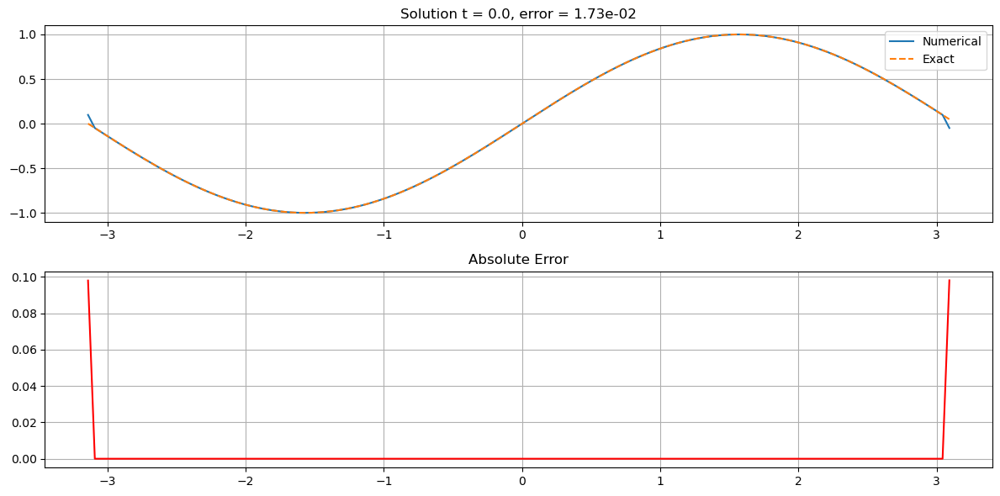

Closest available time to t_eval=0.5: 0.5
Test error t = 0.5: 2.679e-02


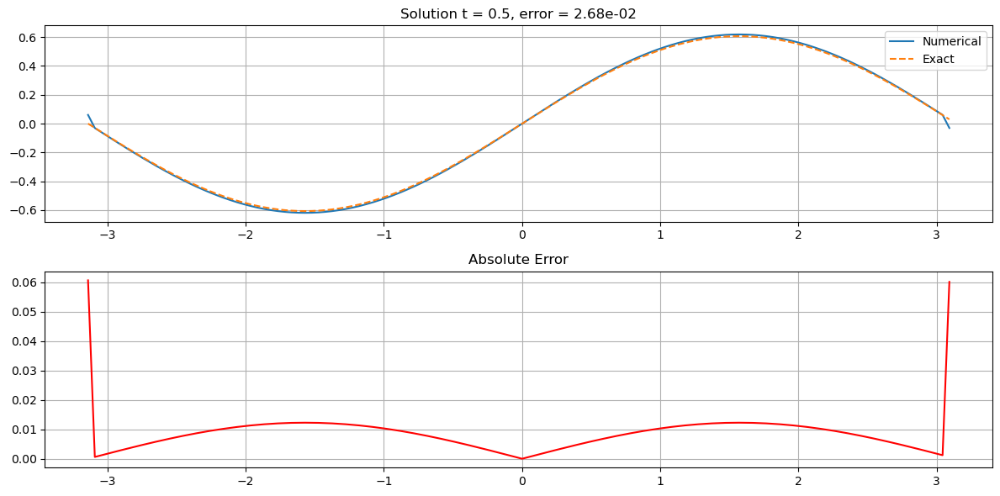

Closest available time to t_eval=1.0: 1.0
Test error t = 1.0: 2.679e-02


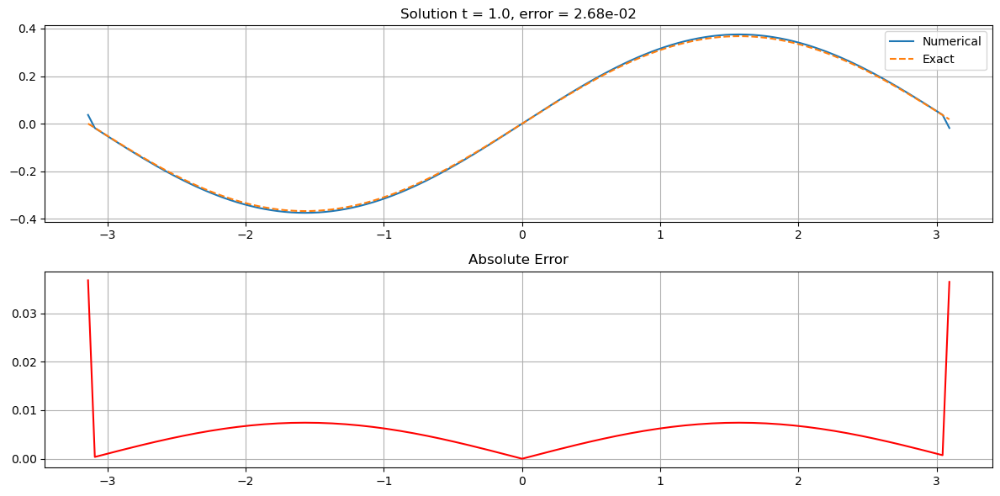

Closest available time to t_eval=1.5: 1.5
Test error t = 1.5: 2.679e-02


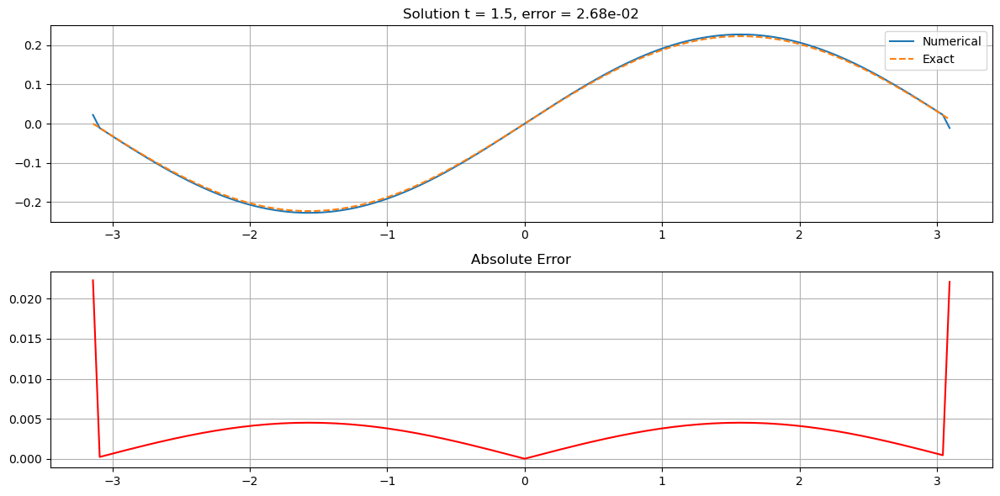

Closest available time to t_eval=2.0: 2.0
Test error t = 2.0: 2.679e-02


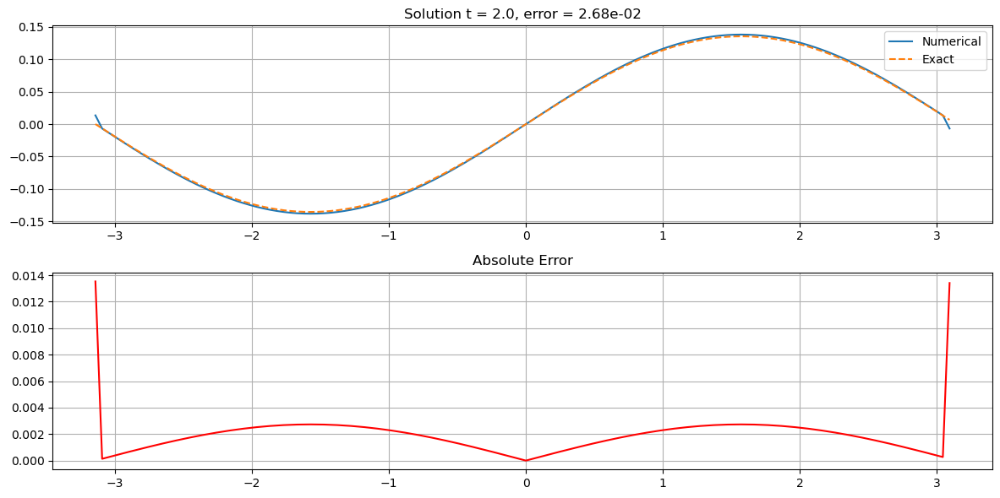

In [17]:
from sympy import symbols, Function, Eq, diff, sin, cos, exp, pi, Abs
import numpy as np

# Symbols
u = Function('u')
t, x, xi = symbols('t x xi', real=True)

# Define the exact solution
u_exact_expr = sin(x) * exp(-t)

# Define the pseudo-differential symbol
symbol_expr = (1 + cos(x)) * Abs(xi)

# Construct the RHS: f(x, t) = ∂ₜ u - psiOp(p, u)
lhs = diff(u_exact_expr, t)
rhs = psiOp(symbol_expr, u_exact_expr)
source_expr = lhs - rhs

# Define the PDE with the correct source term
eq = Eq(diff(u(t, x), t), psiOp(symbol_expr, u(t, x)) + source_expr)

# Setup the solver
solver = PDESolver(eq)
Lt = 2.0
solver.setup(Lx=2 * np.pi, Nx=128, Lt=Lt, Nt=200,
             initial_condition=lambda x: np.sin(x))

# Solve the PDE
solver.solve()

# Define the exact solution for comparison
def u_exact(x, t):
    return np.sin(x) * np.exp(-t)

# Perform tests
n_test = 4
test_set = [
    solver.test(u_exact=u_exact, t_eval=i * Lt / n_test,
                threshold=3e-2, component='real')
    for i in range(n_test + 1)
]


## 1D wave equation with periodic initial condition


*********************************
* Partial differential equation *
*********************************

 2              2          
∂              ∂           
───(u(t, x)) = ───(u(t, x))
  2              2         
∂t             ∂x          

********************
* Equation parsing *
********************


Equation rewritten in standard form: Derivative(u(t, x), (t, 2)) - Derivative(u(t, x), (x, 2))

Expanded equation: Derivative(u(t, x), (t, 2)) - Derivative(u(t, x), (x, 2))
Analyzing term: Derivative(u(t, x), (t, 2))
  Derivative found: Derivative(u(t, x), (t, 2))
  --> Classified as linear
Analyzing term: -Derivative(u(t, x), (x, 2))
  Derivative found: Derivative(u(t, x), (x, 2))
  --> Classified as linear
Final linear terms: {Derivative(u(t, x), (t, 2)): 1, Derivative(u(t, x), (x, 2)): -1}
Final nonlinear terms: []
Symbol terms: []
Pseudo terms: []
Source terms: []

*******************************
* Linear operator computation *
*******************************


Characteristic e

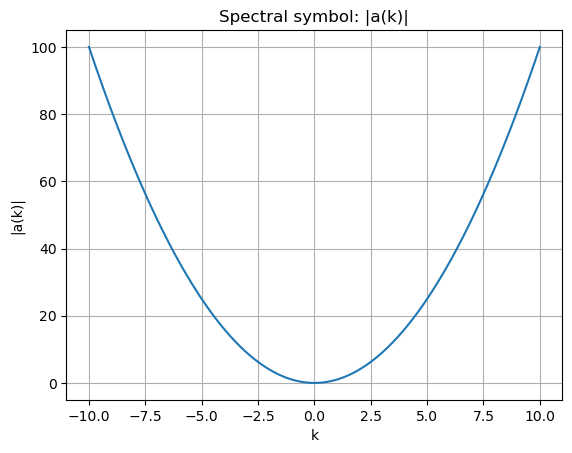


*****************************
* Wave propagation analysis *
*****************************



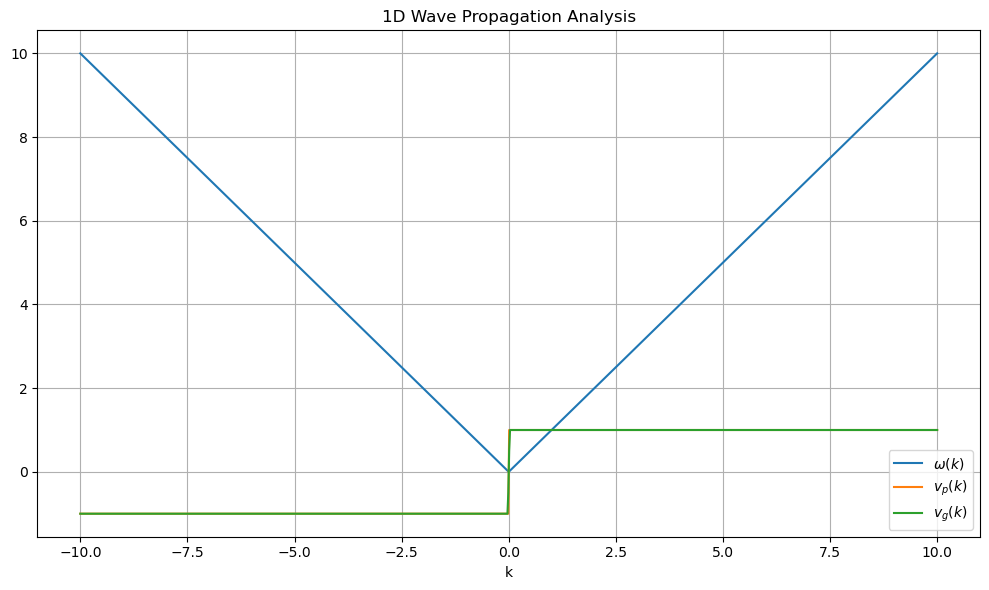


*******************
* Solving the PDE *
*******************



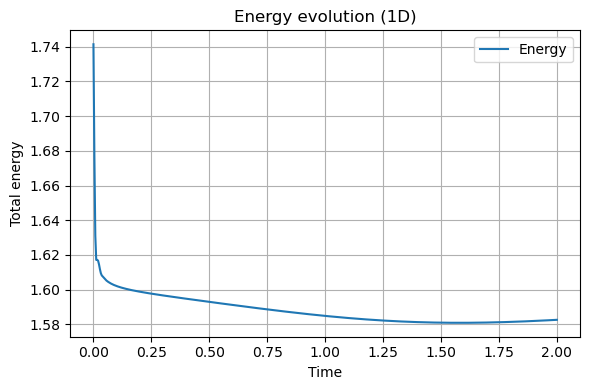

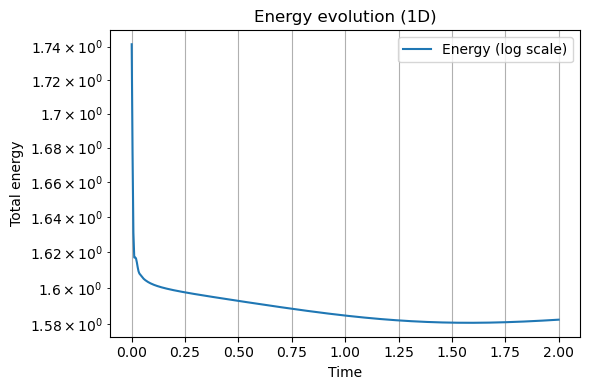

Closest available time to t_eval=0.0: 0.0
Test error t = 0.0: 2.169e-03


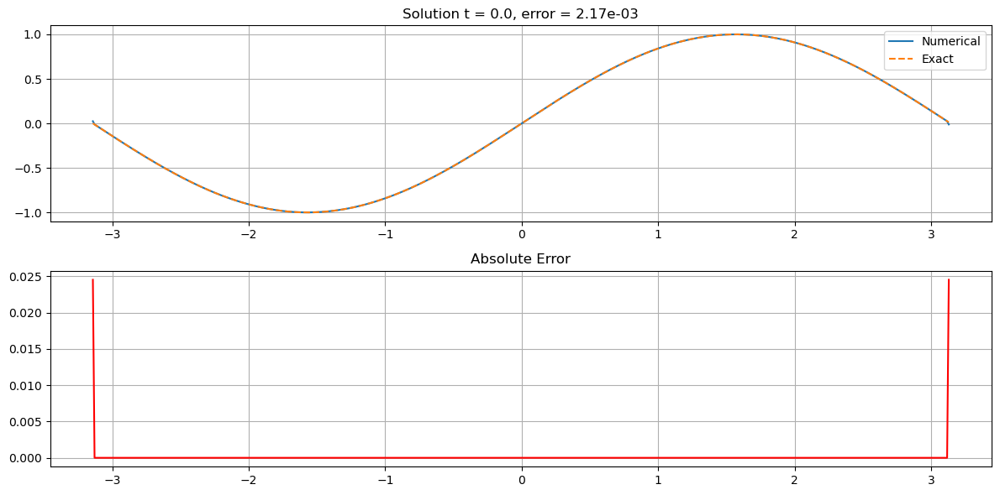

Closest available time to t_eval=0.5: 0.5
Test error t = 0.5: 1.022e-02


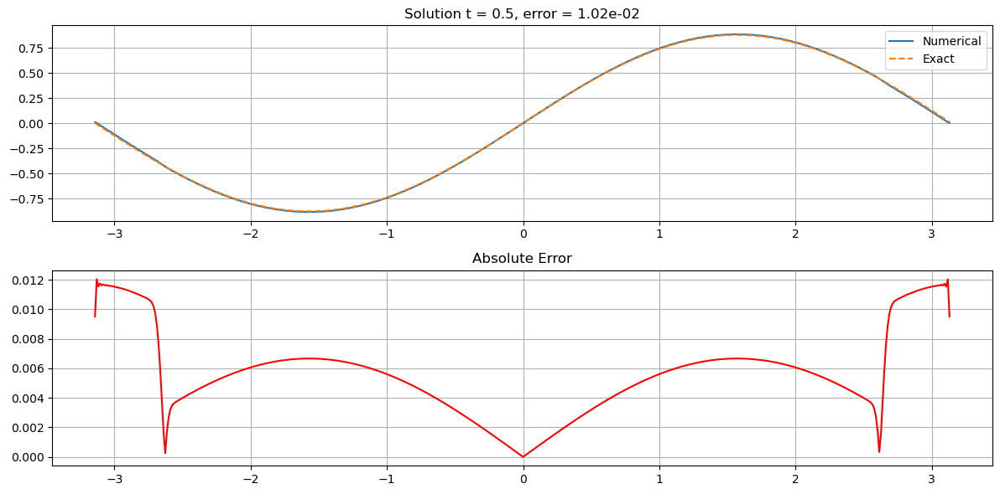

Closest available time to t_eval=1.0: 1.0
Test error t = 1.0: 2.173e-02


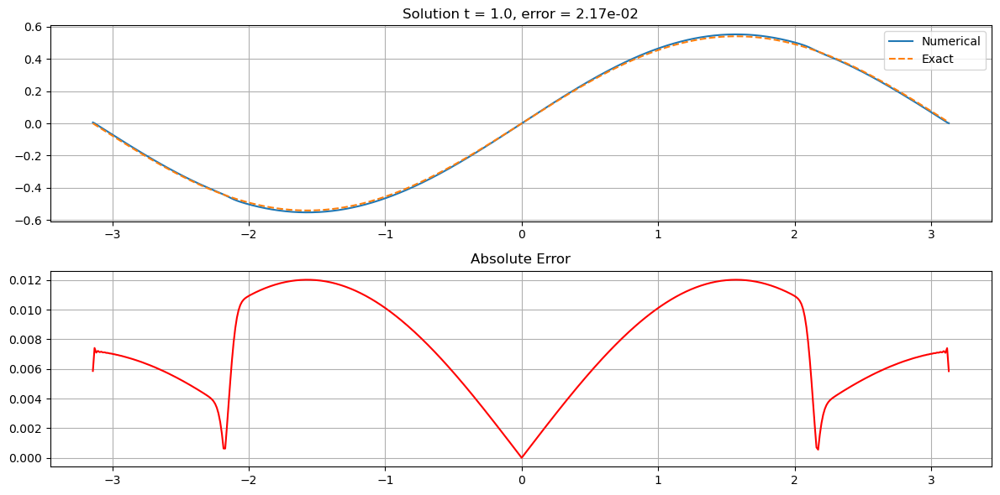

Closest available time to t_eval=1.5: 1.5
Test error t = 1.5: 1.530e-01


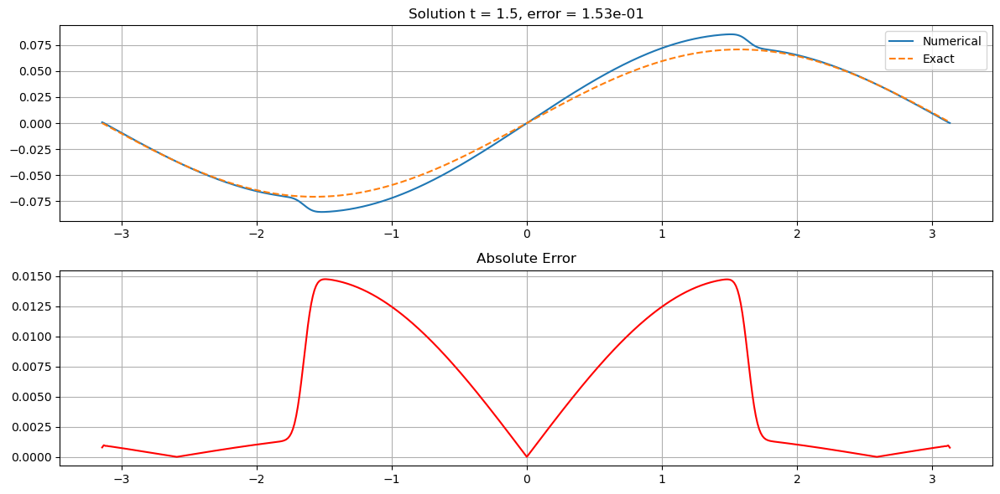

Closest available time to t_eval=2.0: 2.0
Test error t = 2.0: 2.070e-02


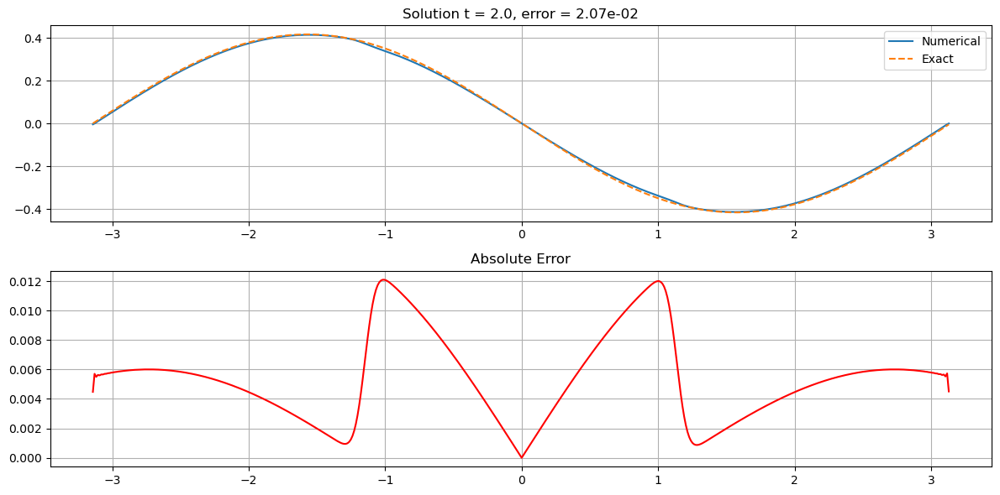

In [18]:
# Define the symbols and the equation
t, x, kx, xi, omega = symbols('t x kx xi omega')
u_func = Function('u') 
u = u_func(t, x)

# Wave equation
eq = Eq(diff(u, t, t), diff(u, x, x))

# Create the solver
solver = PDESolver(eq, time_scheme="ETD-RK4")
Lt=2.0
# Domain and initial conditions setup
solver.setup(
    Lx=2 * np.pi, Nx=512, Lt=Lt, Nt=500,
    initial_condition=lambda x: np.sin(x),
    initial_velocity=lambda x: np.zeros_like(x)  # ∂u/∂t(x,0) = 0
)

# Solving
solver.solve()

solver.plot_energy()
solver.plot_energy(log=True) 

# Exact solution 
def u_exact(x, t):
    return np.sin(x) * np.cos(t)

# Automatic testing
n_test = 4
test_set = [solver.test(u_exact=u_exact, t_eval=i * Lt / n_test, threshold=2e-1, component='real') for i in range(n_test + 1)]


## 1D wave equation with compact support initial condition


*********************************
* Partial differential equation *
*********************************

 2              2          
∂              ∂           
───(u(t, x)) = ───(u(t, x))
  2              2         
∂t             ∂x          

********************
* Equation parsing *
********************


Equation rewritten in standard form: Derivative(u(t, x), (t, 2)) - Derivative(u(t, x), (x, 2))

Expanded equation: Derivative(u(t, x), (t, 2)) - Derivative(u(t, x), (x, 2))
Analyzing term: Derivative(u(t, x), (t, 2))
  Derivative found: Derivative(u(t, x), (t, 2))
  --> Classified as linear
Analyzing term: -Derivative(u(t, x), (x, 2))
  Derivative found: Derivative(u(t, x), (x, 2))
  --> Classified as linear
Final linear terms: {Derivative(u(t, x), (t, 2)): 1, Derivative(u(t, x), (x, 2)): -1}
Final nonlinear terms: []
Symbol terms: []
Pseudo terms: []
Source terms: []

*******************************
* Linear operator computation *
*******************************


Characteristic e

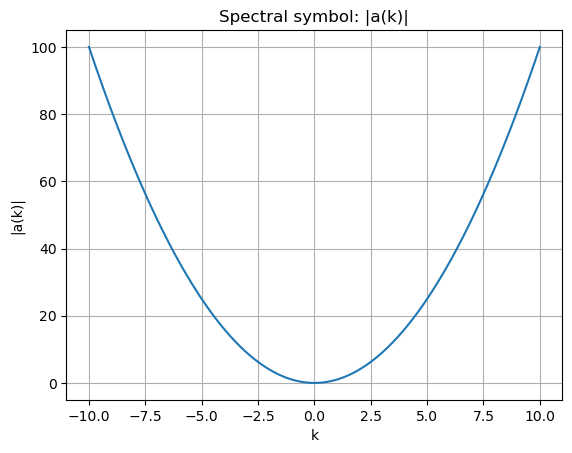


*****************************
* Wave propagation analysis *
*****************************



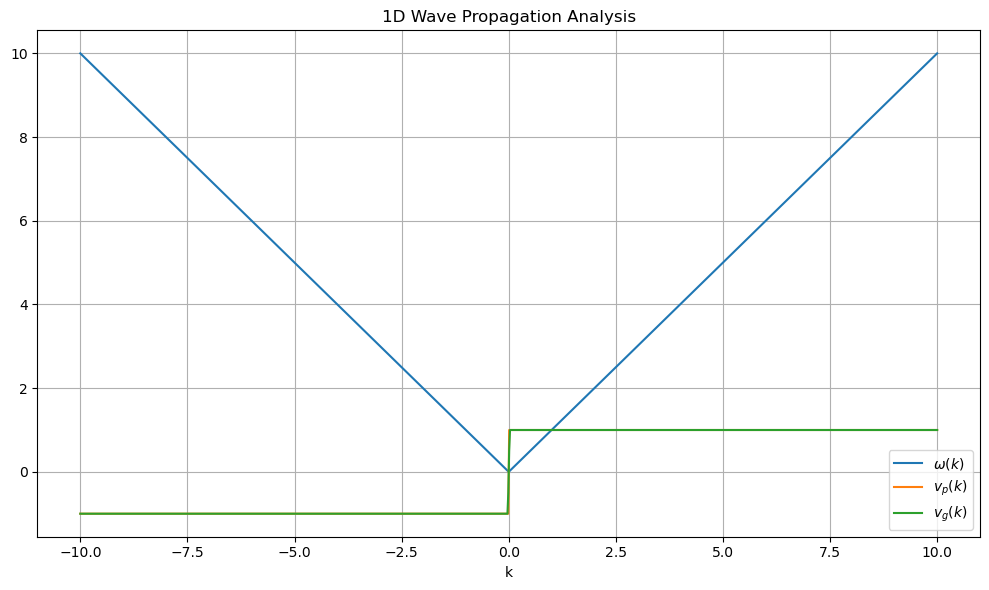


*******************
* Solving the PDE *
*******************



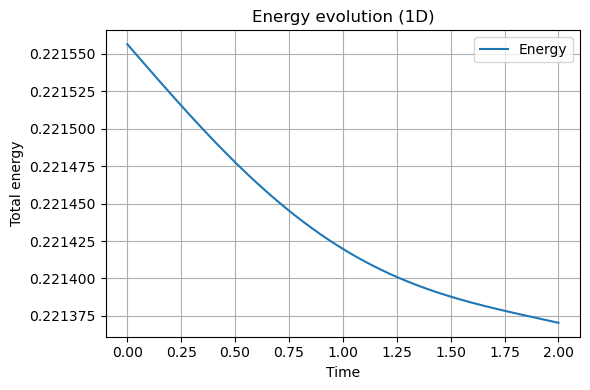

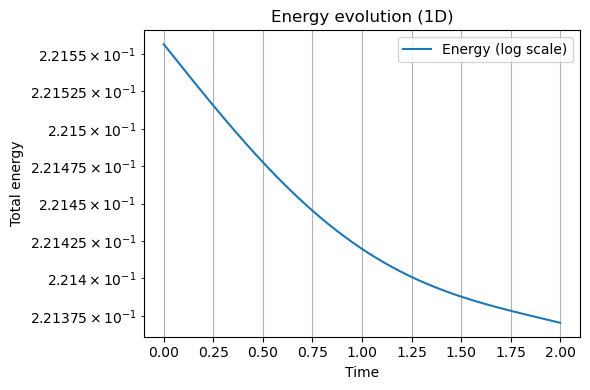

Closest available time to t_eval=0.0: 0.0
Test error t = 0.0: 2.832e-08


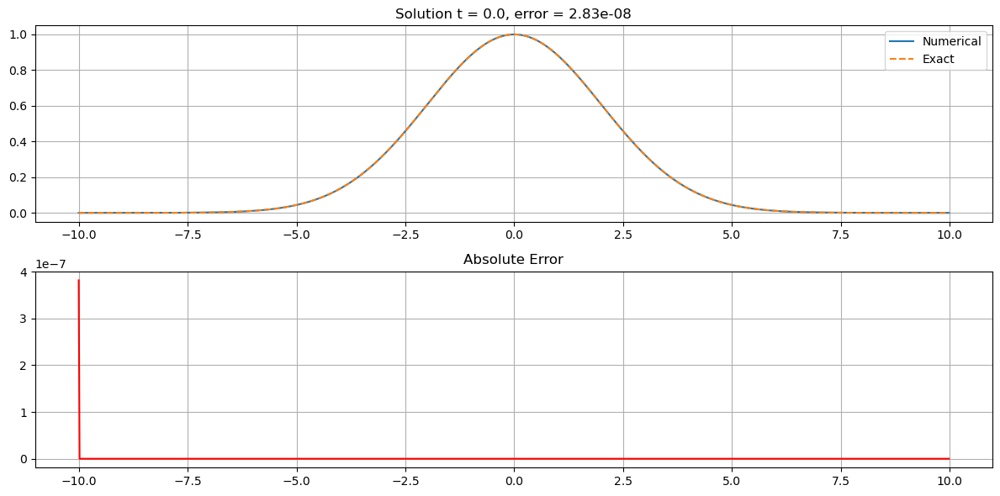

Closest available time to t_eval=0.5: 0.5
Test error t = 0.5: 1.794e-03


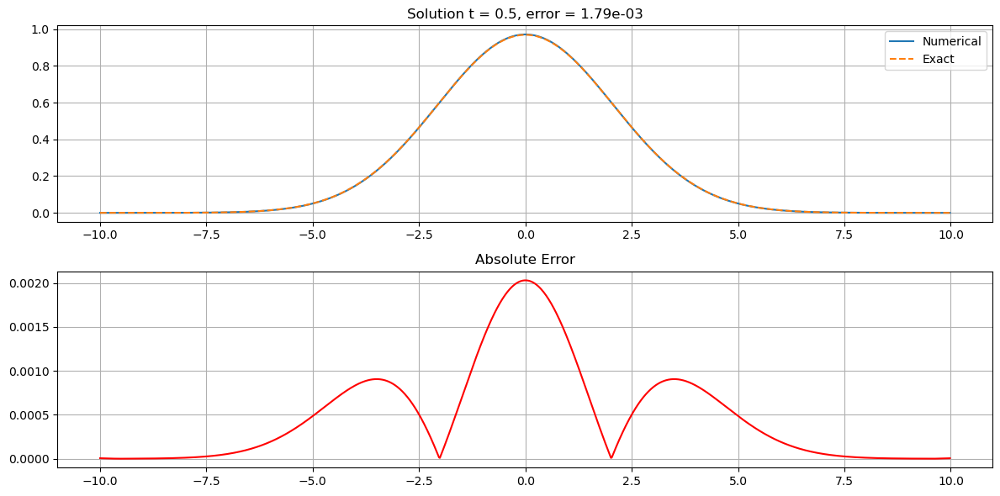

Closest available time to t_eval=1.0: 1.0
Test error t = 1.0: 3.518e-03


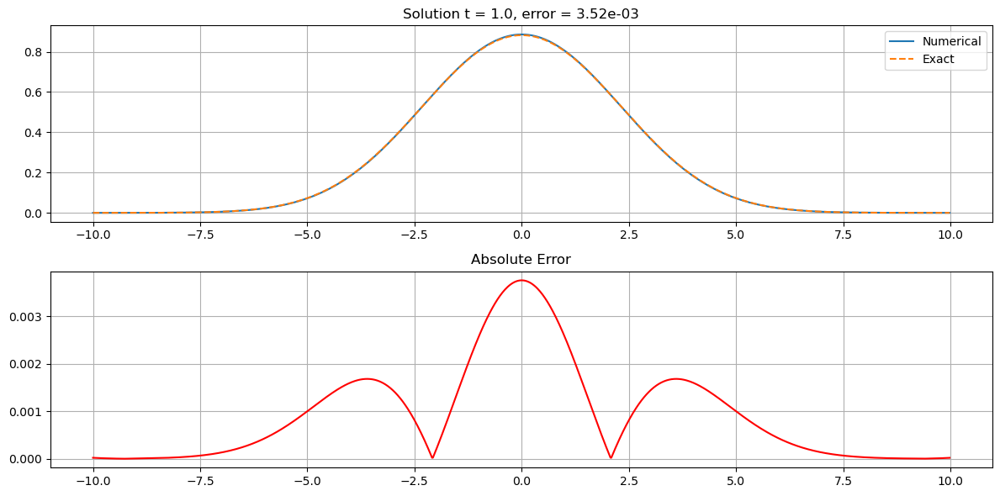

Closest available time to t_eval=1.5: 1.5
Test error t = 1.5: 5.012e-03


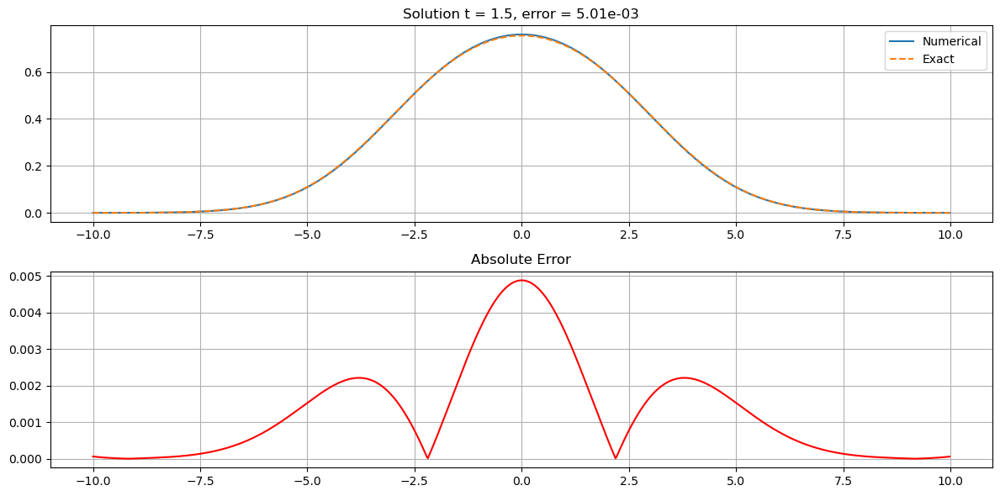

Closest available time to t_eval=2.0: 2.0
Test error t = 2.0: 6.131e-03


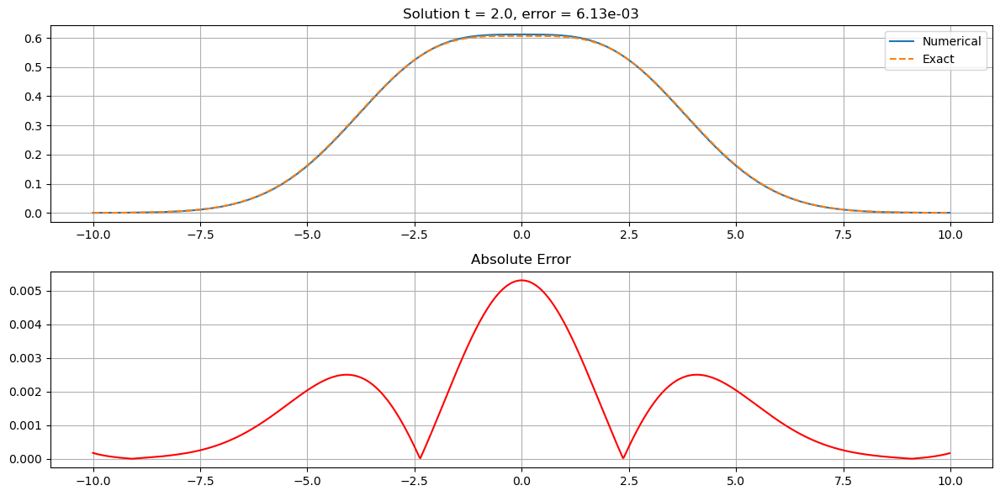

In [19]:
# Define the symbols and the wave equation
t, x, kx, xi, omega = symbols('t x kx xi omega')
u = Function('u')(t, x)

# 1D wave equation: ∂²u/∂t² = ∂²u/∂x²
eq = Eq(diff(u, t, t), diff(u, x, x))

# Create the PDE solver with ETD-RK4 time integration
solver = PDESolver(eq, time_scheme="ETD-RK4")

# Simulation parameters
Lt = 2.0           # Total simulation time
Lx = 20.0          # Spatial domain size (increased for better Gaussian containment)
Nx = 1024          # Number of spatial grid points
Nt = 1000          # Number of time steps

# Gaussian initial condition parameters
sigma = 2.0        # Standard deviation of the Gaussian
x0 = 0.0           # Center position

# Initial condition: Gaussian pulse
initial_condition = lambda x: np.exp(-(x - x0)**2 / (2*sigma**2))

# Exact solution using d'Alembert's formula for wave equation
def u_exact(x, t):
    return 0.5 * (np.exp(-(x - t - x0)**2 / (2*sigma**2)) + 
                  np.exp(-(x + t - x0)**2 / (2*sigma**2)))

# Setup the solver with increased domain size
solver.setup(
    Lx=Lx, Nx=Nx, Lt=Lt, Nt=Nt,
    initial_condition=initial_condition,
    initial_velocity=lambda x: np.zeros_like(x)  # Zero initial velocity
)

# Solve the equation
solver.solve()

# Visualize energy conservation
solver.plot_energy()
solver.plot_energy(log=True)

# Perform automatic validation tests
n_test = 4
test_set = [
    solver.test(
        u_exact=u_exact,
        t_eval=i * Lt / n_test,
        threshold=1e-2,    # Adjusted threshold for Gaussian decay
        component='real'
    )
    for i in range(n_test + 1)
]


## 1D wave equation with a source term


*********************************
* Partial differential equation *
*********************************

 2                                                               2          
∂                                                               ∂           
───(u(t, x)) = (-√2⋅sin(√2⋅t) + 3⋅cos(√2⋅t))⋅cos(x) - u(t, x) + ───(u(t, x))
  2                                                               2         
∂t                                                              ∂x          

********************
* Equation parsing *
********************


Equation rewritten in standard form: -(-sqrt(2)*sin(sqrt(2)*t) + 3*cos(sqrt(2)*t))*cos(x) + u(t, x) + Derivative(u(t, x), (t, 2)) - Derivative(u(t, x), (x, 2))

Expanded equation: u(t, x) + sqrt(2)*sin(sqrt(2)*t)*cos(x) - 3*cos(x)*cos(sqrt(2)*t) + Derivative(u(t, x), (t, 2)) - Derivative(u(t, x), (x, 2))
Analyzing term: u(t, x)
  --> Classified as linear
Analyzing term: sqrt(2)*sin(sqrt(2)*t)*cos(x)
  --> Classified as source term
Analyzing 

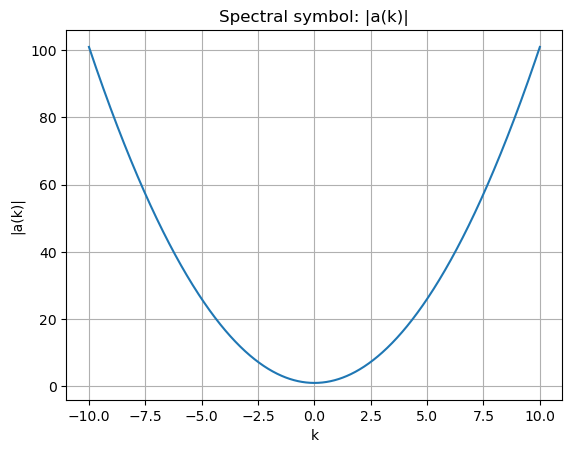


*****************************
* Wave propagation analysis *
*****************************



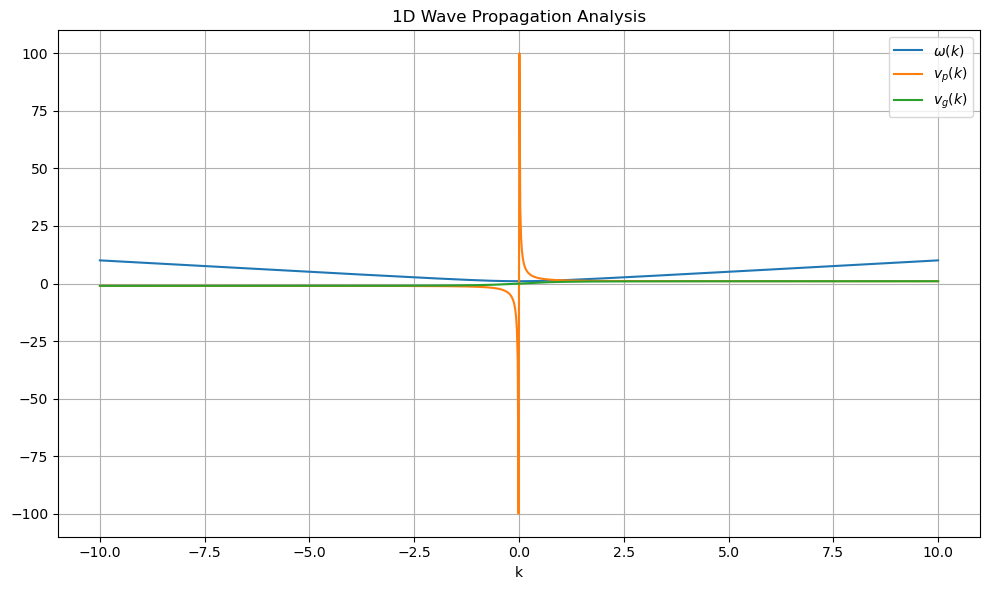


*******************
* Solving the PDE *
*******************



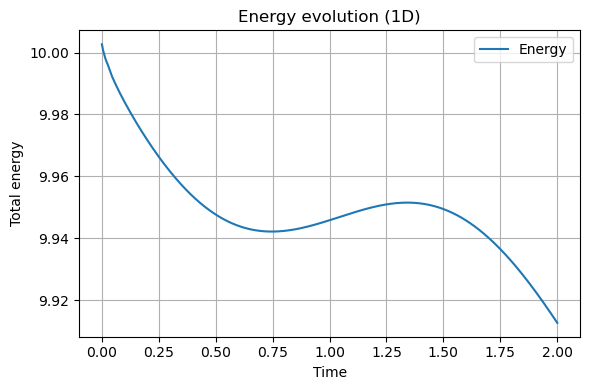

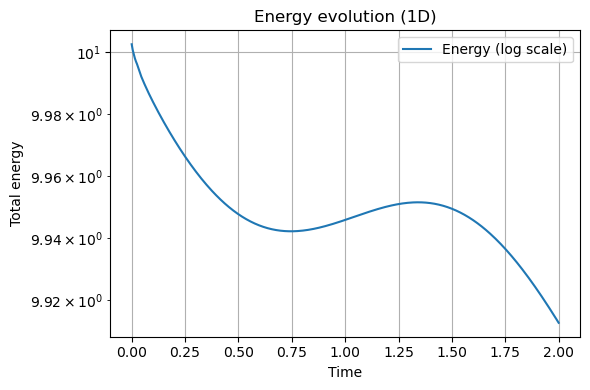

Closest available time to t_eval=0.0: 0.0
Test error t = 0.0: 8.905e-04


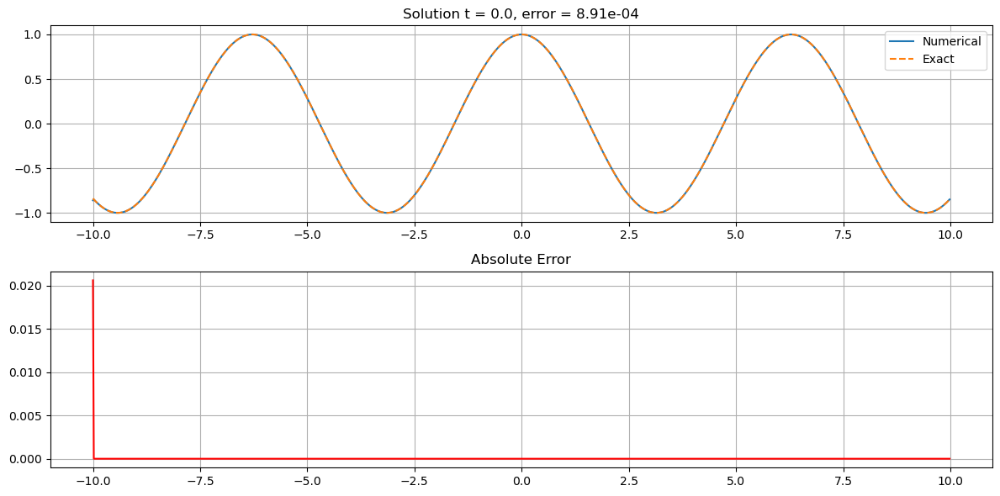

Closest available time to t_eval=0.5: 0.5
Test error t = 0.5: 6.417e-02


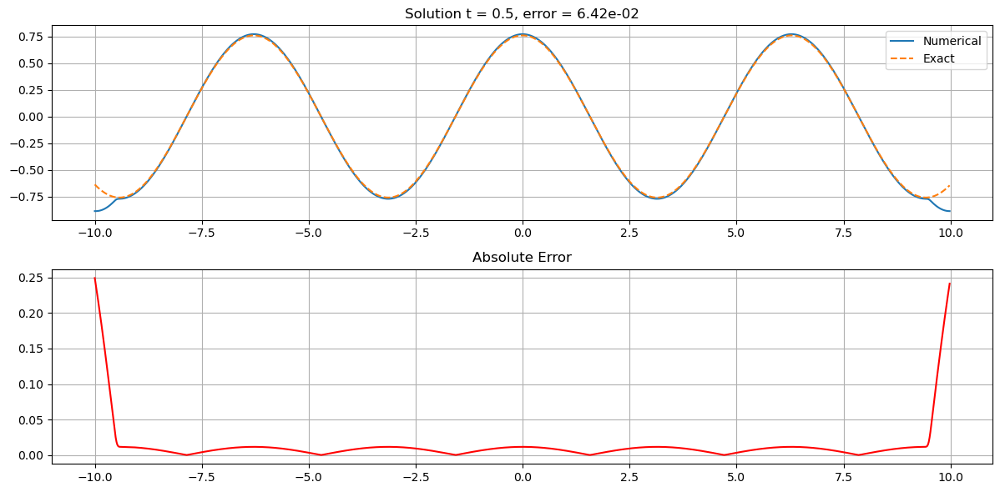

Closest available time to t_eval=1.0: 1.0
Test error t = 1.0: 6.890e-01


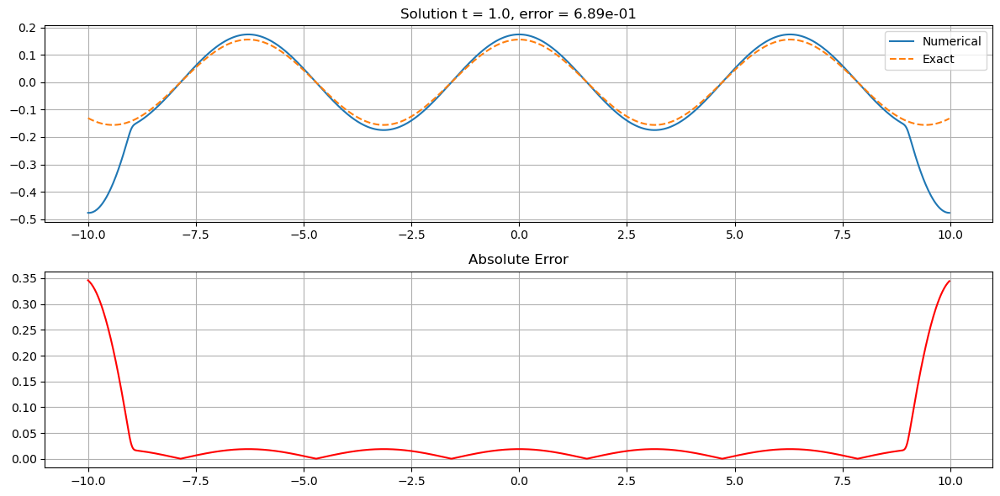

Closest available time to t_eval=1.5: 1.5
Test error t = 1.5: 2.464e-01


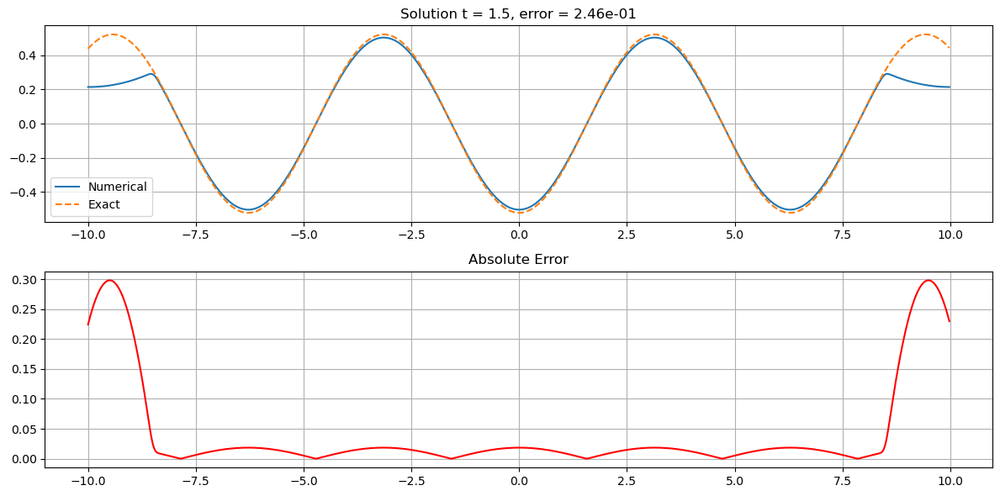

Closest available time to t_eval=2.0: 2.0
Test error t = 2.0: 1.127e-01


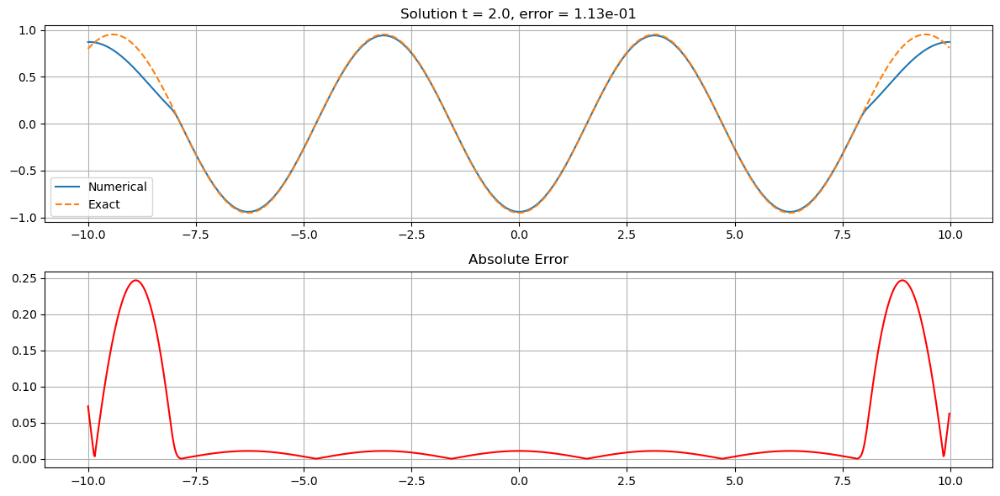

In [20]:
# Define the symbols and the wave equation with a source term
t, x, kx, xi, omega = symbols('t x kx xi omega')
u_func = Function('u')
u = u_func(t, x)

# Source term
source_term = cos(x) * (3 * cos(sqrt(2) * t) - sqrt(2) * sin(sqrt(2) * t))

# Equation with source term
eq = Eq(diff(u, t, t), diff(u, x, x) - u + source_term)

# Create the solver with ETD-RK4 scheme
solver = PDESolver(eq, time_scheme='ETD-RK4', dealiasing_ratio=1)

# Simulation parameters
Lt = 2.0  # Total simulation time
solver.setup(
    Lx=20, Nx=1024, Lt=Lt, Nt=400,
    initial_condition=lambda x: np.cos(x),
    initial_velocity=lambda x: np.zeros_like(x)
)

# Solving
solver.solve()

# Plot energy evolution
solver.plot_energy()
solver.plot_energy(log=True)

# Exact solution at t = 2: harmonic oscillation with frequency sqrt(2)
def u_exact(x, t):
    return np.cos(x) * np.cos(np.sqrt(2) * t)

# Automatic testing
n_test = 4
test_set = [
    solver.test(
        u_exact=u_exact,
        t_eval=i * Lt / n_test,
        threshold=1,  # Adjust threshold if necessary
        component='real'
    )
    for i in range(n_test + 1)
]

## 1D wave equation with Op


*********************************
* Partial differential equation *
*********************************

 2              2                                  
∂              ∂                 ⎛    1.4         ⎞
───(u(t, x)) - ───(u(t, x)) = -Op⎝│kx│   , u(t, x)⎠
  2              2                                 
∂t             ∂x                                  

********************
* Equation parsing *
********************


Equation rewritten in standard form: Op(Abs(kx)**1.4, u(t, x)) + Derivative(u(t, x), (t, 2)) - Derivative(u(t, x), (x, 2))

Expanded equation: Op(Abs(kx)**1.4, u(t, x)) + Derivative(u(t, x), (t, 2)) - Derivative(u(t, x), (x, 2))
Analyzing term: Op(Abs(kx)**1.4, u(t, x))
  --> Classified as symbolic linear term (Op)
Analyzing term: Derivative(u(t, x), (t, 2))
  Derivative found: Derivative(u(t, x), (t, 2))
  --> Classified as linear
Analyzing term: -Derivative(u(t, x), (x, 2))
  Derivative found: Derivative(u(t, x), (x, 2))
  --> Classified as linear
Final linear t

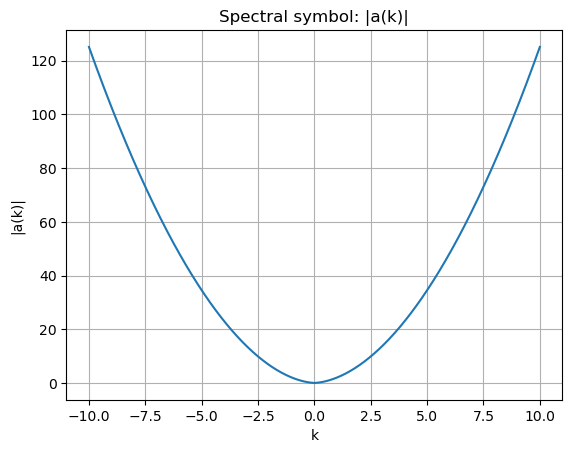


*****************************
* Wave propagation analysis *
*****************************



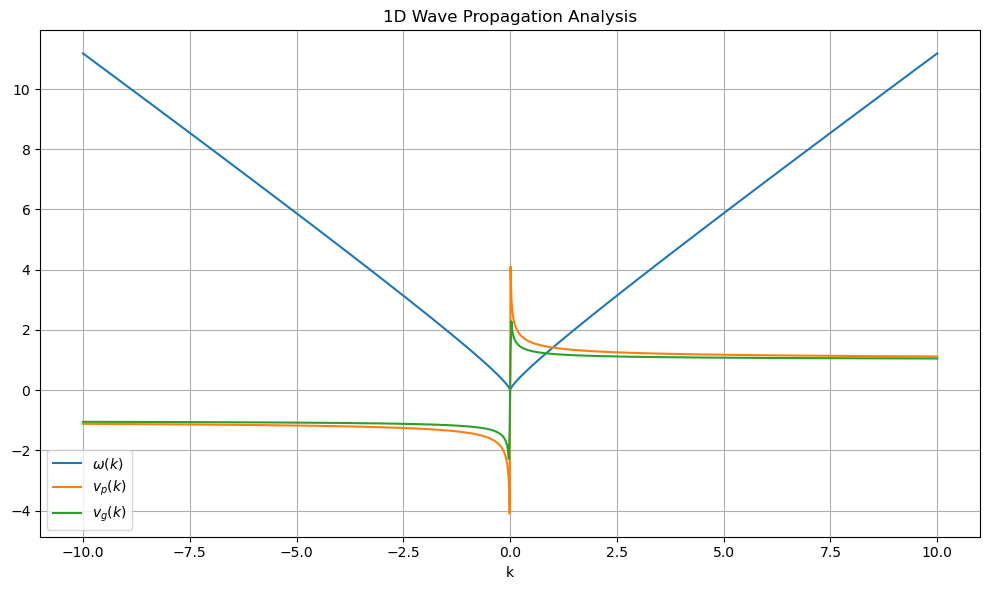


*******************
* Solving the PDE *
*******************

Closest available time to t_eval=0.0: 0.0
Test error t = 0.0: 6.134e-03


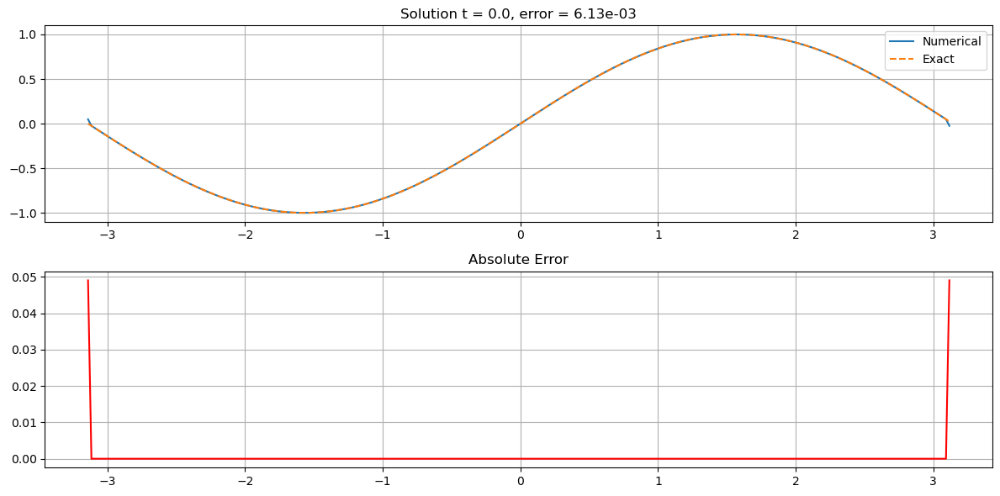

Closest available time to t_eval=0.5: 0.5
Test error t = 0.5: 2.523e-02


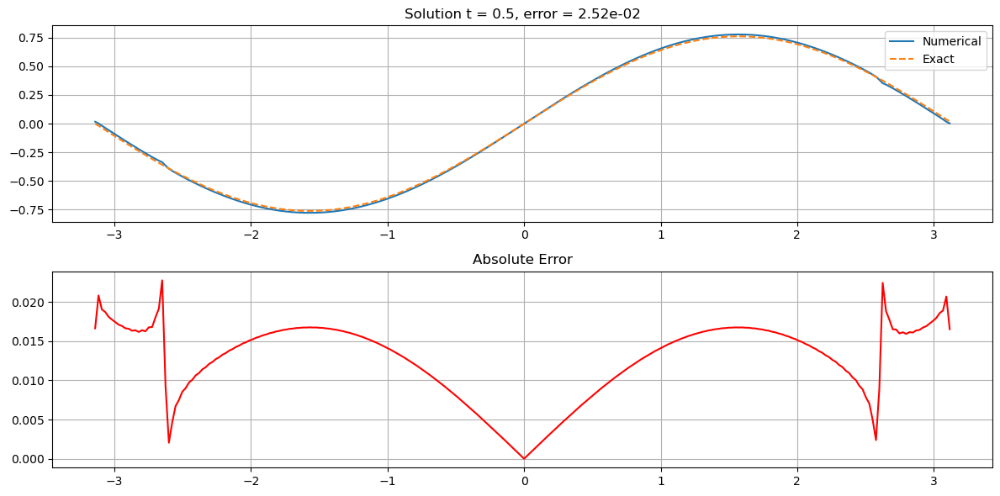

Closest available time to t_eval=1.0: 1.0
Test error t = 1.0: 1.416e-01


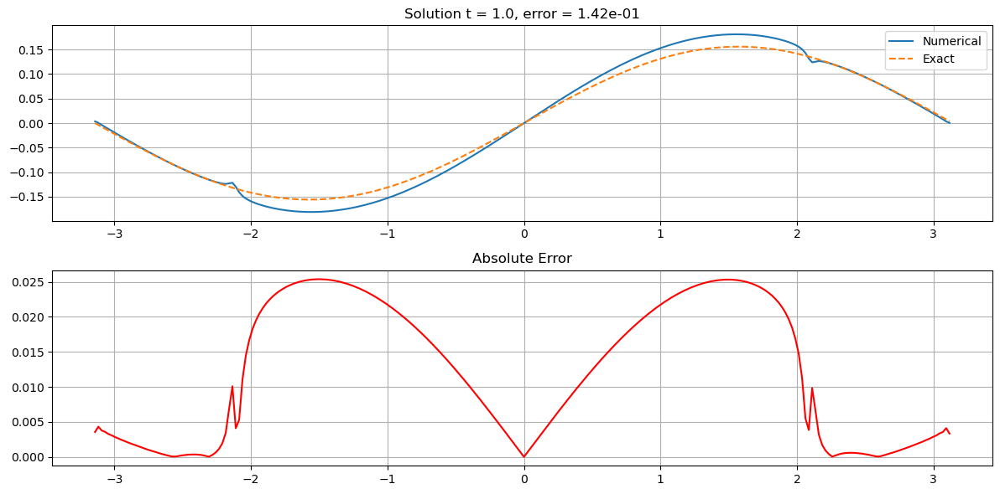

Closest available time to t_eval=1.5: 1.5
Test error t = 1.5: 3.260e-02


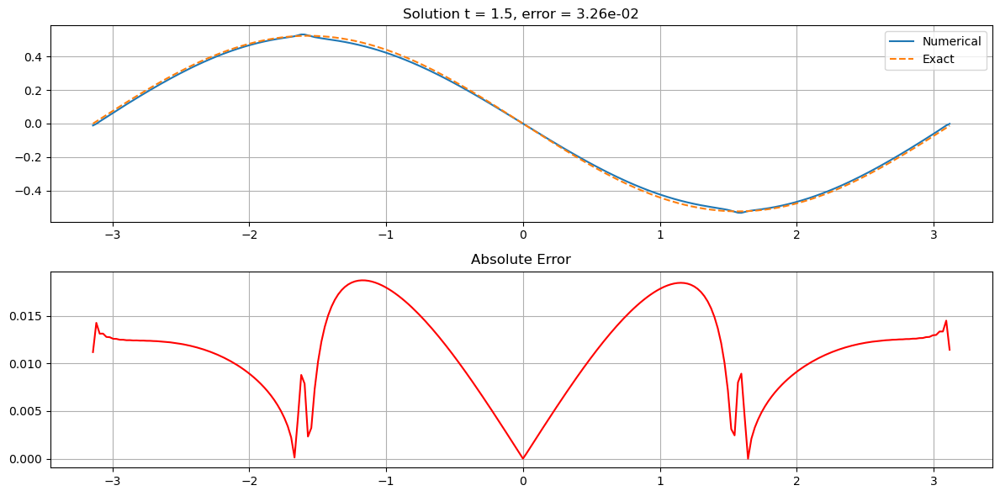

Closest available time to t_eval=2.0: 2.0
Test error t = 2.0: 1.805e-02


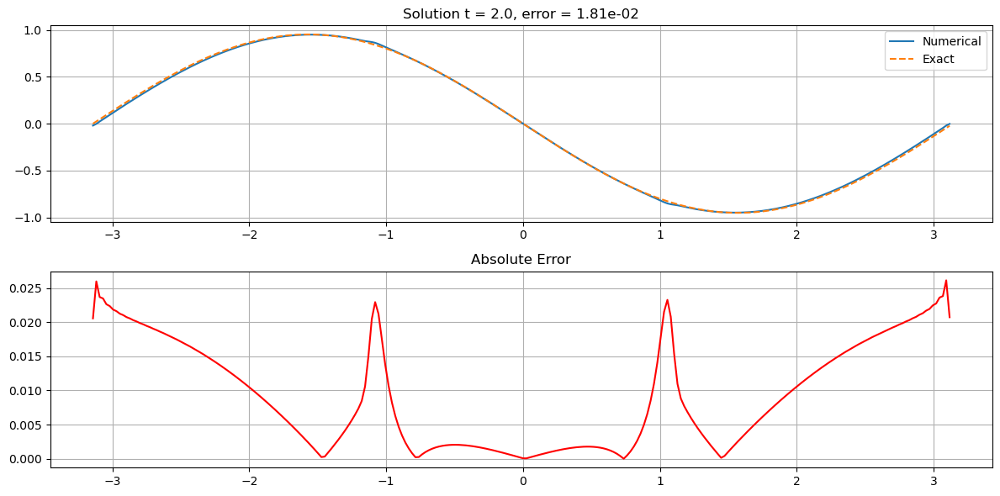

In [21]:
# Define symbols and equation
t, x, kx, xi, omega = symbols('t x kx xi omega')
u_func = Function('u')
u = u_func(t, x)

# Parameters
gamma = 1.4

# Equation
eq = Eq(diff(u, t, 2) - diff(u, x, 2), -Op(abs(kx)**gamma, u))

# Create the solver
solver = PDESolver(eq, dealiasing_ratio=0.5, time_scheme='ETD-RK4')
Lt=2.0
# Domain and initial condition setup
solver.setup(
    Lx=2 * np.pi, Nx=256, Lt=Lt, Nt=2000,
    initial_condition=lambda x: np.sin(x),
    initial_velocity=lambda x: np.zeros_like(x)  # Correction ici
)

# Solve the equation
solver.solve()

# Exact solution function at t = 1
def u_exact(x, t):
    return np.sin(x) * np.cos(np.sqrt(1 + abs(1)**gamma) * t)

# Automatic testing
n_test = 4
test_set = [solver.test(u_exact=u_exact, t_eval=i * Lt / n_test, threshold=0.2, component='real') for i in range(n_test + 1)]

## 1D wave equation with psiOp


*********************************
* Partial differential equation *
*********************************

 2                                
∂                   ⎛  2         ⎞
───(u(t, x)) = psiOp⎝-ξ , u(t, x)⎠
  2                               
∂t                                

********************
* Equation parsing *
********************


Equation rewritten in standard form: -psiOp(-xi**2, u(t, x)) + Derivative(u(t, x), (t, 2))
⚠️ psiOp detected: skipping expansion for safety

Expanded equation: -psiOp(-xi**2, u(t, x)) + Derivative(u(t, x), (t, 2))
Analyzing term: -psiOp(-xi**2, u(t, x))
  --> Classified as pseudo linear term (psiOp)
Analyzing term: Derivative(u(t, x), (t, 2))
  Derivative found: Derivative(u(t, x), (t, 2))
  --> Classified as linear
Final linear terms: {Derivative(u(t, x), (t, 2)): 1}
Final nonlinear terms: []
Symbol terms: []
Pseudo terms: [(-1, -xi**2)]
Source terms: []
⚠️  Pseudo‑differential operator detected: all other linear terms have been rejected.

******

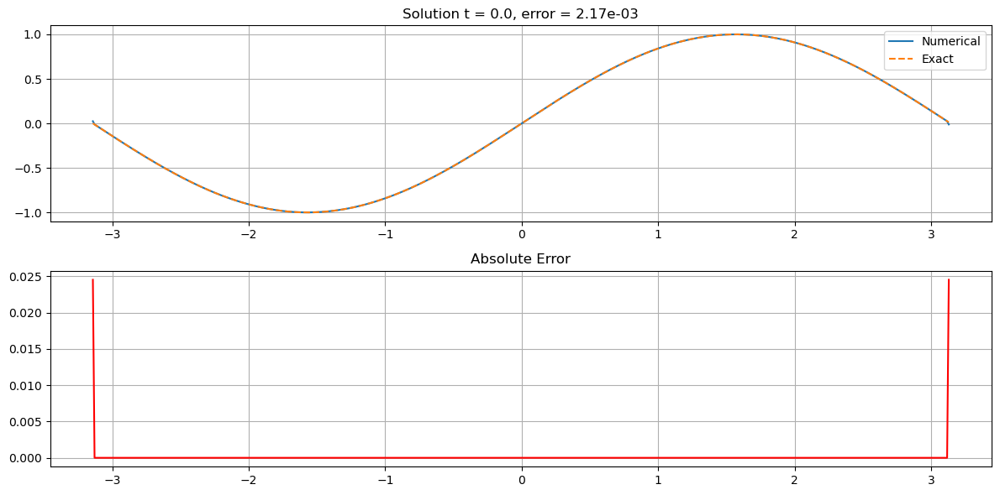

Closest available time to t_eval=0.5: 0.5
Test error t = 0.5: 2.526e-02


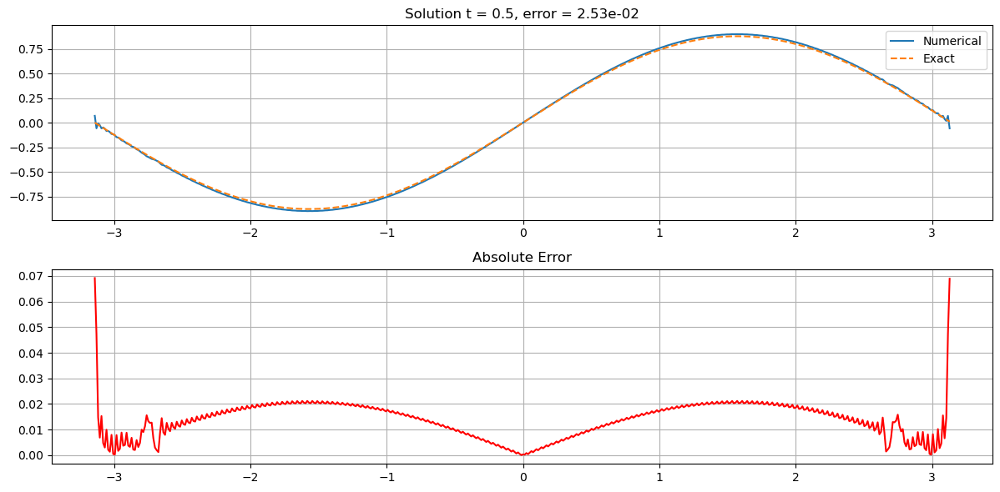

Closest available time to t_eval=1.0: 1.0
Test error t = 1.0: 6.972e-02


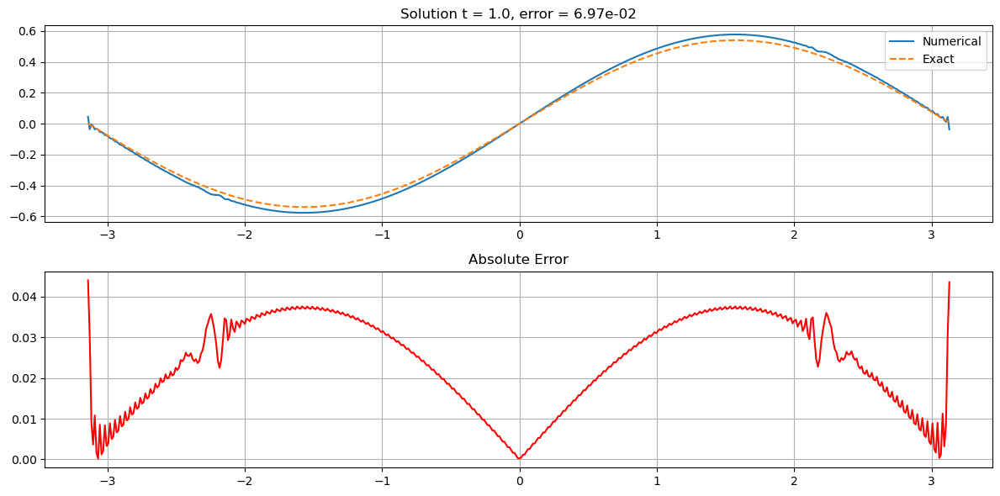

Closest available time to t_eval=1.5: 1.5
Test error t = 1.5: 6.340e-01


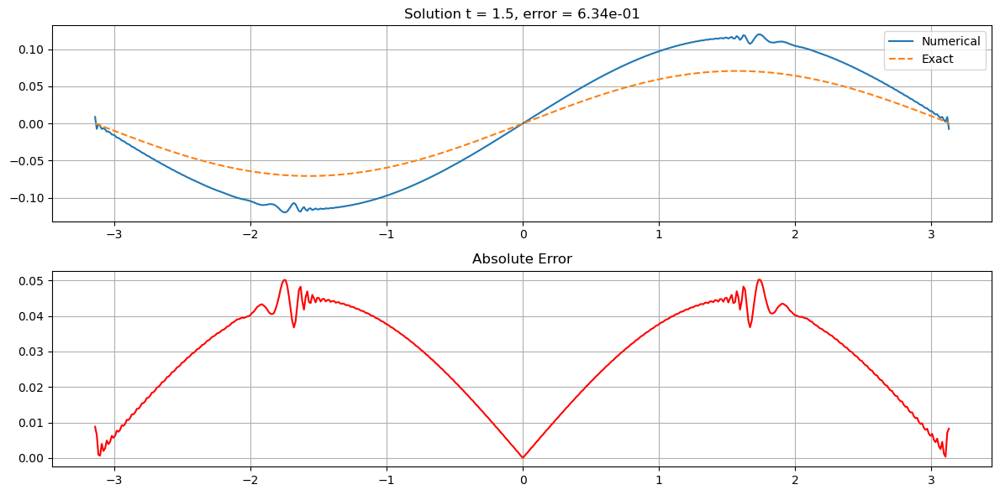

Closest available time to t_eval=2.0: 2.0
Test error t = 2.0: 9.970e-02


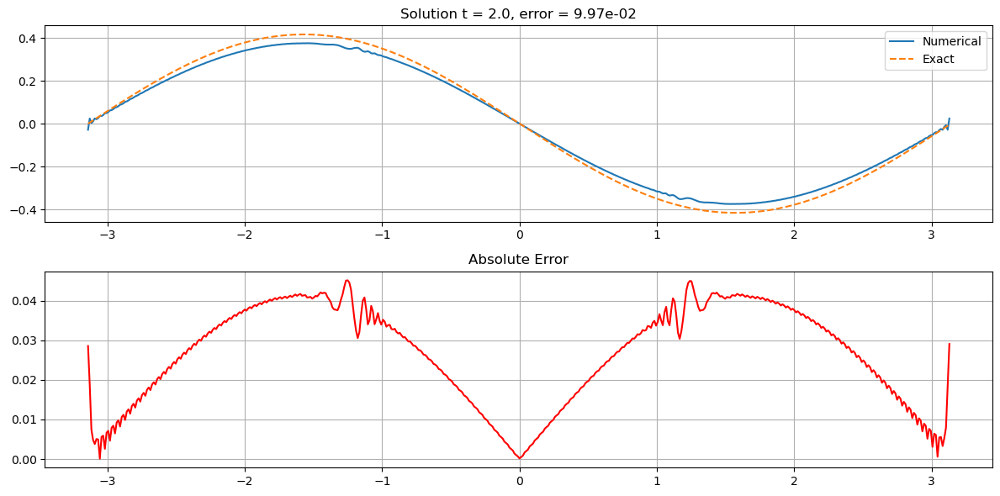

Closest available time to t_eval=2.5: 2.5
Test error t = 2.5: 3.567e-02


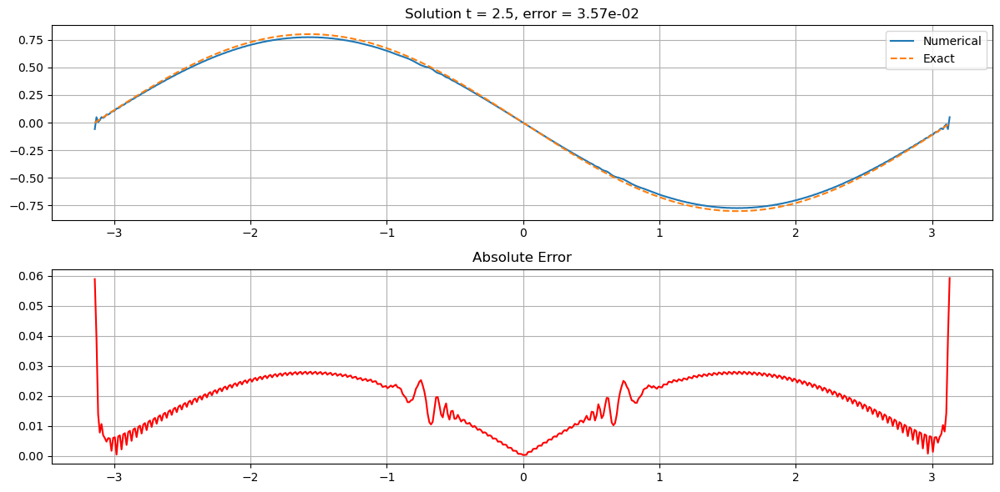

Closest available time to t_eval=3.0: 3.0
Test error t = 3.0: 1.146e-02


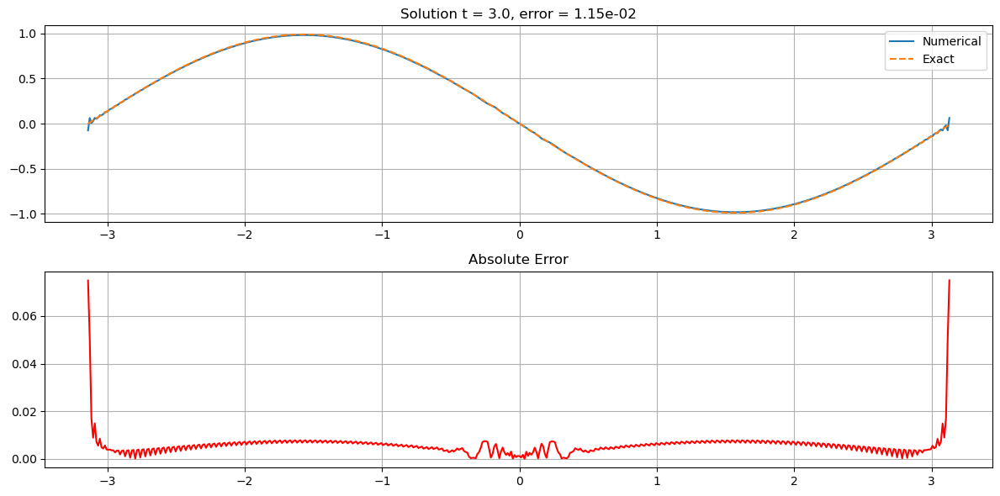

Closest available time to t_eval=3.5: 3.5
Test error t = 3.5: 1.818e-02


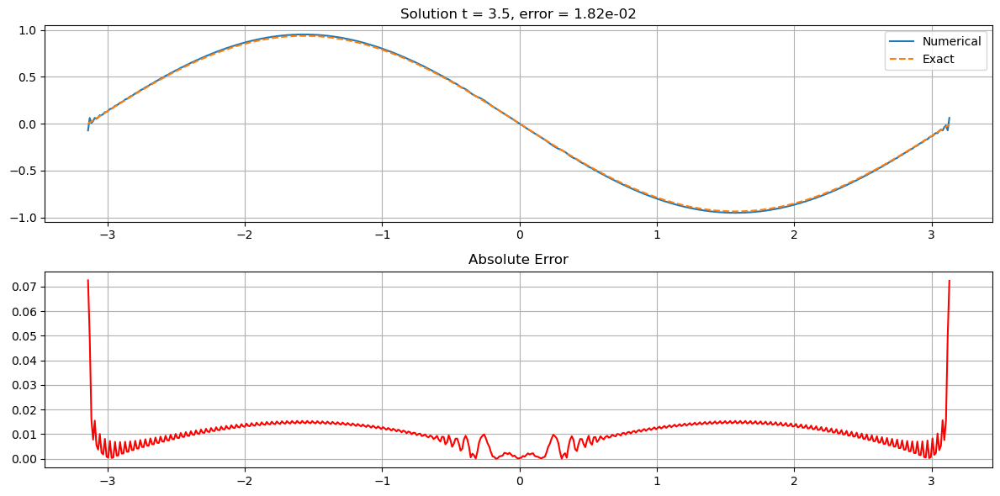

Closest available time to t_eval=4.0: 4.0
Test error t = 4.0: 5.193e-02


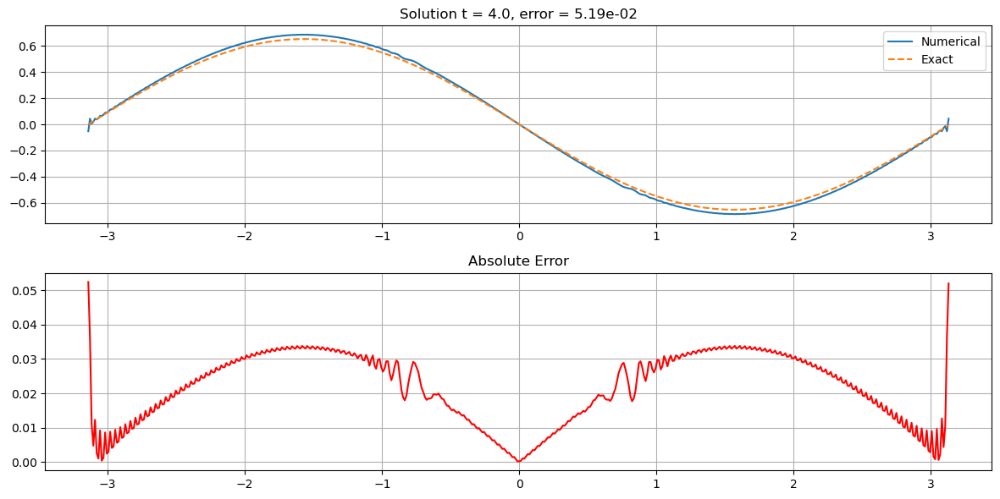

Closest available time to t_eval=4.5: 4.5
Test error t = 4.5: 2.080e-01


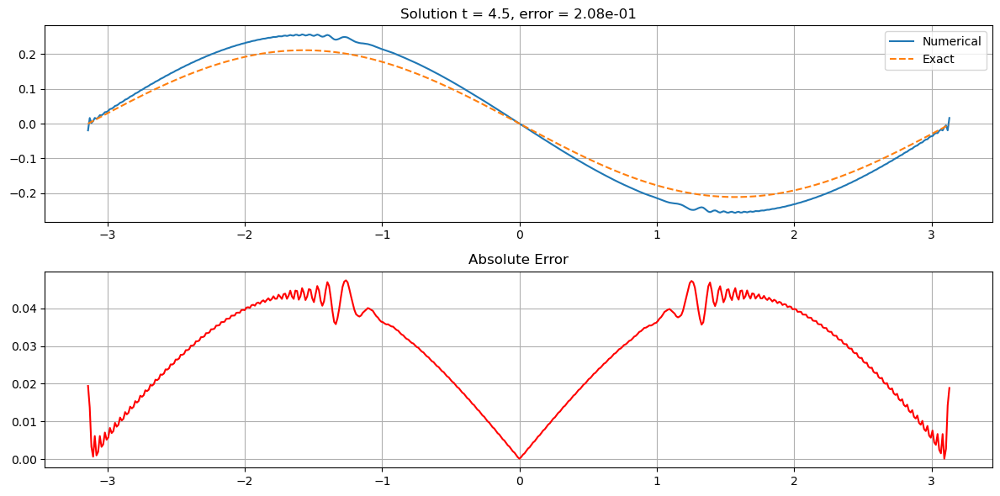

Closest available time to t_eval=5.0: 5.0
Test error t = 5.0: 1.534e-01


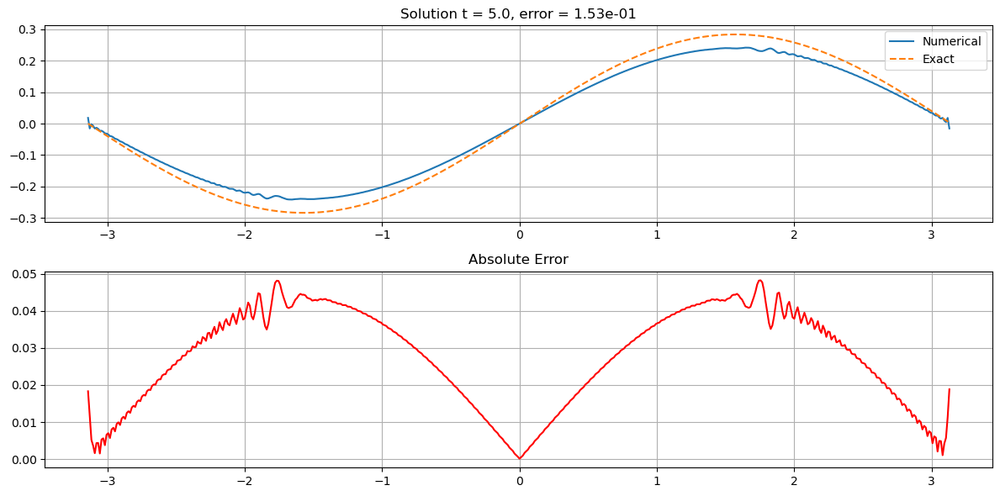

In [22]:
# Define the symbols
t, x, xi = symbols('t x xi', real=True)
u_func = Function('u') 
u = u_func(t, x)

# Wave equation with psiOp
eq = Eq(diff(u, t, t), psiOp((-I*xi)**2, u))

# Create the solver
solver = PDESolver(eq)

Lt = 5.0

# Domain and initial conditions setup
solver.setup(
    Lx=2 * np.pi, Nx=512, Lt=Lt, Nt=1000,
    initial_condition=lambda x: np.sin(x),
    initial_velocity=lambda x: np.zeros_like(x)  # ∂u/∂t(x,0) = 0
)

# Solve
solver.solve()

# Plot energy
solver.plot_energy()
solver.plot_energy(log=True)

# Exact solution
def u_exact(x, t):
    return np.sin(x) * np.cos(t)

# Automatic testing
n_test = 10
test_set = [solver.test(u_exact=u_exact, t_eval=i * Lt / n_test, threshold=1, component='real') for i in range(n_test + 1)]


## 1D equation with psiOp depending on spatial variable


*********************************
* Partial differential equation *
*********************************

 2                                                                             ↪
∂                                   ⎛ 2                            ⎞        ⎛  ↪
───(u(t, x)) = sin(x)⋅cos(t) - psiOp⎝ξ ⋅(cos(x) + 1), sin(x)⋅cos(t)⎠ + psiOp⎝ξ ↪
  2                                                                            ↪
∂t                                                                             ↪

↪                         
↪ 2                      ⎞
↪  ⋅(cos(x) + 1), u(t, x)⎠
↪                         
↪                         

********************
* Equation parsing *
********************


Equation rewritten in standard form: -sin(x)*cos(t) + psiOp(xi**2*(cos(x) + 1), sin(x)*cos(t)) - psiOp(xi**2*(cos(x) + 1), u(t, x)) + Derivative(u(t, x), (t, 2))
⚠️ psiOp detected: skipping expansion for safety

Expanded equation: -sin(x)*cos(t) + psiOp(xi**2*(cos(x) + 1), sin(x)*cos(t)) 

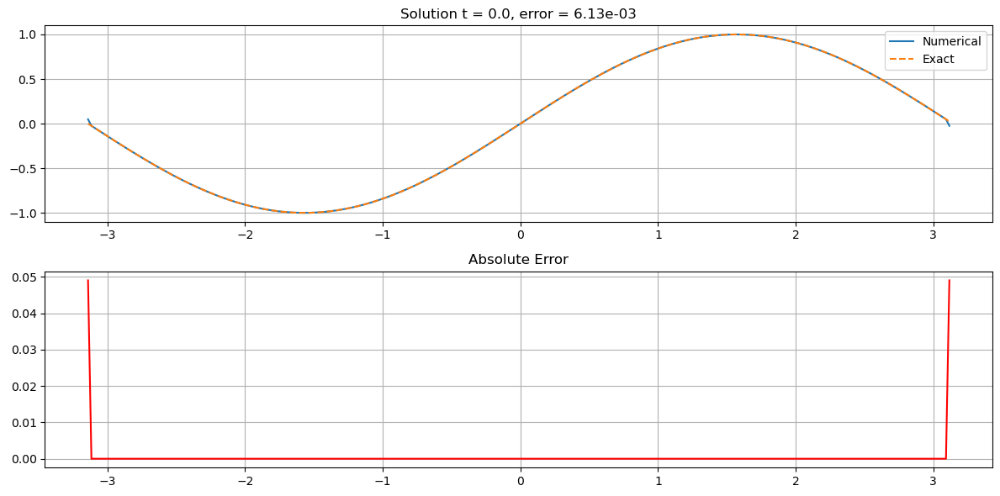

Closest available time to t_eval=0.5: 0.5
Test error t = 0.5: 9.476e-03


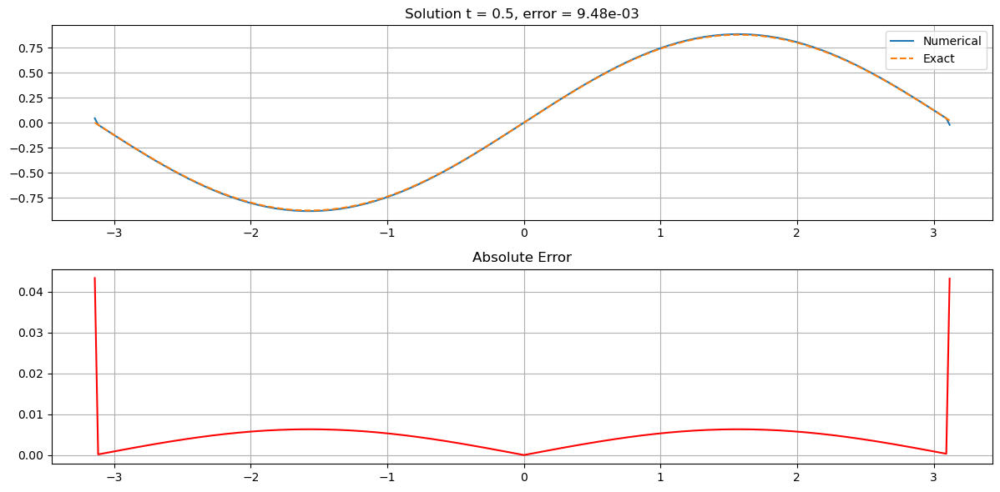

Closest available time to t_eval=1.0: 1.0
Test error t = 1.0: 2.159e-02


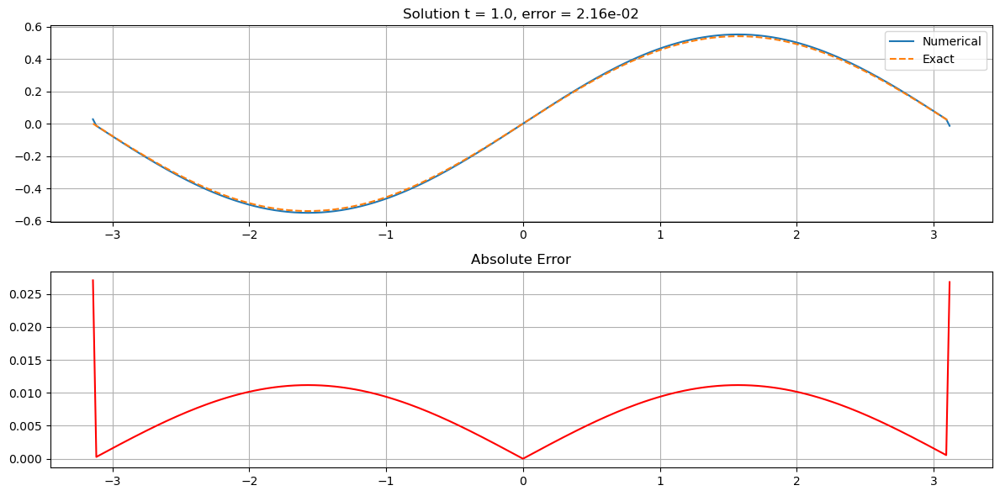

Closest available time to t_eval=1.5: 1.5
Test error t = 1.5: 1.880e-01


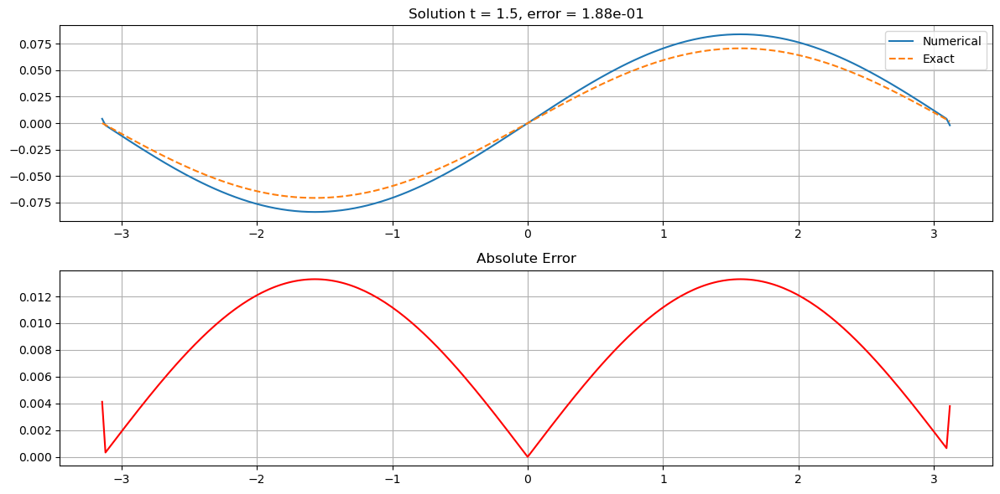

Closest available time to t_eval=2.0: 2.0
Test error t = 2.0: 2.982e-02


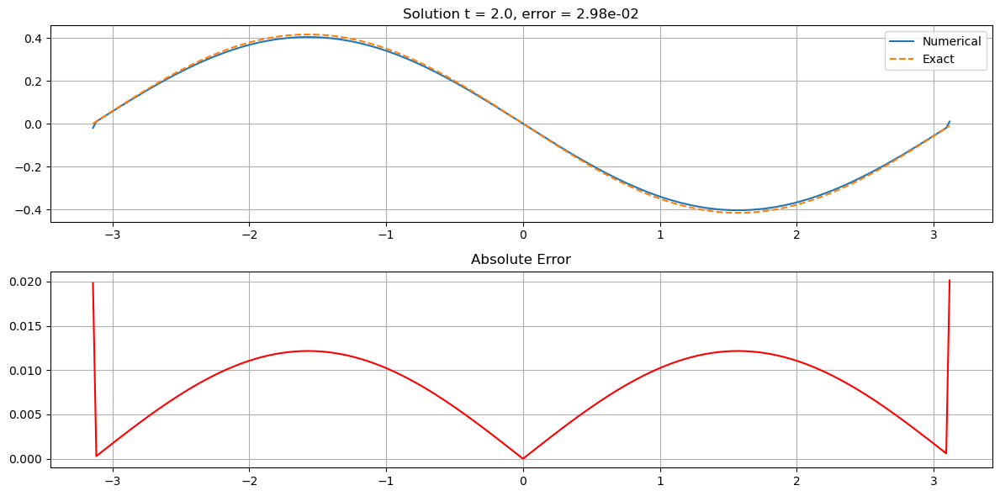

In [23]:
from sympy import symbols, Function, Eq, diff, sin, cos
import numpy as np

# Symbols
u = Function('u')
t, x, xi = symbols('t x xi', real=True)

# Exact solution
u_exact_expr = sin(x) * cos(t)

# Symbol for the pseudo-differential operator (regular, x-dependent)
symbol_expr = (1 + cos(x)) * xi**2

# Compute source term: f(x,t) = ∂²ₜ u + psiOp(p, u)
lhs = diff(u_exact_expr, t, t)
rhs = psiOp(symbol_expr, u_exact_expr)
source_expr = lhs + rhs  # because we move psiOp to RHS with a minus

# Define the PDE
eq = Eq(diff(u(t, x), t, t), psiOp(symbol_expr, u(t, x)) - source_expr)

# Setup the solver
solver = PDESolver(eq)
Lt = 2.0
solver.setup(Lx=2 * np.pi, Nx=256, Lt=Lt, Nt=300,
             initial_condition=lambda x: np.sin(x),       # u(x,0)
             initial_velocity=lambda x: 0*x)              # ∂ₜu(x,0)

# Solve the PDE
solver.solve()

# Exact solution for testing
def u_exact(x, t):
    return np.sin(x) * np.cos(t)

# Perform tests
n_test = 4
test_set = [
    solver.test(u_exact=u_exact, t_eval=i * Lt / n_test,
                threshold=0.5, component='real')
    for i in range(n_test + 1)
]


## 1D KdV equation


*********************************
* Partial differential equation *
*********************************

                                       3              
          ∂             ∂             ∂               
6⋅u(t, x)⋅──(u(t, x)) + ──(u(t, x)) - ───(u(t, x)) = 0
          ∂x            ∂t              3             
                                      ∂x              

********************
* Equation parsing *
********************


Equation rewritten in standard form: 6*u(t, x)*Derivative(u(t, x), x) + Derivative(u(t, x), t) - Derivative(u(t, x), (x, 3))

Expanded equation: 6*u(t, x)*Derivative(u(t, x), x) + Derivative(u(t, x), t) - Derivative(u(t, x), (x, 3))
Analyzing term: 6*u(t, x)*Derivative(u(t, x), x)
  --> Classified as nonlinear
Analyzing term: Derivative(u(t, x), t)
  Derivative found: Derivative(u(t, x), t)
  --> Classified as linear
Analyzing term: -Derivative(u(t, x), (x, 3))
  Derivative found: Derivative(u(t, x), (x, 3))
  --> Classified as linear
Final linear t

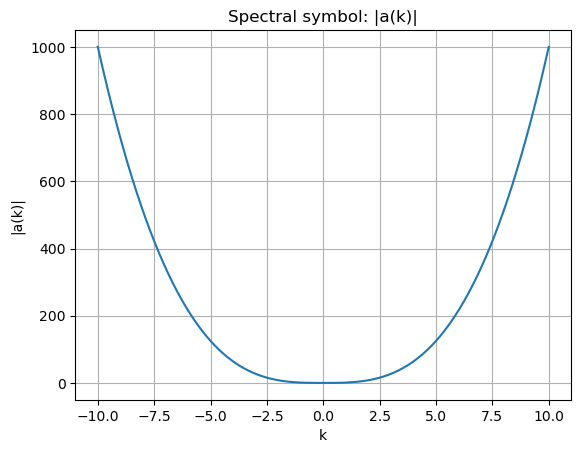


*******************
* Solving the PDE *
*******************

Closest available time to t_eval=0.0: 0.0
Test error t = 0.0: 5.816e-09


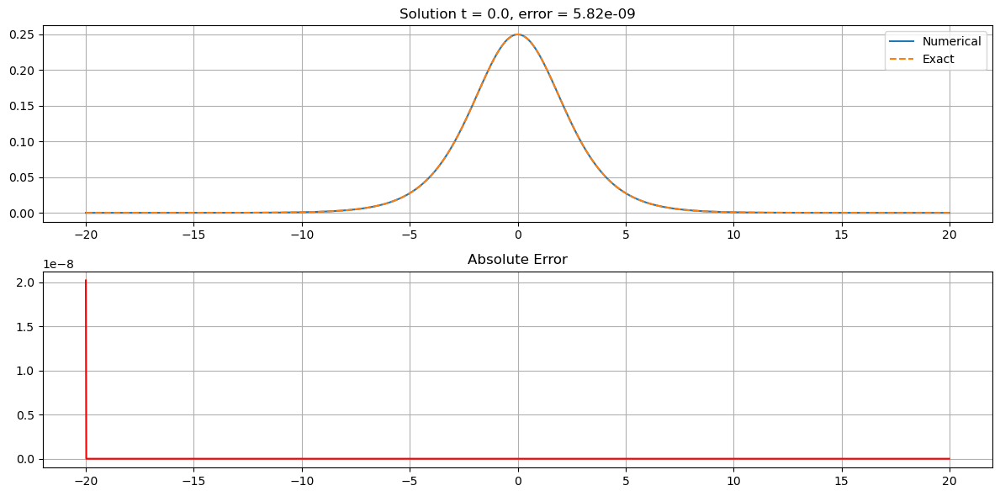

Closest available time to t_eval=1.25: 1.25
Test error t = 1.25: 1.365e-01


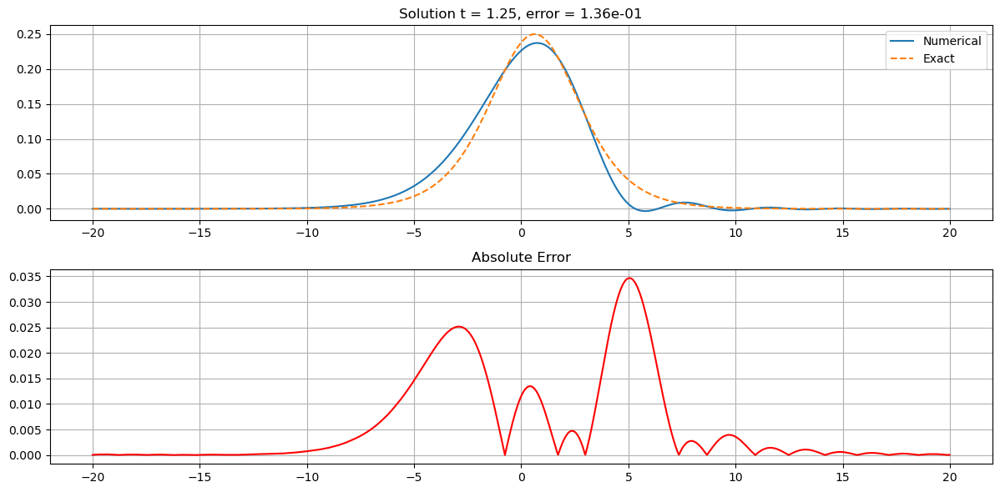

Closest available time to t_eval=2.5: 2.5
Test error t = 2.5: 2.556e-01


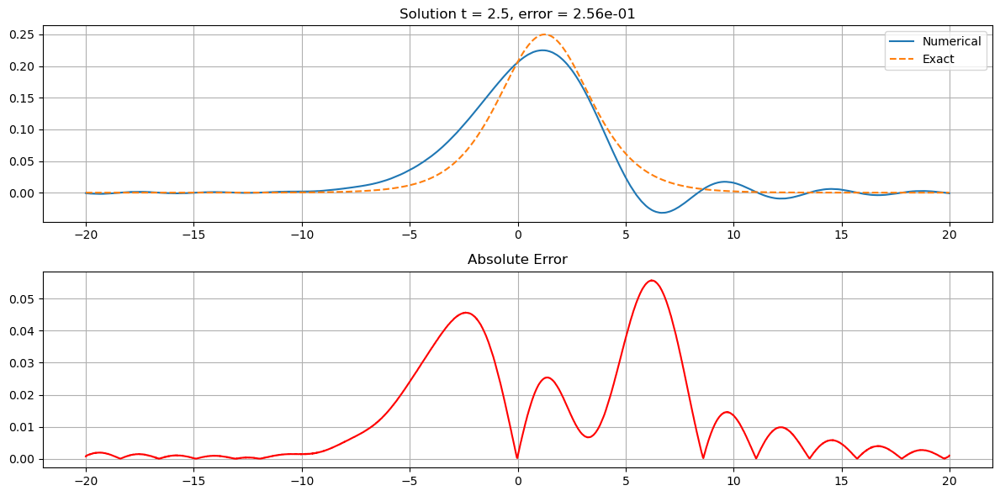

Closest available time to t_eval=3.75: 3.75
Test error t = 3.75: 3.668e-01


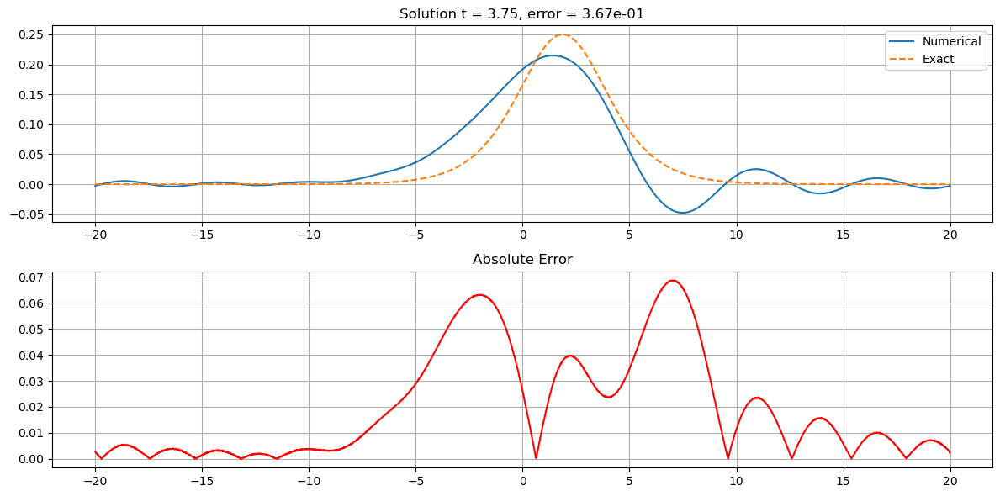

Closest available time to t_eval=5.0: 5.0
Test error t = 5.0: 4.741e-01


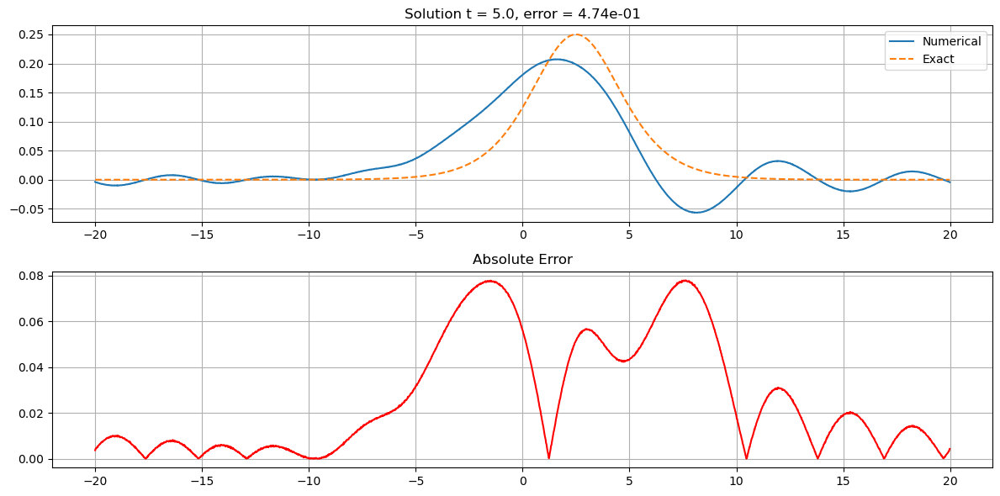

In [24]:
# Define the symbols and the KdV equation
t, x, kx, xi, omega = symbols('t x kx xi omega')
u_func = Function('u') 
u = u_func(t, x)


eq = Eq(diff(u, t) + 6 * u * diff(u, x) - diff(u, x, x, x), 0)  # Standard KdV form

# Soliton parameters
c = 0.5   # Speed and amplitude of the soliton
x0 = 0.0  # Initial position

# Initial condition: centered soliton
initial_condition = lambda x: c / 2 * (1 / np.cosh(np.sqrt(c)/2 * (x - x0)))**2

# Create the solver with periodic boundary conditions and adapted dealiasing
solver = PDESolver(eq, time_scheme='ETD-RK4', dealiasing_ratio=1)

# Simulation parameters
Lx = 40
Nx = 2048
Lt = 5.0
Nt = 1000

# Setup
solver.setup(Lx=Lx, Nx=Nx, Lt=Lt, Nt=Nt, initial_condition=initial_condition)

# Solve
solver.solve()

# Exact solution at t = Lt
def u_exact(x, t):
    return c / 2 * (1 / np.cosh(np.sqrt(c)/2 * (x - c*t - x0)))**2

# Automatic testing
n_test = 4
test_set = [solver.test(u_exact=u_exact, t_eval=i * Lt / n_test, threshold=5, component='real') for i in range(n_test + 1)]


## 1D Schrodinger equation


*********************************
* Partial differential equation *
*********************************

                 2          
  ∂             ∂           
ⅈ⋅──(u(t, x)) = ───(u(t, x))
  ∂t              2         
                ∂x          

********************
* Equation parsing *
********************


Equation rewritten in standard form: I*Derivative(u(t, x), t) - Derivative(u(t, x), (x, 2))

Expanded equation: I*Derivative(u(t, x), t) - Derivative(u(t, x), (x, 2))
Analyzing term: I*Derivative(u(t, x), t)
  Derivative found: Derivative(u(t, x), t)
  --> Classified as linear
Analyzing term: -Derivative(u(t, x), (x, 2))
  Derivative found: Derivative(u(t, x), (x, 2))
  --> Classified as linear
Final linear terms: {Derivative(u(t, x), t): I, Derivative(u(t, x), (x, 2)): -1}
Final nonlinear terms: []
Symbol terms: []
Pseudo terms: []
Source terms: []

*******************************
* Linear operator computation *
*******************************


Characteristic equation before

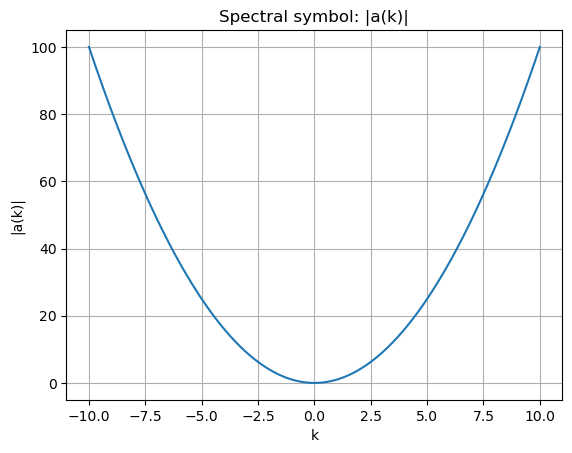


*******************
* Solving the PDE *
*******************

Closest available time to t_eval=0.0: 0.0
Test error t = 0.0: 5.367e-45


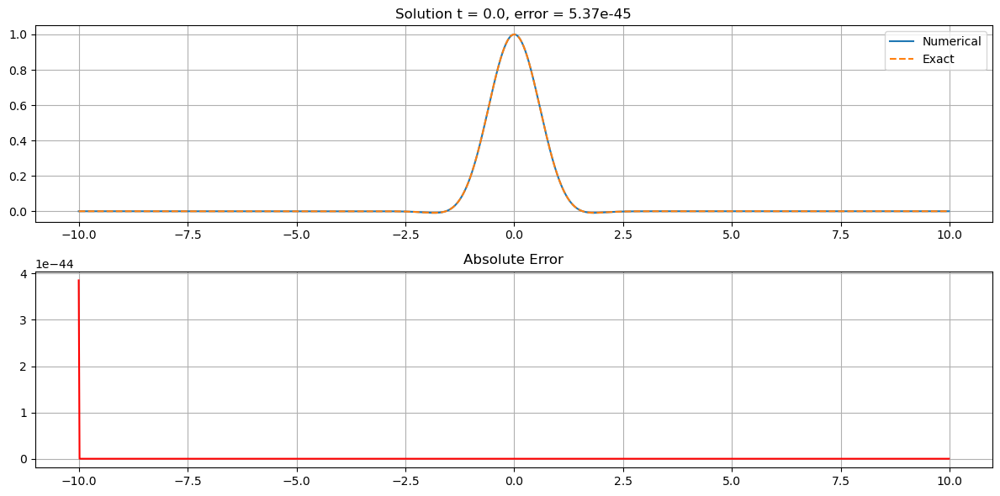

Closest available time to t_eval=0.5: 0.5
Test error t = 0.5: 4.410e-02


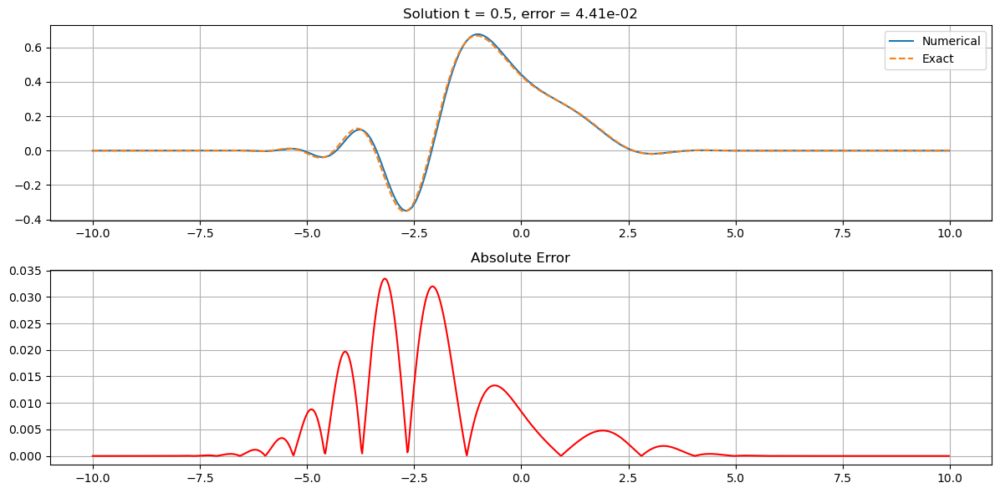

Closest available time to t_eval=1.0: 1.0
Test error t = 1.0: 4.590e-02


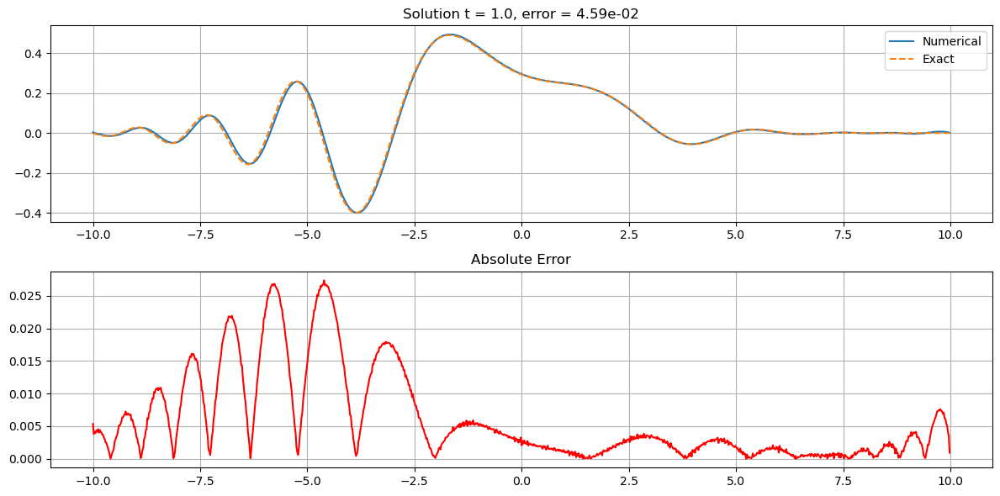

Closest available time to t_eval=1.5: 1.5
Test error t = 1.5: 9.757e-02


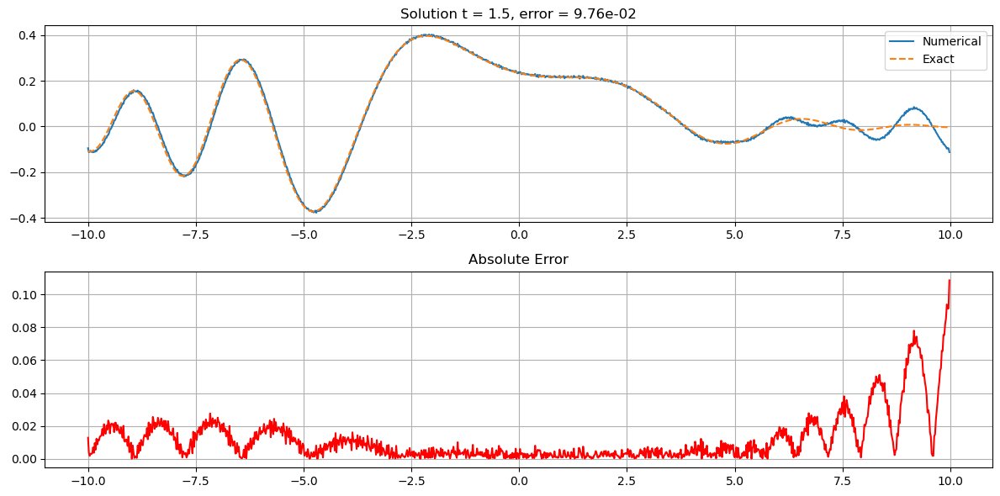

Closest available time to t_eval=2.0: 2.0
Test error t = 2.0: 2.648e-01


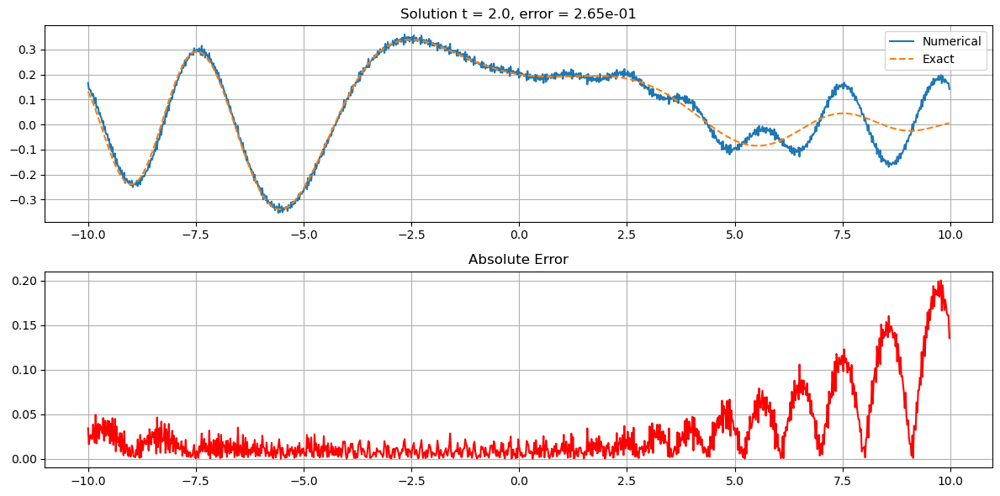

In [25]:
# Define the symbols and the 1D Schrödinger equation
t, x, kx, xi, omega = symbols('t x kx xi omega')
u_func = Function('u') 
u = u_func(t, x)

eq = Eq(I * diff(u, t), diff(u, x, x))

# Create the solver with ETD-RK4 time scheme
solver = PDESolver(eq, time_scheme='ETD-RK4', dealiasing_ratio=1/2)
Lt=2.0
# Configure the domain and initial condition: modulated Gaussian packet
solver.setup(
    Lx=20, Nx=1024, Lt=Lt, Nt=500,
    initial_condition=lambda x: np.exp(-x**2) * np.exp(1j * x)
)

# Solve
solver.solve()

# Exact solution (one of the two propagated packets, here moving to the left)
def u_exact(x, t):
    return 1 / np.sqrt(1 - 4j * t) * np.exp(1j * (x + t)) * np.exp(-((x + 2*t)**2) / (1 - 4j * t))

# Automatic testing
n_test = 4
test_set = [solver.test(u_exact=u_exact, t_eval=i * Lt / n_test, threshold=0.5, component='real') for i in range(n_test + 1)]

## 1D Schrodinger equation with psiOp


*********************************
* Partial differential equation *
*********************************

  ∂                  ⎛  2         ⎞
ⅈ⋅──(u(t, x)) = psiOp⎝-ξ , u(t, x)⎠
  ∂t                               

********************
* Equation parsing *
********************


Equation rewritten in standard form: -psiOp(-xi**2, u(t, x)) + I*Derivative(u(t, x), t)
⚠️ psiOp detected: skipping expansion for safety

Expanded equation: -psiOp(-xi**2, u(t, x)) + I*Derivative(u(t, x), t)
Analyzing term: -psiOp(-xi**2, u(t, x))
  --> Classified as pseudo linear term (psiOp)
Analyzing term: I*Derivative(u(t, x), t)
  Derivative found: Derivative(u(t, x), t)
  --> Classified as linear
Final linear terms: {Derivative(u(t, x), t): I}
Final nonlinear terms: []
Symbol terms: []
Pseudo terms: [(-1, -xi**2)]
Source terms: []
⚠️  Pseudo‑differential operator detected: all other linear terms have been rejected.

*******************************
* Linear operator computation *
****************************

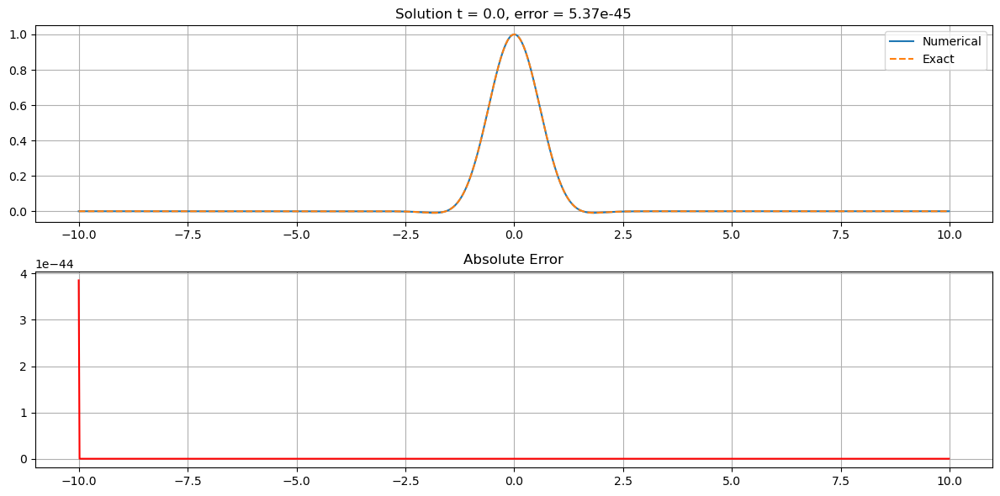

Closest available time to t_eval=0.5: 0.5
Test error t = 0.5: 4.410e-02


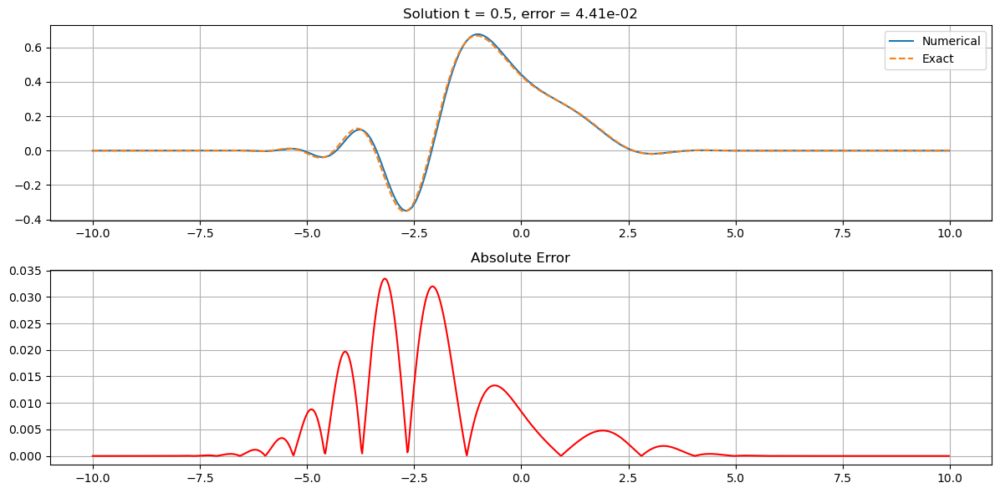

Closest available time to t_eval=1.0: 1.0
Test error t = 1.0: 4.589e-02


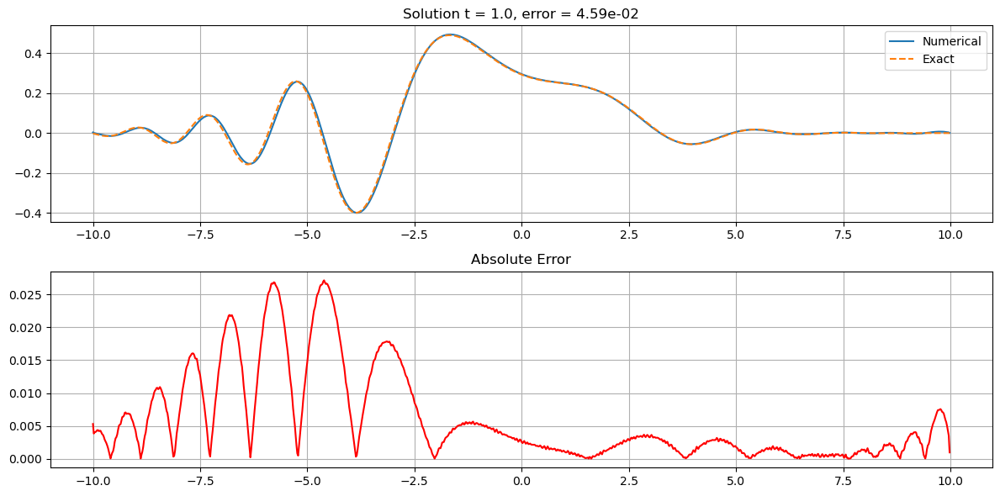

Closest available time to t_eval=1.5: 1.5
Test error t = 1.5: 9.680e-02


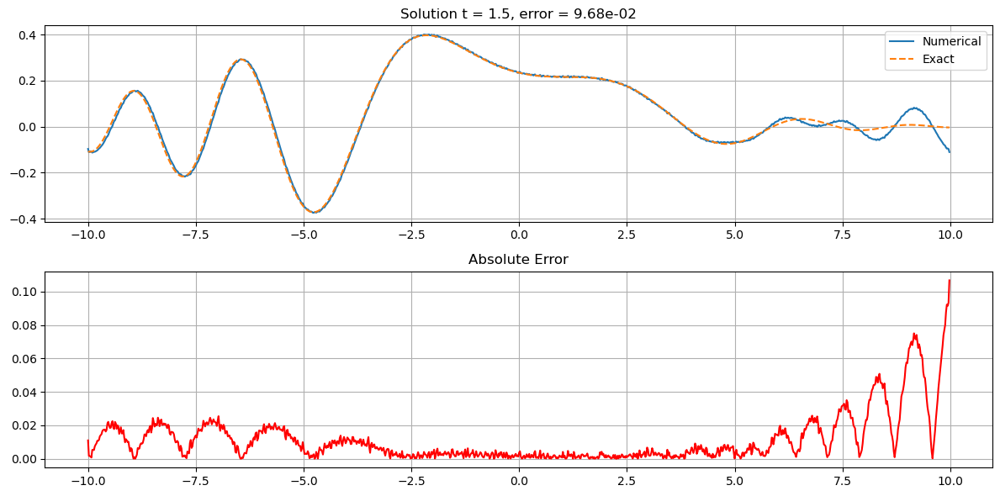

Closest available time to t_eval=2.0: 2.0
Test error t = 2.0: 2.597e-01


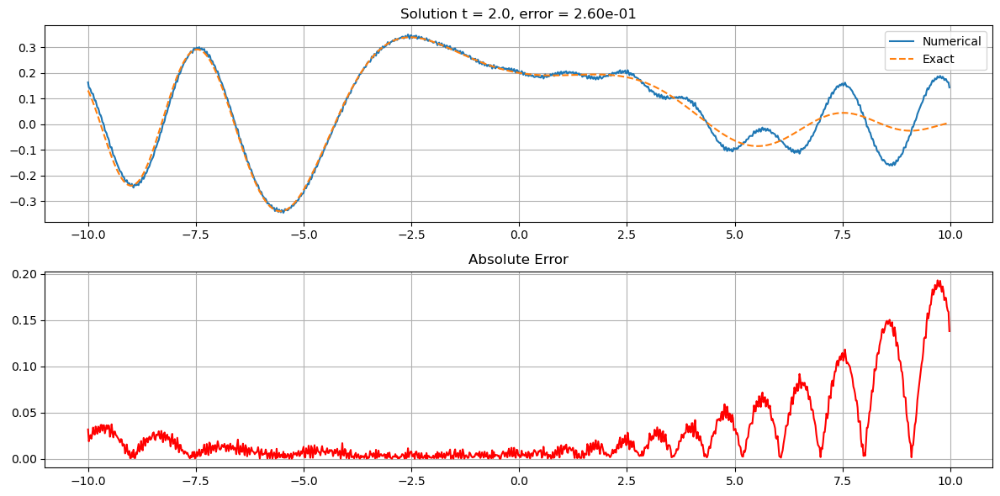

In [26]:
# Define the symbols and the 1D Schrödinger equation
t, x, kx, xi, omega = symbols('t x kx xi omega')
u_func = Function('u') 
u = u_func(t, x)

eq = Eq(I * diff(u, t), psiOp(-xi**2, u))

# Create the solver with ETD-RK4 time scheme
solver = PDESolver(eq)
Lt=2.0
# Configure the domain and initial condition: modulated Gaussian packet
solver.setup(
    Lx=20, Nx=1024, Lt=Lt, Nt=500,
    initial_condition=lambda x: np.exp(-x**2) * np.exp(1j * x)
)

# Solve
solver.solve()

# Exact solution (one of the two propagated packets, here moving to the left)
def u_exact(x, t):
    return 1 / np.sqrt(1 - 4j * t) * np.exp(1j * (x + t)) * np.exp(-((x + 2*t)**2) / (1 - 4j * t))

# Automatic testing
n_test = 4
test_set = [solver.test(u_exact=u_exact, t_eval=i * Lt / n_test, threshold=5, component='real') for i in range(n_test + 1)]

## 1D Klein-Gordon equation


*********************************
* Partial differential equation *
*********************************

 2                         2          
∂                         ∂           
───(u(t, x)) = -u(t, x) + ───(u(t, x))
  2                         2         
∂t                        ∂x          

********************
* Equation parsing *
********************


Equation rewritten in standard form: u(t, x) + Derivative(u(t, x), (t, 2)) - Derivative(u(t, x), (x, 2))

Expanded equation: u(t, x) + Derivative(u(t, x), (t, 2)) - Derivative(u(t, x), (x, 2))
Analyzing term: u(t, x)
  --> Classified as linear
Analyzing term: Derivative(u(t, x), (t, 2))
  Derivative found: Derivative(u(t, x), (t, 2))
  --> Classified as linear
Analyzing term: -Derivative(u(t, x), (x, 2))
  Derivative found: Derivative(u(t, x), (x, 2))
  --> Classified as linear
Final linear terms: {u(t, x): 1, Derivative(u(t, x), (t, 2)): 1, Derivative(u(t, x), (x, 2)): -1}
Final nonlinear terms: []
Symbol terms: []
Pseudo term

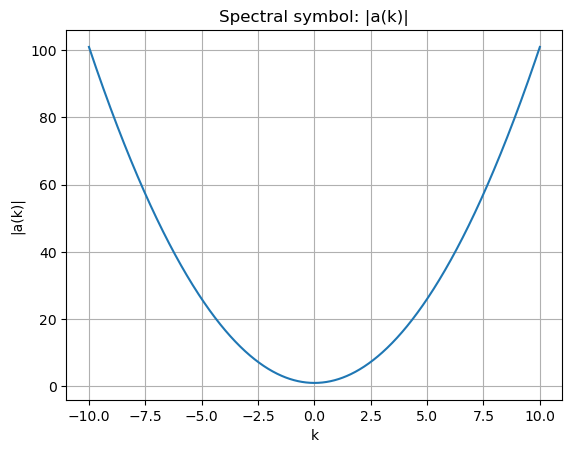


*****************************
* Wave propagation analysis *
*****************************



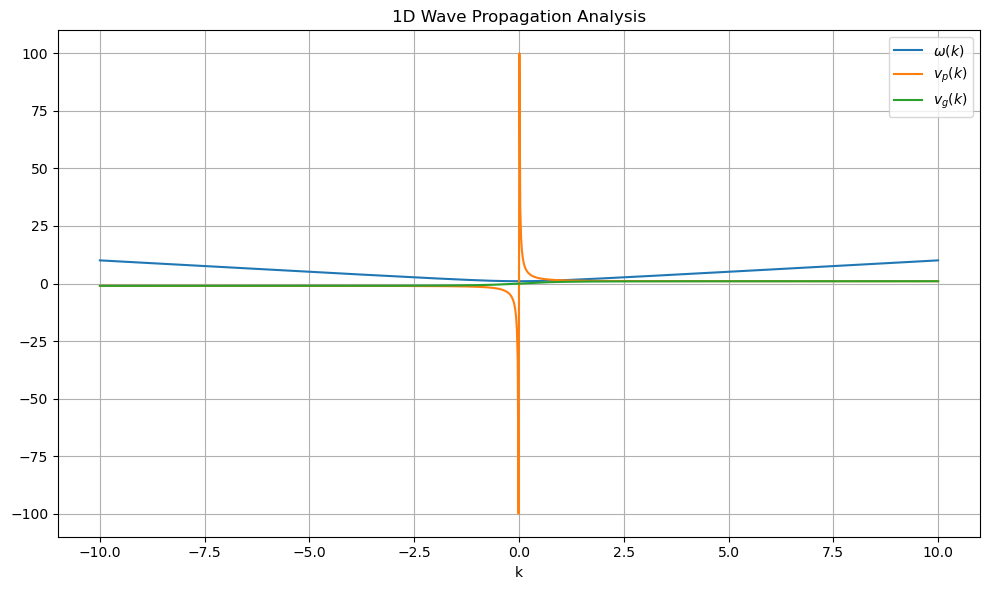


*******************
* Solving the PDE *
*******************



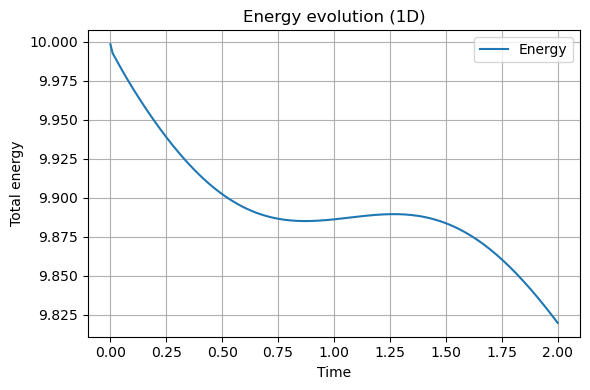

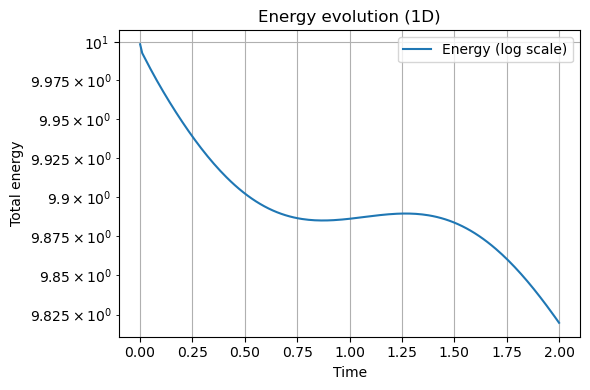

Closest available time to t_eval=0.0: 0.0
Test error t = 0.0: 8.905e-04


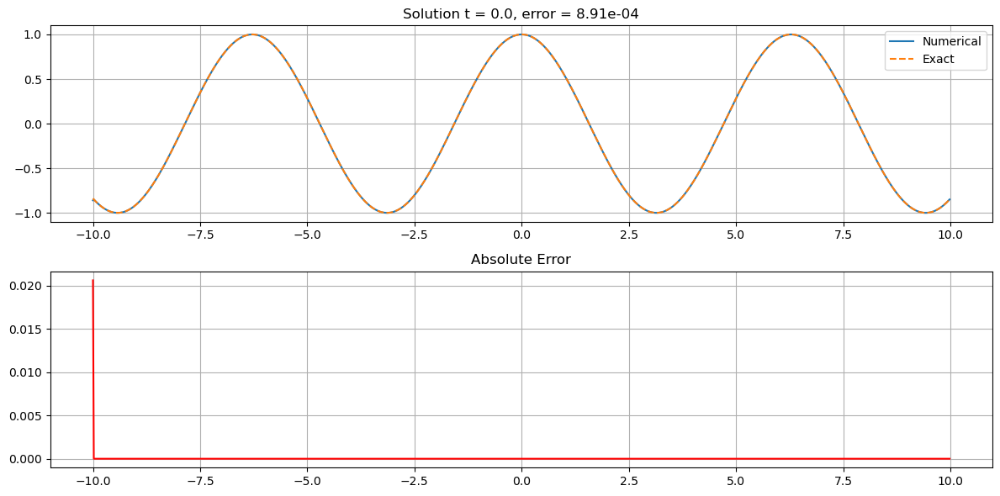

Closest available time to t_eval=0.5: 0.5
Test error t = 0.5: 6.145e-02


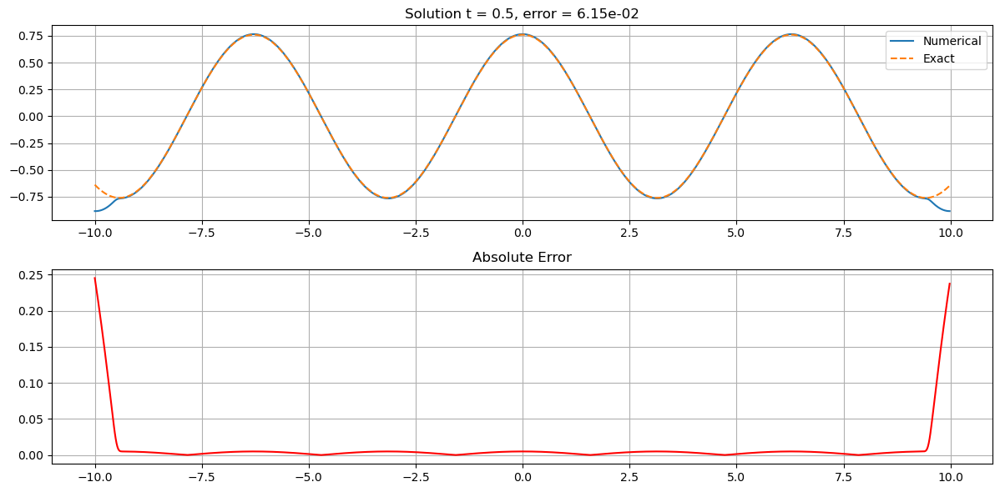

Closest available time to t_eval=1.0: 1.0
Test error t = 1.0: 6.619e-01


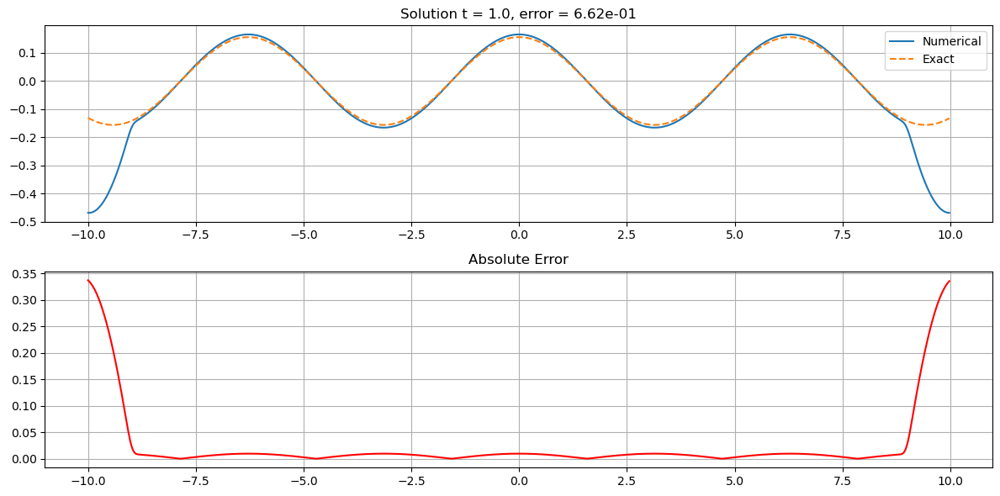

Closest available time to t_eval=1.5: 1.5
Test error t = 1.5: 2.391e-01


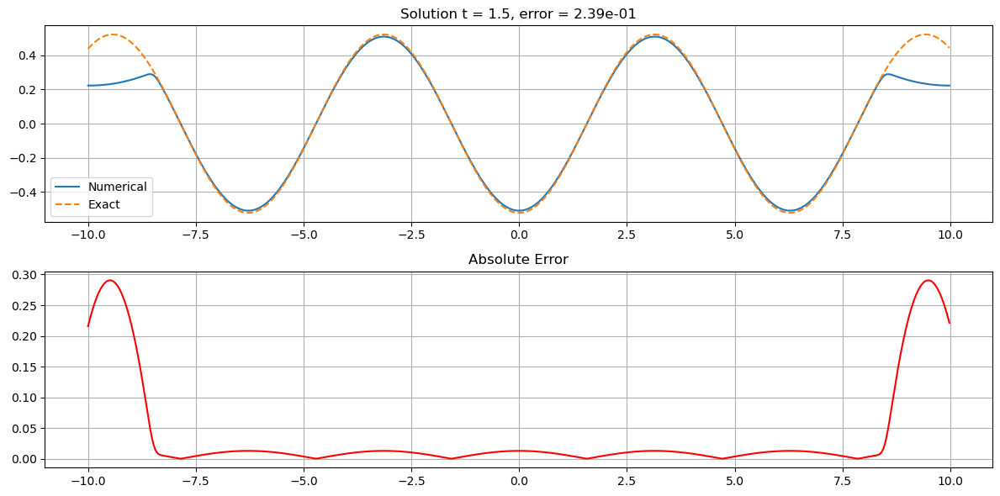

Closest available time to t_eval=2.0: 2.0
Test error t = 2.0: 1.125e-01


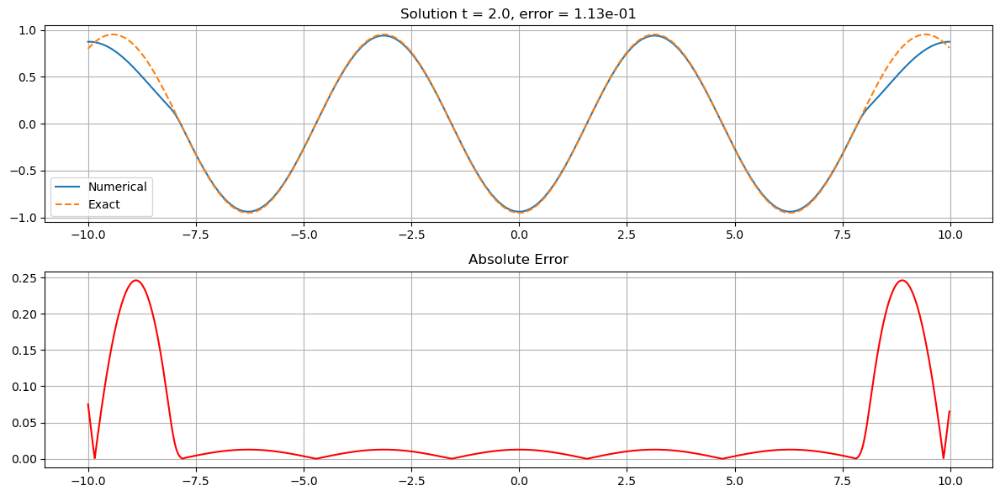

In [27]:
# Define the symbols and the Klein-Gordon equation
t, x, kx, xi, omega = symbols('t x kx xi omega')
u_func = Function('u') 
u = u_func(t, x)

eq = Eq(diff(u, t, t), diff(u, x, x) - u)

# Create the solver with ETD-RK4 scheme
solver = PDESolver(eq, time_scheme='ETD-RK4', dealiasing_ratio=1/4)
Lt=2.0
# Simulation parameters
solver.setup(
    Lx=20, Nx=1024, Lt=Lt, Nt=200,
    initial_condition=lambda x: np.cos(x),
    initial_velocity=lambda x: np.zeros_like(x)
)

# Solving
solver.solve()

solver.plot_energy()
solver.plot_energy(log=True) 

# Exact solution at t = 2: harmonic oscillation with frequency sqrt(2)
def u_exact(x, t):
    return np.cos(np.sqrt(2) * t) * np.cos(x)

# Automatic testing
n_test = 4
test_set = [solver.test(u_exact=u_exact, t_eval=i * Lt / n_test, threshold=5, component='real') for i in range(n_test + 1)]


## 1D biharmonic equation


*********************************
* Partial differential equation *
*********************************

                4          
∂              ∂           
──(u(t, x)) = -───(u(t, x))
∂t               4         
               ∂x          

********************
* Equation parsing *
********************


Equation rewritten in standard form: Derivative(u(t, x), t) + Derivative(u(t, x), (x, 4))

Expanded equation: Derivative(u(t, x), t) + Derivative(u(t, x), (x, 4))
Analyzing term: Derivative(u(t, x), t)
  Derivative found: Derivative(u(t, x), t)
  --> Classified as linear
Analyzing term: Derivative(u(t, x), (x, 4))
  Derivative found: Derivative(u(t, x), (x, 4))
  --> Classified as linear
Final linear terms: {Derivative(u(t, x), t): 1, Derivative(u(t, x), (x, 4)): 1}
Final nonlinear terms: []
Symbol terms: []
Pseudo terms: []
Source terms: []

*******************************
* Linear operator computation *
*******************************


Characteristic equation before symbol treat

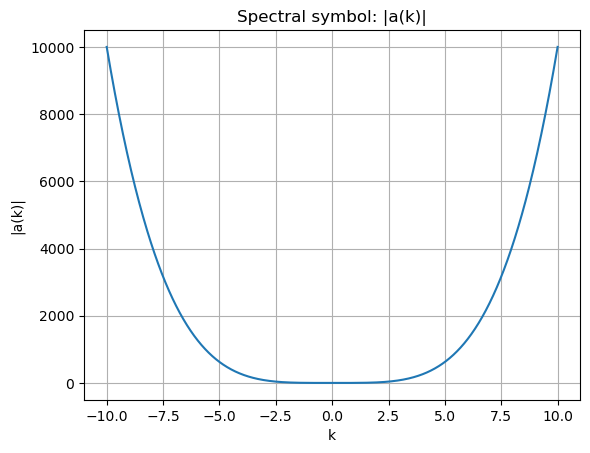


*******************
* Solving the PDE *
*******************

Closest available time to t_eval=0.0: 0.0
Test error t = 0.0: 6.134e-03


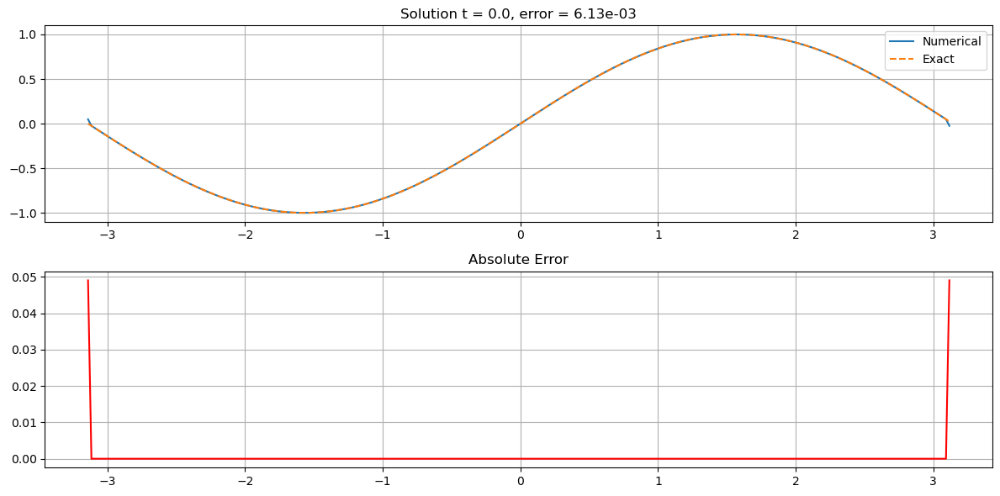

Closest available time to t_eval=0.25: 0.25
Test error t = 0.25: 7.655e-03


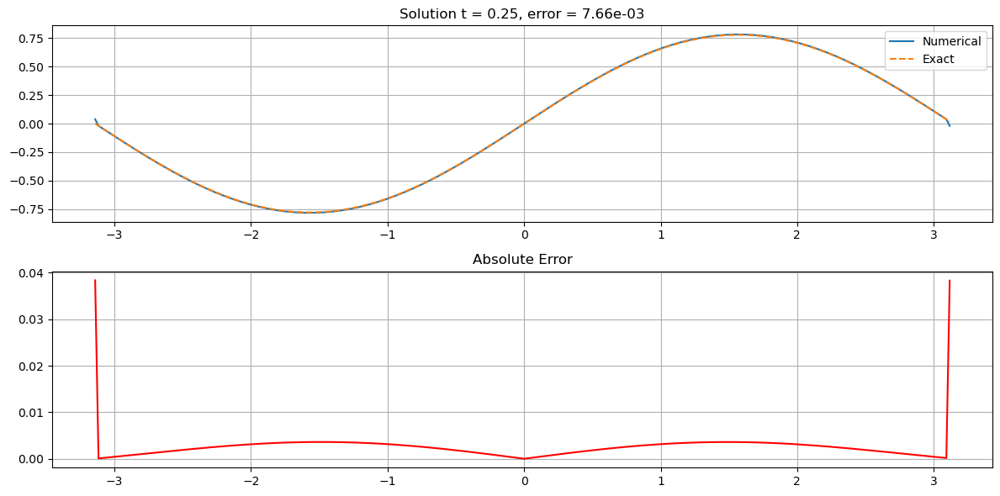

Closest available time to t_eval=0.5: 0.5
Test error t = 0.5: 7.383e-03


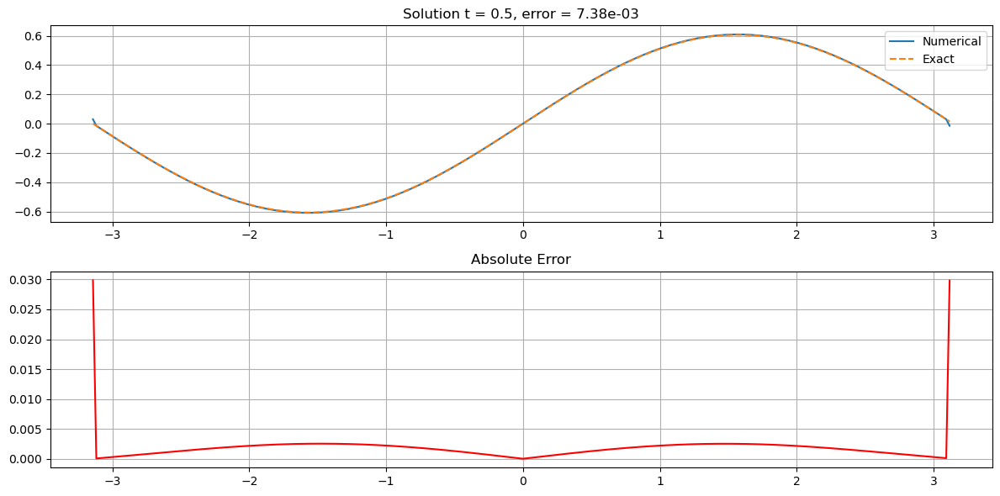

Closest available time to t_eval=0.75: 0.75
Test error t = 0.75: 7.131e-03


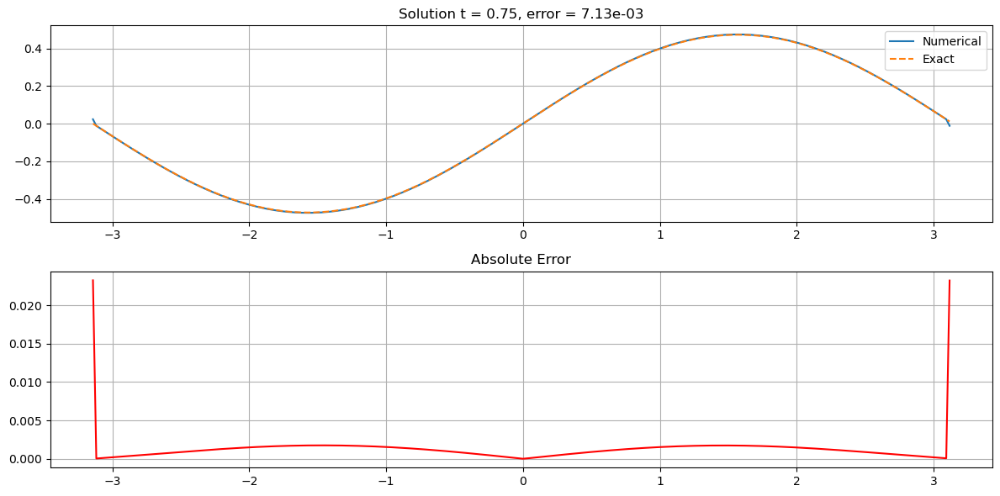

Closest available time to t_eval=1.0: 1.0
Test error t = 1.0: 6.903e-03


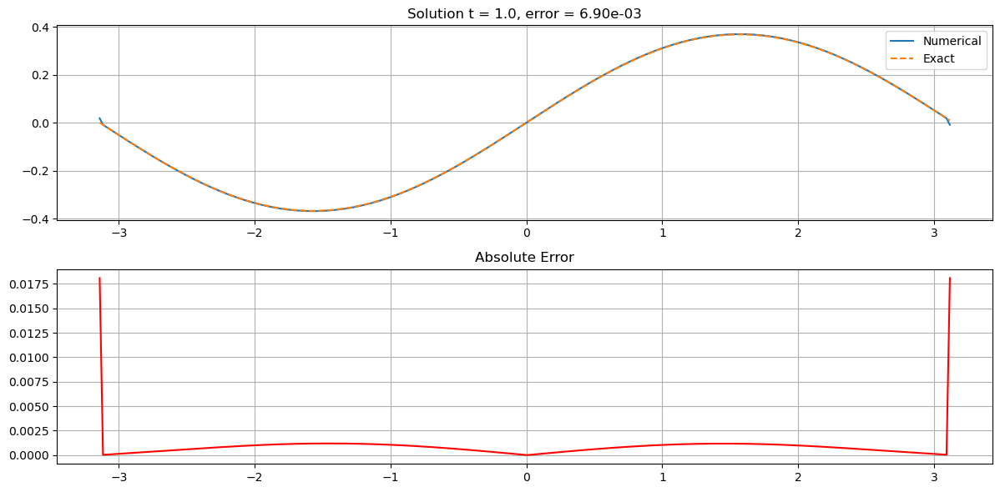

In [28]:
# Definition of the 1D biharmonic equation
t, x, kx, xi, omega = symbols('t x kx xi omega')
u_func = Function('u') 
u = u_func(t, x)

biharmonic_eq = Eq(diff(u, t), -diff(u, x, x, x, x))

# Creation of the solver with periodic boundary conditions
solver = PDESolver(biharmonic_eq)

# Configuration of the domain and initial condition
Lx = 2 * np.pi
Nx = 256
Lt = 1.0
Nt = 200

solver.setup(
    Lx=Lx, Nx=Nx,
    Lt=Lt, Nt=Nt,
    initial_condition=lambda x: np.sin(x)
)

# Solving
solver.solve()

# Exact solution
def u_exact(x, t):
    return np.sin(x) * np.exp(-t)

# Automatic testing
n_test = 4
test_set = [solver.test(u_exact=u_exact, t_eval=i * Lt / n_test, threshold=5e-2, component='real') for i in range(n_test + 1)]